# HOUSING: PRICE PREDICTION (Surprise Housing)

### Problem Statement :
   Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.
    A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

## Objective :
The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:
     
1) Which variables are important to predict the price of variable?
     
2) How do these variables describe the price of the house?


## Problem Defination :
We are required to model the price of houses with the available independent variables. This model will then be used by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the management to understand the pricing dynamics of a new market.

# Exploring Data :

## Importing Required Libraries :

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import warnings 
warnings.filterwarnings("ignore")



Here in this problem we are provided with training data and a testing data , i have decided to treat them simultaneously, so it won't create any confussion in our further problem solving. 
Importing the trainning data and testing data.

In [3]:
df = pd.read_csv("/Users/shubh/Desktop/Project-Housing_splitted/train.csv")
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,289,20,RL,NaN,9819,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,122000
1164,554,20,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,5,2009,WD,Normal,108000
1165,196,160,RL,24.0,2280,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,WD,Normal,148500
1166,31,70,C (all),50.0,8500,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,7,2008,WD,Normal,40000


Importing Testing data:

In [12]:
df1 = pd.read_csv("/Users/shubh/Desktop/Project-Housing_splitted/test.csv")
df1

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,...,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,...,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,83,20,RL,78.0,10206,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2008,WD,Normal
288,1048,20,RL,57.0,9245,Pave,NaN,IR2,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
289,17,20,RL,NaN,11241,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Shed,700,3,2010,WD,Normal
290,523,50,RM,50.0,5000,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,10,2006,WD,Normal


In [13]:
#To print all columns and rows
pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

Both out testing and training data has been imported, training data have 81 (consist of feature and target) columns and testing have only 80 (consist of features only) columns.

# Exploratory Data Analysis:

In [8]:
#checking Shape of testing dataset
df.shape

(1168, 81)

In this trainig dataset we have 1168 rows and 81 columns (80 of which are features/ variables and 1 of them is our label)

In [6]:
#checking shape of trainning dataset
df1.shape

(292, 80)

In this testing dataset we have 292 roows and 80 columns, noo any label present in the testing dataset i.e. we have to test our model and predict the label for this dataset.

In [9]:
#Checking column names of train dataset
df.columns


Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [10]:
#Checking all column names of test dataset
df1.columns


Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

From this test dataset "SalePrice" column is missing, proobably may be our target/label.

In [14]:
#Checking the data types of all columns in train dataset
df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [15]:
#Checking the data types of all columns in test dataset
df1.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [16]:
#Checking the info about the train dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [17]:
df.isnull().sum()

Id                  0
MSSubClass          0
MSZoning            0
LotFrontage       214
LotArea             0
Street              0
Alley            1091
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
OverallQual         0
OverallCond         0
YearBuilt           0
YearRemodAdd        0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          7
MasVnrArea          7
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           30
BsmtCond           30
BsmtExposure       31
BsmtFinType1       30
BsmtFinSF1          0
BsmtFinType2       31
BsmtFinSF2          0
BsmtUnfSF           0
TotalBsmtSF         0
Heating             0
HeatingQC           0
CentralAir          0
Electrical          0
1stFlrSF            0
2ndFlrSF            0
LowQualFin

1) Above is the info about training dataset and we can see observe missing values in the dataset. I have to take care of those missing values.

2) And columns like [Alley, PoolQC, Fence and MiscFeature] contain a large amount of null values approximatly above 75% , so i've decided to drop these columns.

In [18]:
#Dropping unnecessary columns in train dataset
df = df.drop(["Alley"],axis=1)
df = df.drop(["PoolQC"],axis=1)
df = df.drop(["Fence"],axis=1)
df = df.drop(["MiscFeature"],axis=1)

In [20]:
#Checking the info about the test dataset
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

In [21]:
df1.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
Alley            278
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath 

1) Above is the info about testing dataset and i can see some missing values in the dataset. Which i have to take care further .

2) And columns like [Alley, PoolQC, Fence and MiscFeature] contain a large amount of null values approximatly above 80% , so i've decided to drop these columns.

In [24]:
#Dropping unnecessary columns in test dataset
df1 = df1.drop(["Alley"],axis=1)
df1 = df1.drop(["PoolQC"],axis=1)
df1 = df1.drop(["Fence"],axis=1)
df1 = df1.drop(["MiscFeature"],axis=1)

In [25]:
#Checking unique values of each column in train dataset
df.nunique()

Id               1168
MSSubClass         15
MSZoning            5
LotFrontage       106
LotArea           892
Street              2
LotShape            4
LandContour         4
Utilities           1
LotConfig           5
LandSlope           3
Neighborhood       25
Condition1          9
Condition2          8
BldgType            5
HouseStyle          8
OverallQual        10
OverallCond         9
YearBuilt         110
YearRemodAdd       61
RoofStyle           6
RoofMatl            8
Exterior1st        14
Exterior2nd        15
MasVnrType          4
MasVnrArea        283
ExterQual           4
ExterCond           5
Foundation          6
BsmtQual            4
BsmtCond            4
BsmtExposure        4
BsmtFinType1        6
BsmtFinSF1        551
BsmtFinType2        6
BsmtFinSF2        122
BsmtUnfSF         681
TotalBsmtSF       636
Heating             6
HeatingQC           5
CentralAir          2
Electrical          5
1stFlrSF          669
2ndFlrSF          351
LowQualFinSF       21
GrLivArea 

1) In Id column the unique count is 1168 which means all the values in the column are unique and ID is the identity number given for perticular asset so this ID has nothing to do with model training so i can drop this column.

2) In Utilities column unique value count is 1 which means all the entries are same this will not help us in model building so let me drop this column.

In [26]:
#Dropping unnecessary columns in train dataset
df = df.drop(["Id"],axis=1)
df = df.drop(["Utilities"],axis=1)

In [27]:
#Checking unique values of each column in test dataset
df1.nunique()

Id               292
MSSubClass        15
MSZoning           4
LotFrontage       65
LotArea          249
Street             2
LotShape           4
LandContour        4
Utilities          2
LotConfig          5
LandSlope          3
Neighborhood      24
Condition1         8
Condition2         2
BldgType           5
HouseStyle         8
OverallQual        8
OverallCond        7
YearBuilt         84
YearRemodAdd      57
RoofStyle          5
RoofMatl           3
Exterior1st       12
Exterior2nd       14
MasVnrType         4
MasVnrArea       104
ExterQual          4
ExterCond          4
Foundation         6
BsmtQual           4
BsmtCond           3
BsmtExposure       4
BsmtFinType1       6
BsmtFinSF1       184
BsmtFinType2       6
BsmtFinSF2        32
BsmtUnfSF        231
TotalBsmtSF      224
Heating            4
HeatingQC          4
CentralAir         2
Electrical         4
1stFlrSF         238
2ndFlrSF         113
LowQualFinSF       4
GrLivArea        246
BsmtFullBath       3
BsmtHalfBath 

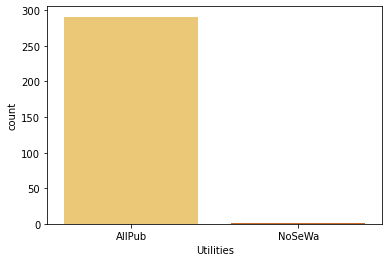

In [31]:
# plt.figure(figsize=(22,7))
sns.countplot(df1['Utilities'], data=df1, palette="YlOrBr");



1) In Id column the unique count is 292 which means all the values in the column are unique and ID is the identitity number given for perticular asset so this ID has nothing to do with model training so I can drop this column.

2) Since I have droped Utilities in train i have to drop here also. 
And also there is only single diffrent entries 291 entries are similar.

In [33]:
#Dropping unnecessary columns in test dataset
df1 = df1.drop(["Id"],axis=1)
df1 = df1.drop(["Utilities"],axis=1)

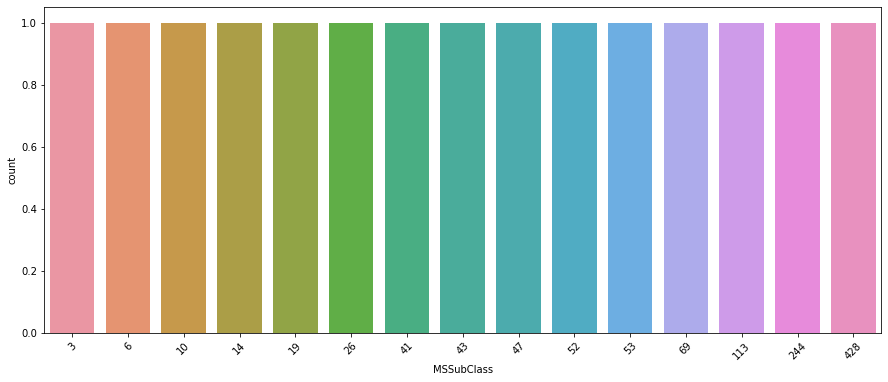

<Figure size 432x288 with 0 Axes>

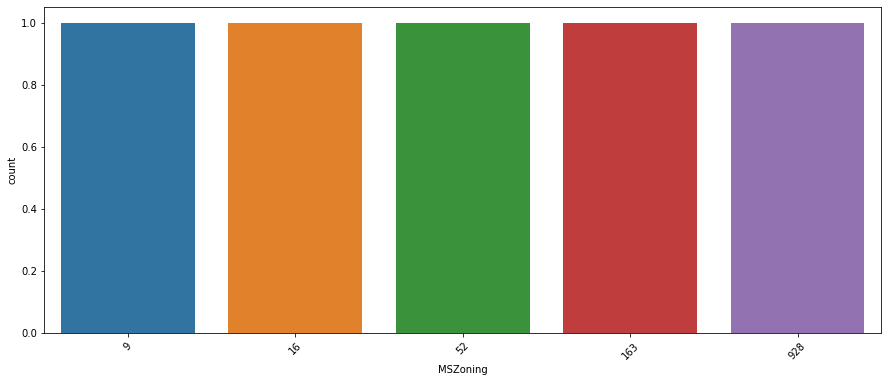

<Figure size 432x288 with 0 Axes>

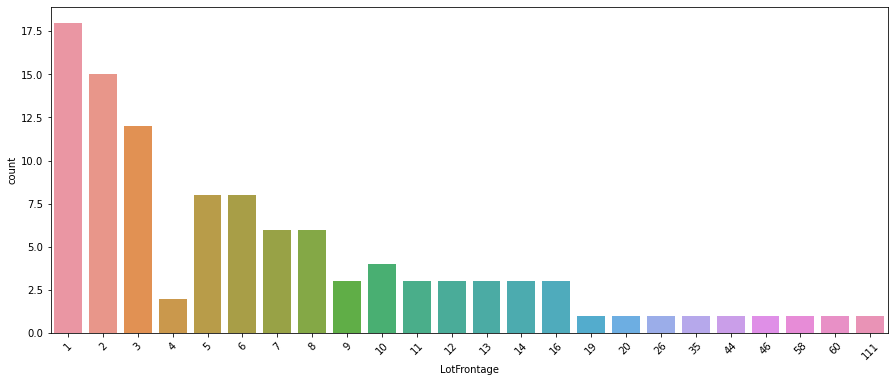

<Figure size 432x288 with 0 Axes>

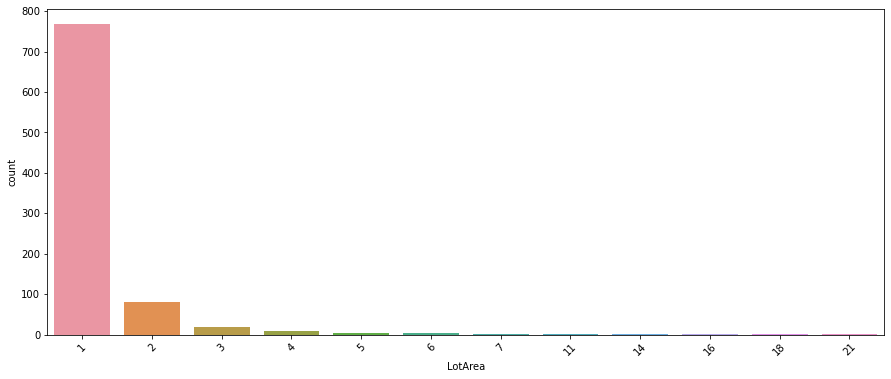

<Figure size 432x288 with 0 Axes>

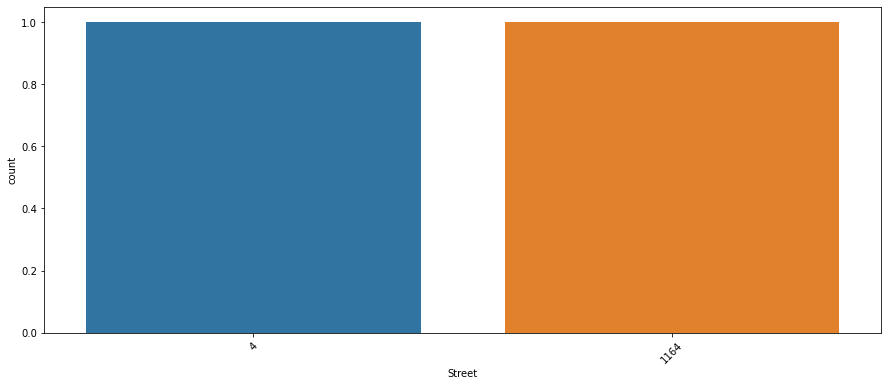

<Figure size 432x288 with 0 Axes>

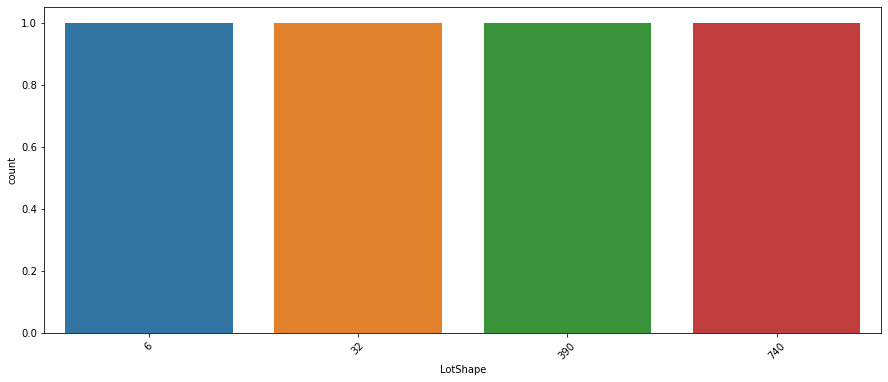

<Figure size 432x288 with 0 Axes>

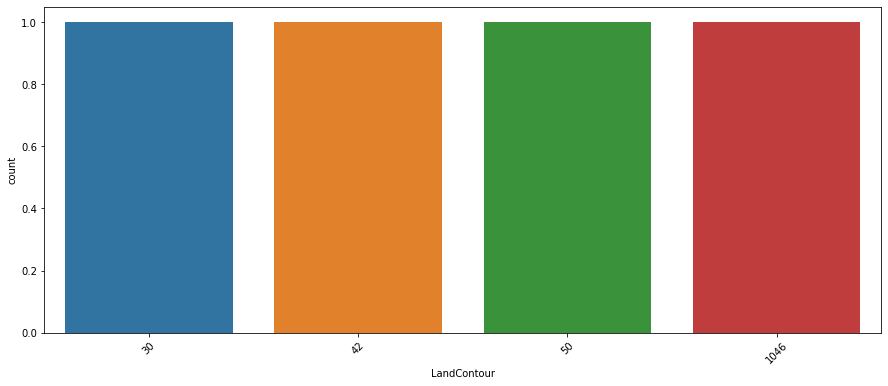

<Figure size 432x288 with 0 Axes>

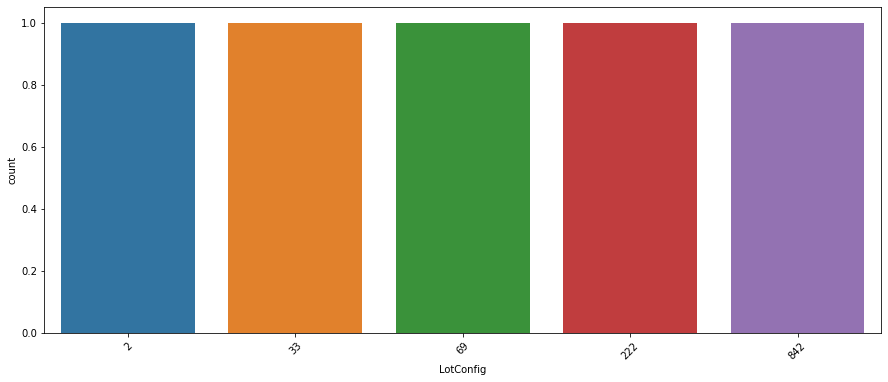

<Figure size 432x288 with 0 Axes>

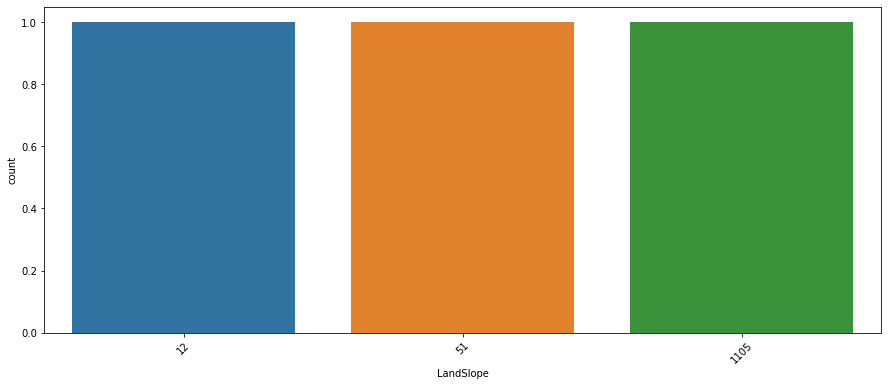

<Figure size 432x288 with 0 Axes>

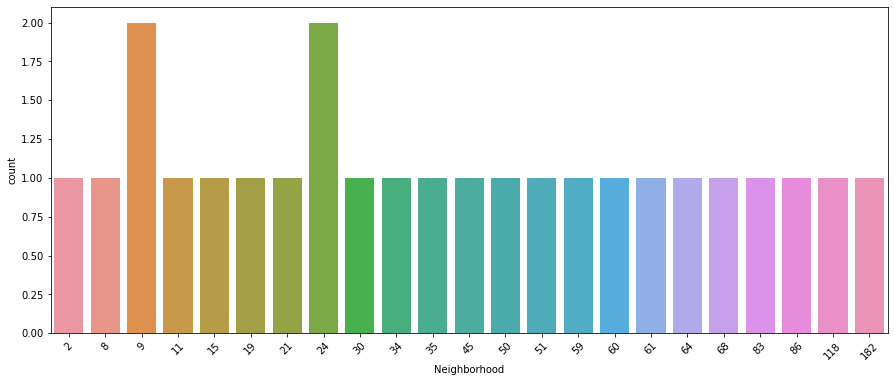

<Figure size 432x288 with 0 Axes>

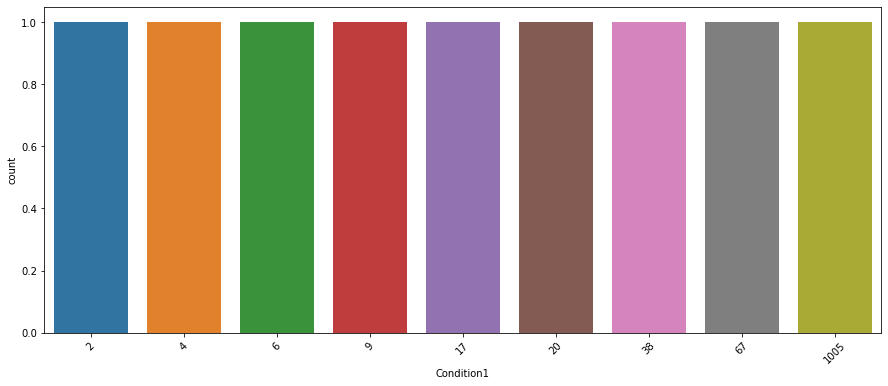

<Figure size 432x288 with 0 Axes>

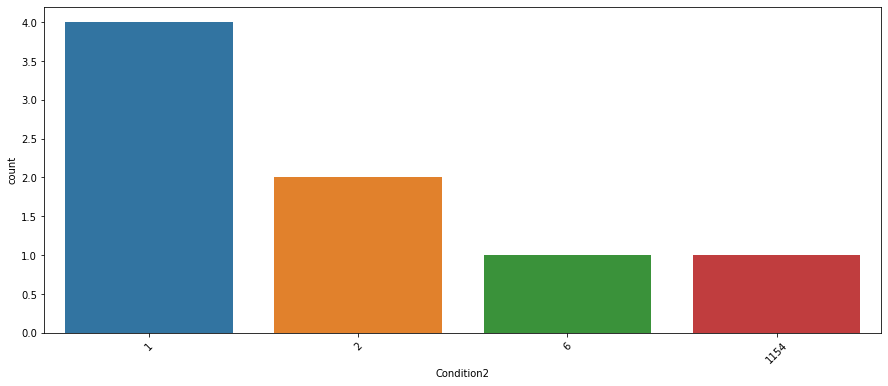

<Figure size 432x288 with 0 Axes>

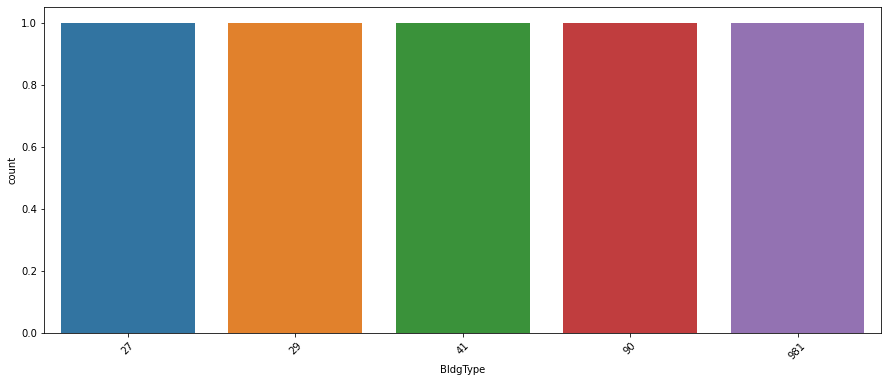

<Figure size 432x288 with 0 Axes>

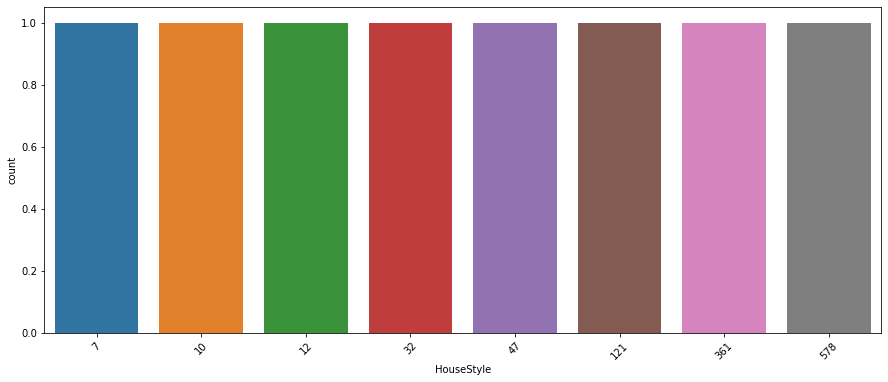

<Figure size 432x288 with 0 Axes>

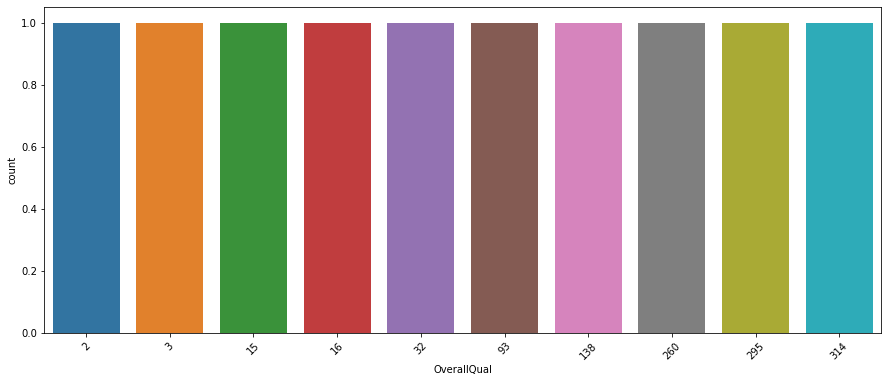

<Figure size 432x288 with 0 Axes>

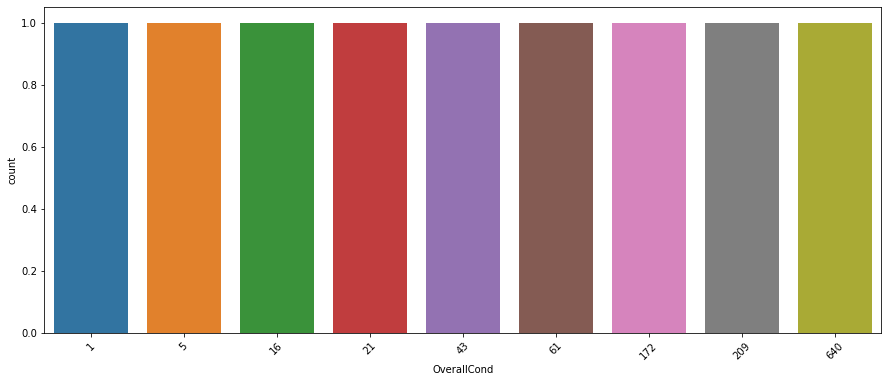

<Figure size 432x288 with 0 Axes>

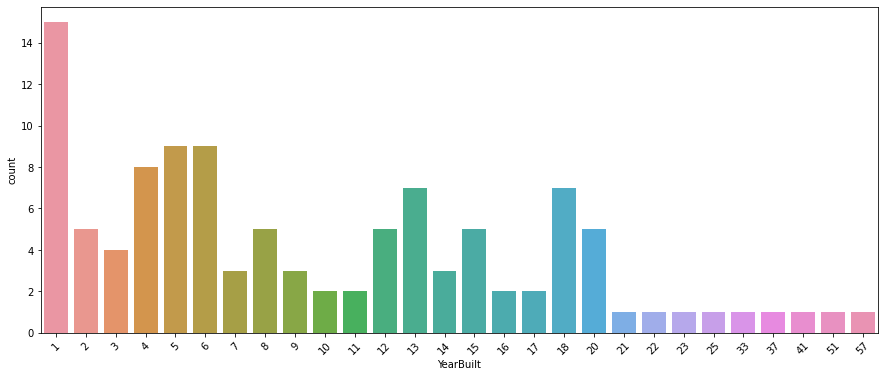

<Figure size 432x288 with 0 Axes>

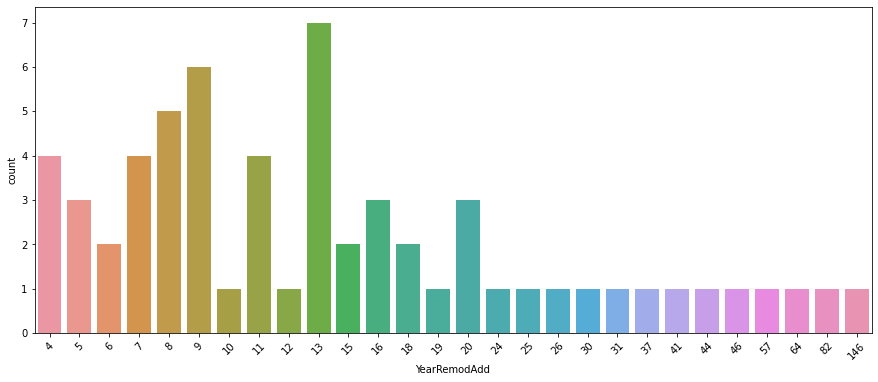

<Figure size 432x288 with 0 Axes>

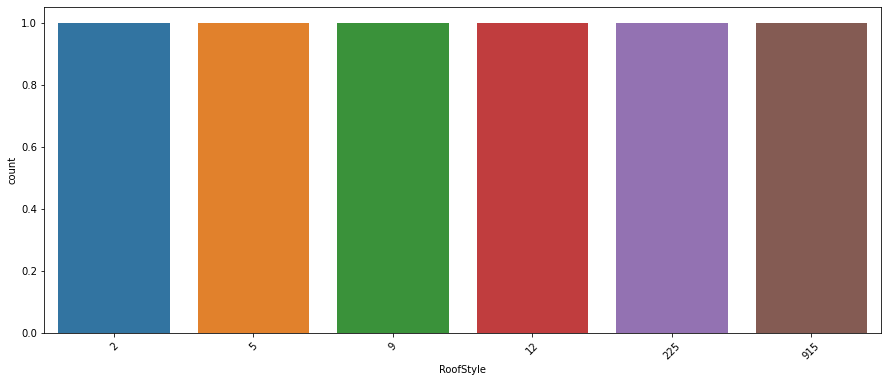

<Figure size 432x288 with 0 Axes>

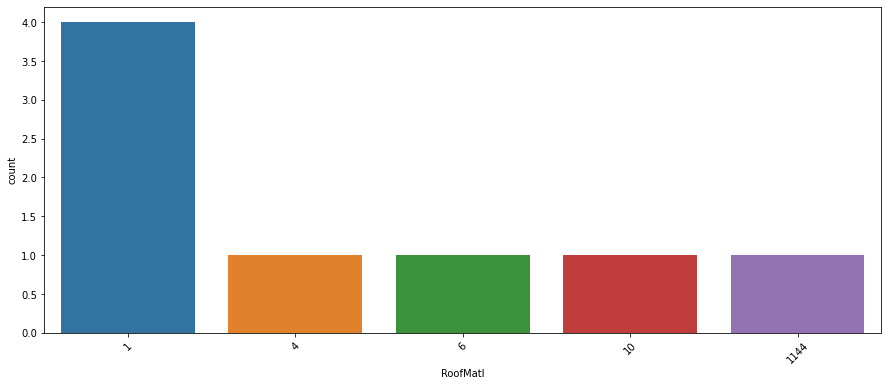

<Figure size 432x288 with 0 Axes>

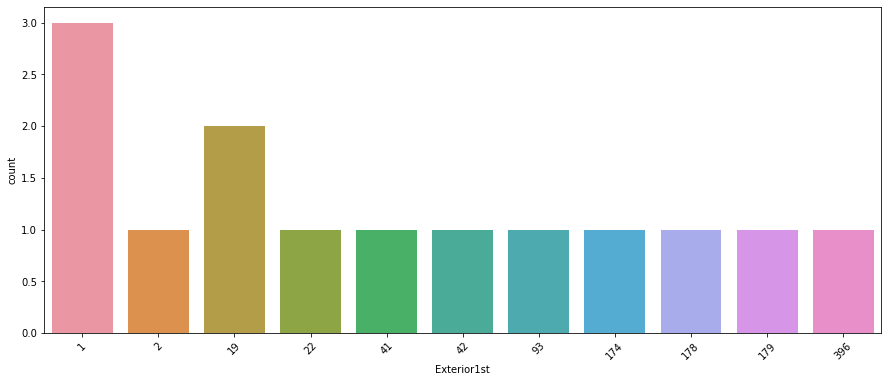

<Figure size 432x288 with 0 Axes>

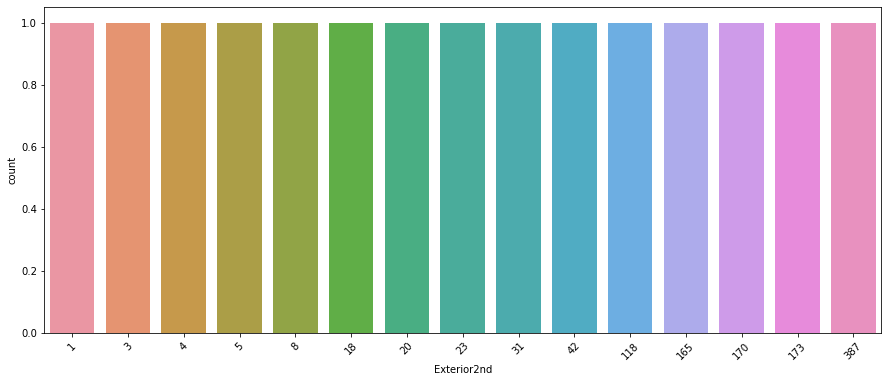

<Figure size 432x288 with 0 Axes>

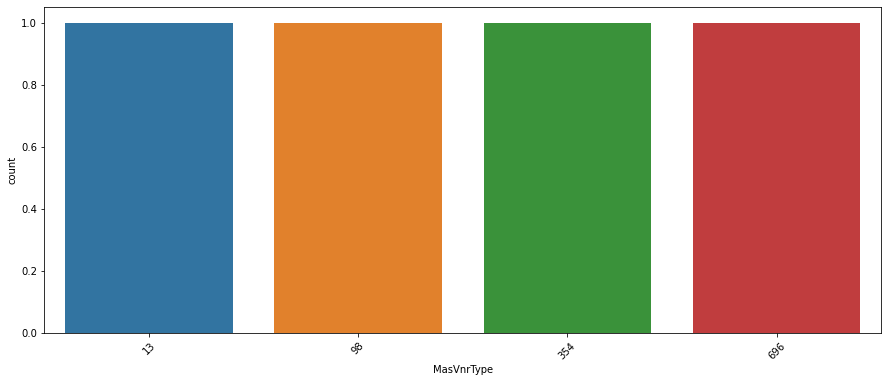

<Figure size 432x288 with 0 Axes>

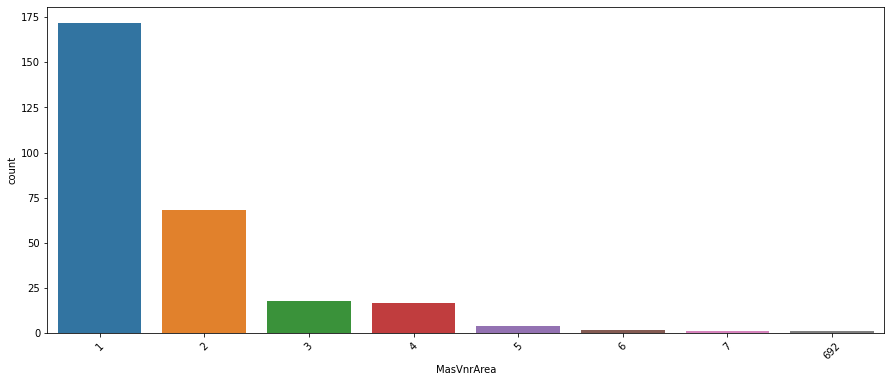

<Figure size 432x288 with 0 Axes>

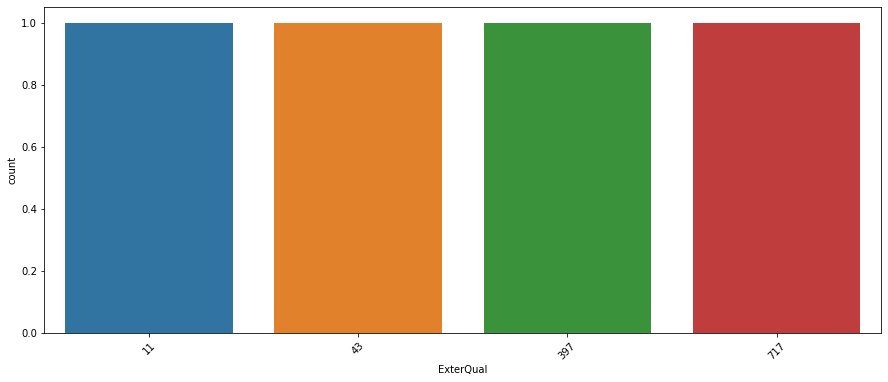

<Figure size 432x288 with 0 Axes>

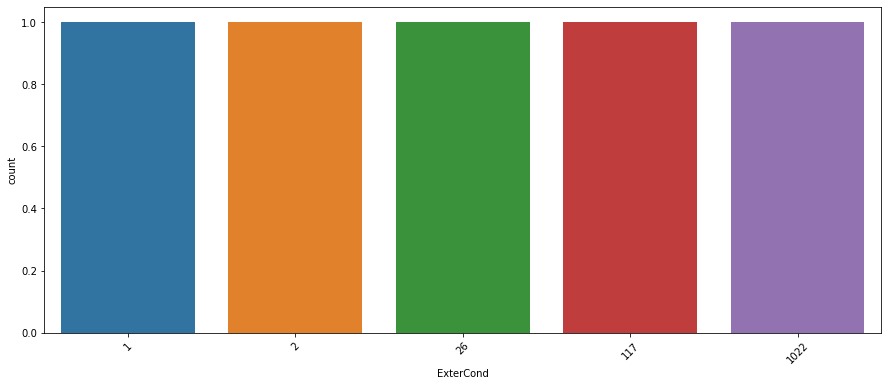

<Figure size 432x288 with 0 Axes>

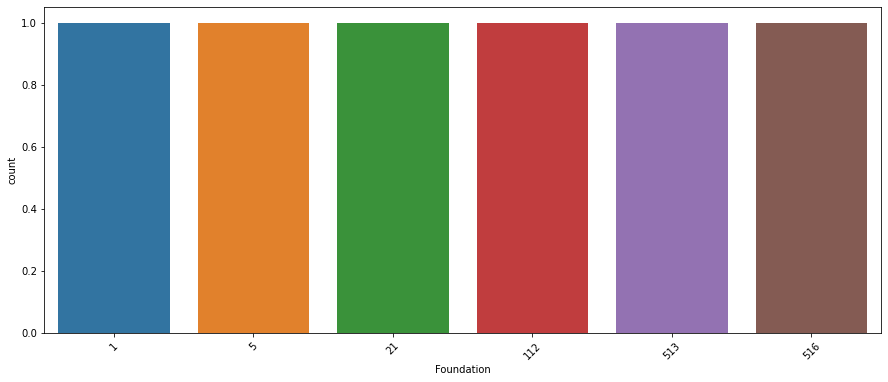

<Figure size 432x288 with 0 Axes>

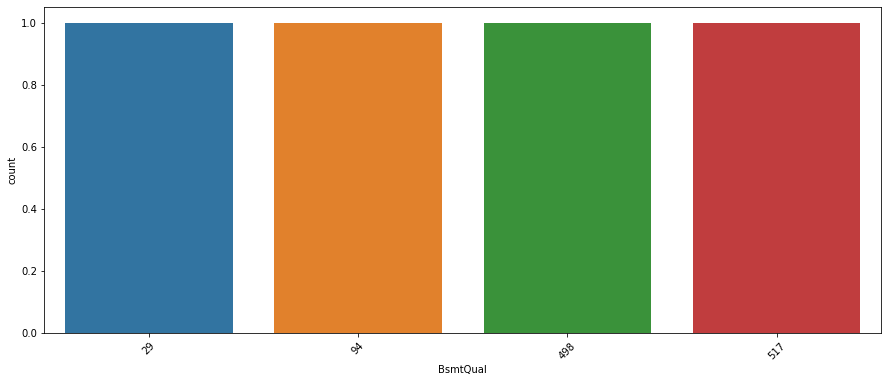

<Figure size 432x288 with 0 Axes>

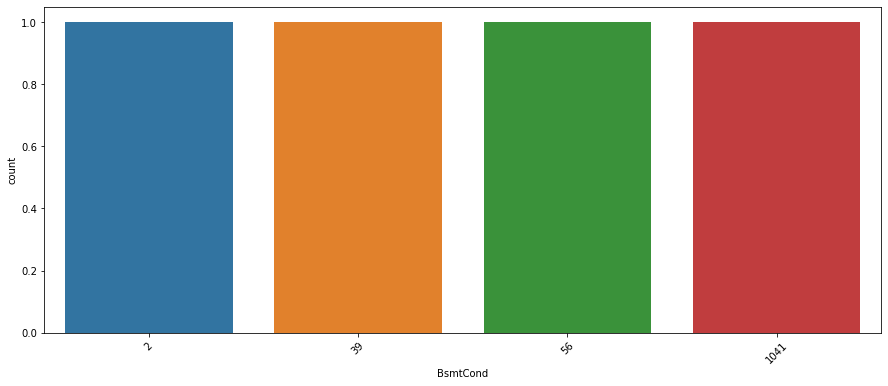

<Figure size 432x288 with 0 Axes>

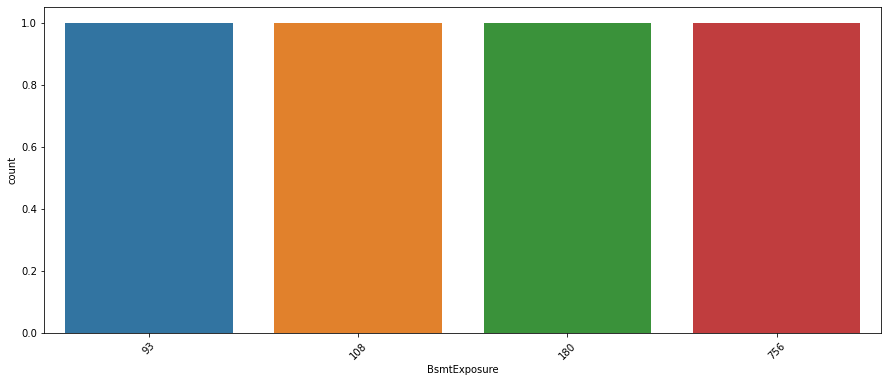

<Figure size 432x288 with 0 Axes>

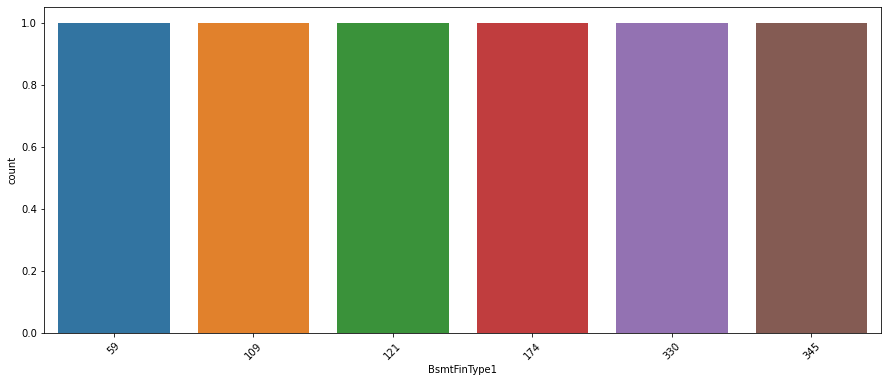

<Figure size 432x288 with 0 Axes>

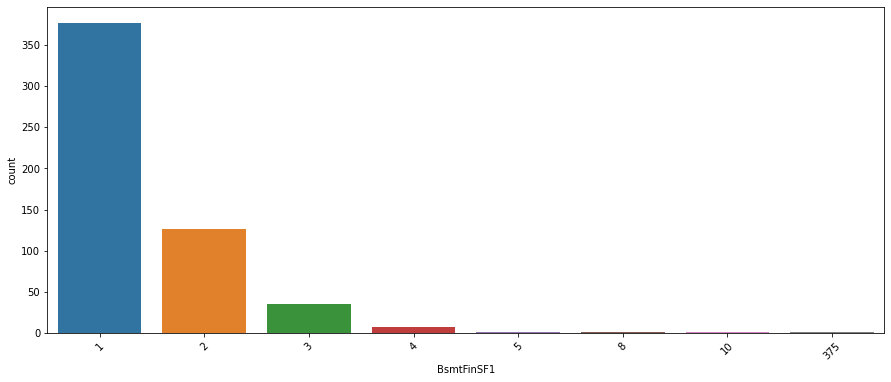

<Figure size 432x288 with 0 Axes>

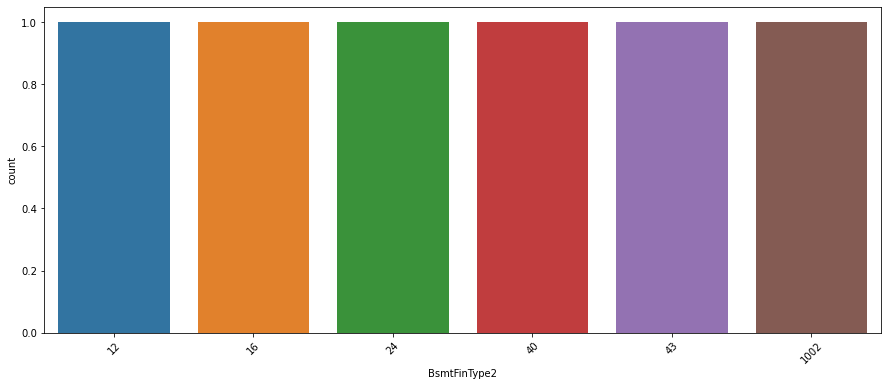

<Figure size 432x288 with 0 Axes>

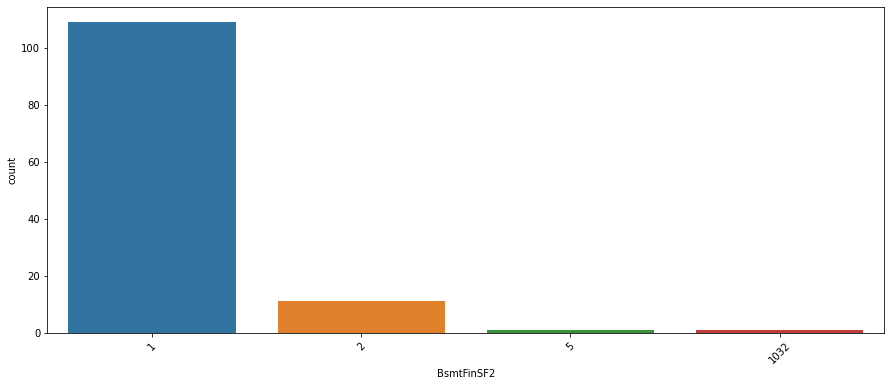

<Figure size 432x288 with 0 Axes>

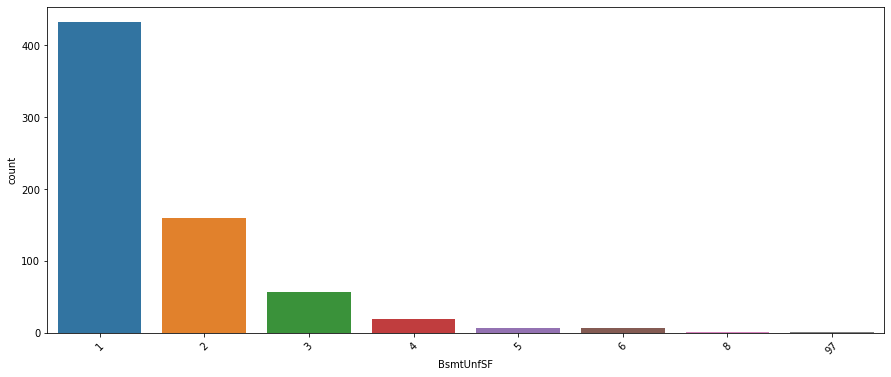

<Figure size 432x288 with 0 Axes>

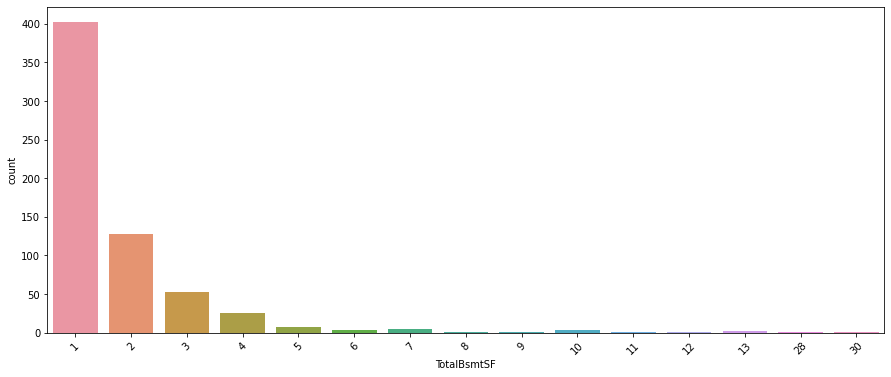

<Figure size 432x288 with 0 Axes>

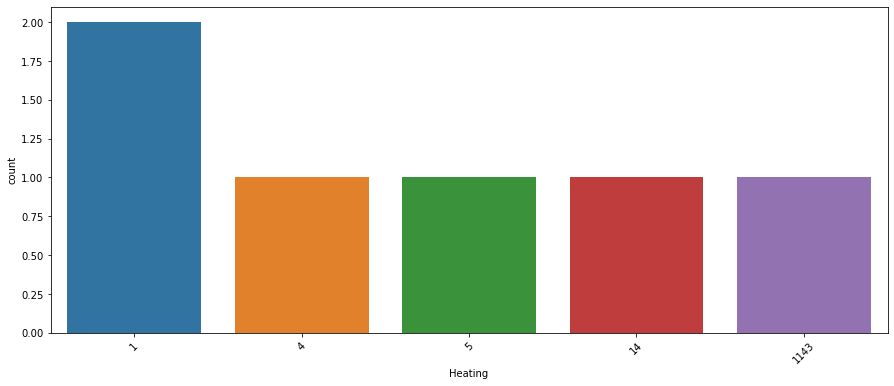

<Figure size 432x288 with 0 Axes>

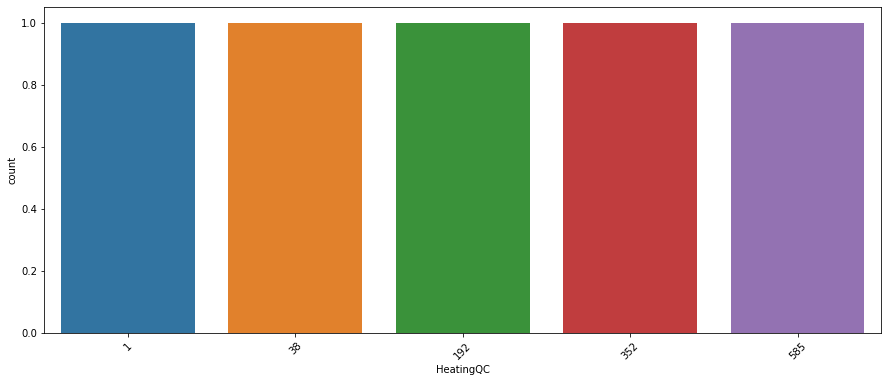

<Figure size 432x288 with 0 Axes>

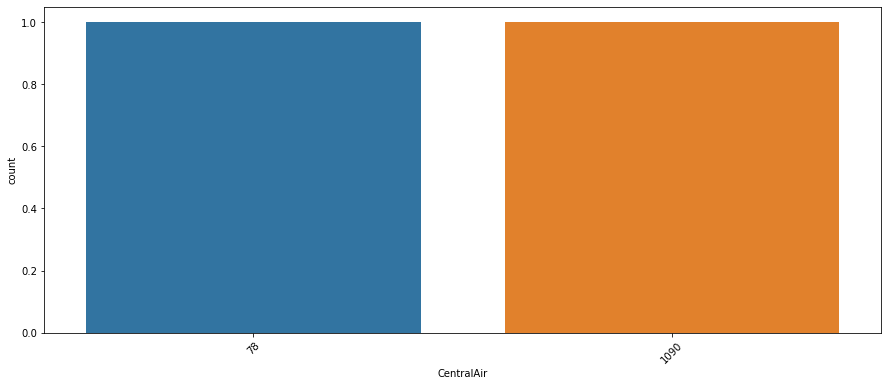

<Figure size 432x288 with 0 Axes>

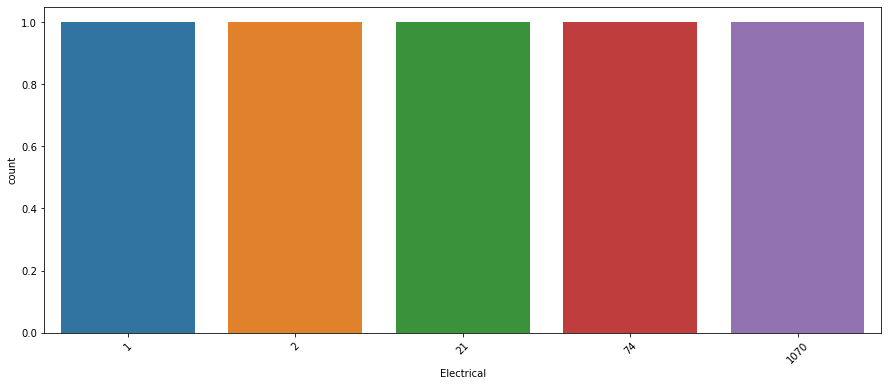

<Figure size 432x288 with 0 Axes>

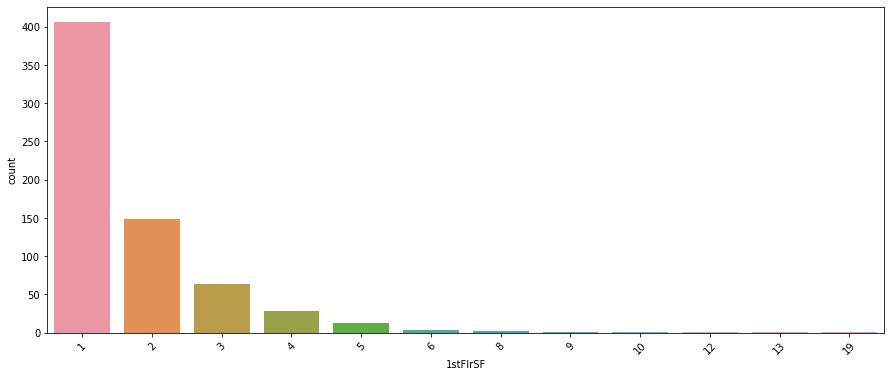

<Figure size 432x288 with 0 Axes>

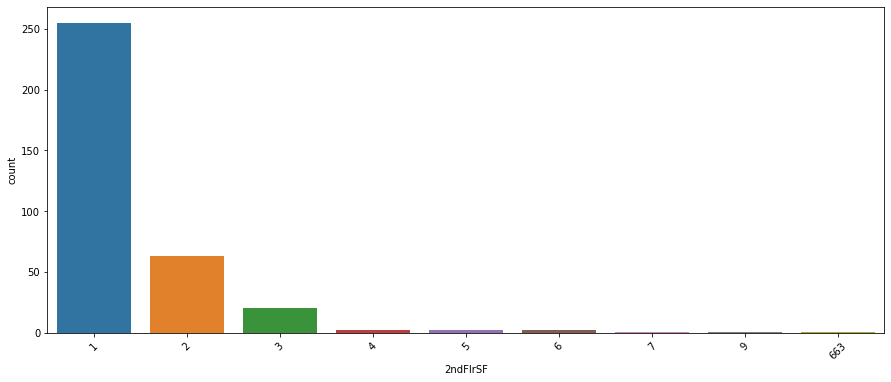

<Figure size 432x288 with 0 Axes>

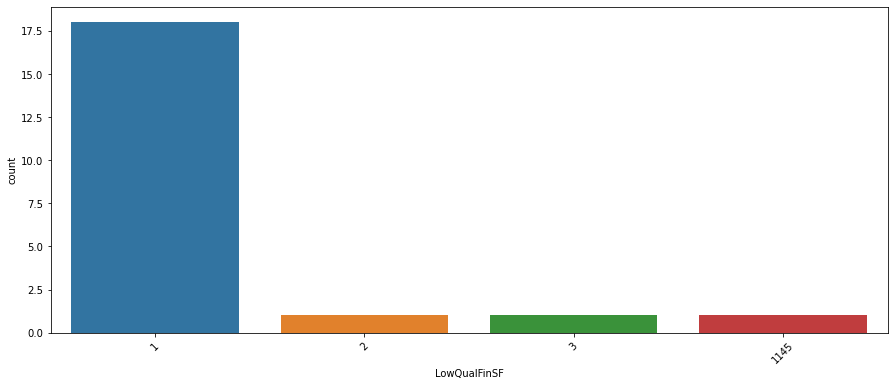

<Figure size 432x288 with 0 Axes>

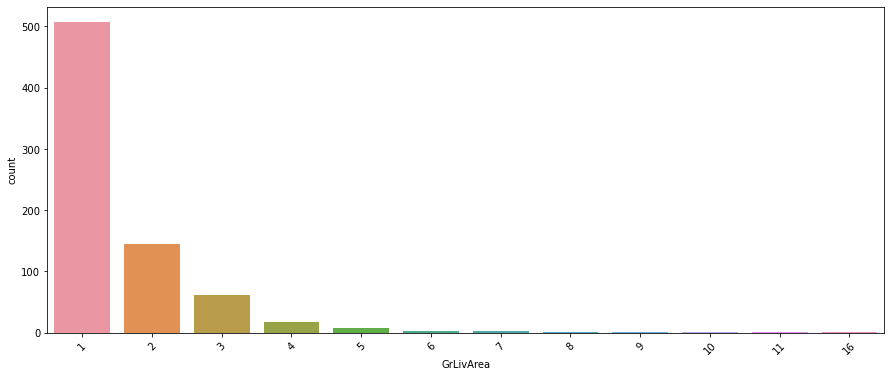

<Figure size 432x288 with 0 Axes>

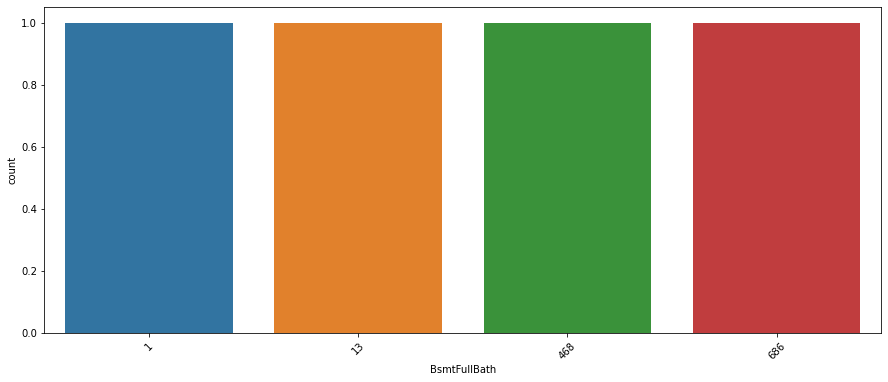

<Figure size 432x288 with 0 Axes>

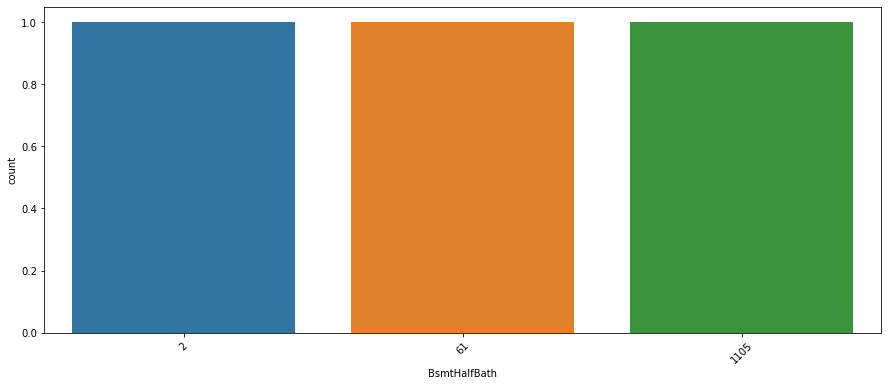

<Figure size 432x288 with 0 Axes>

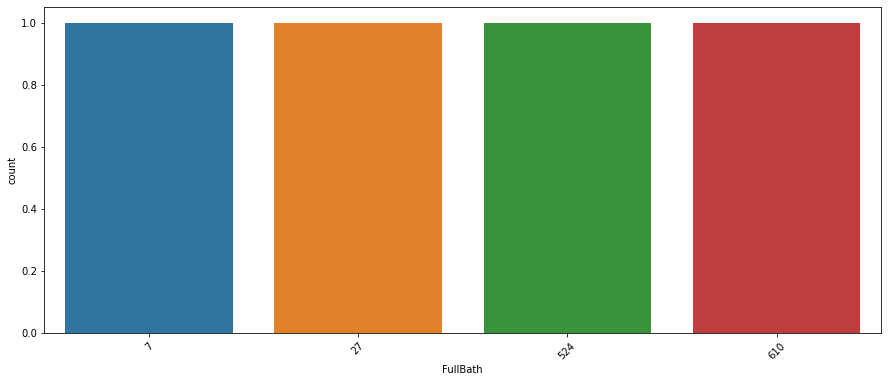

<Figure size 432x288 with 0 Axes>

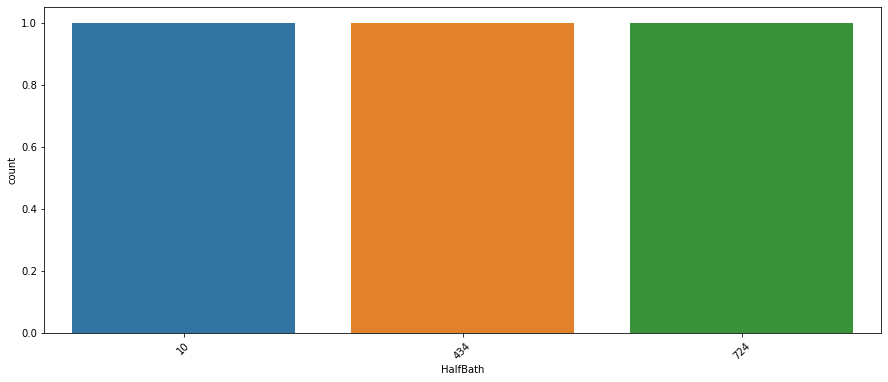

<Figure size 432x288 with 0 Axes>

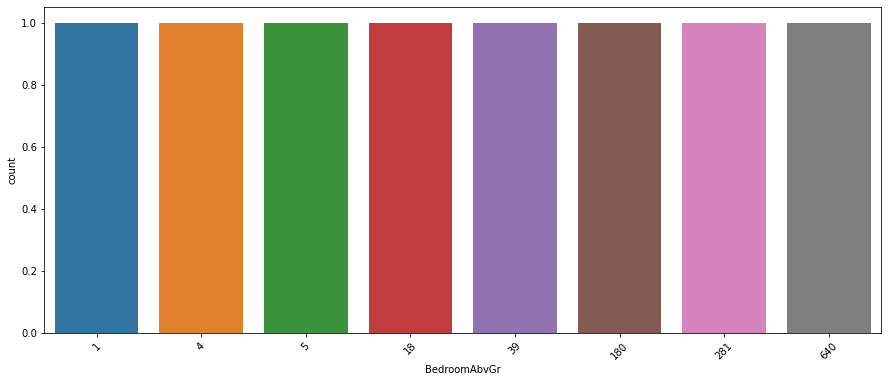

<Figure size 432x288 with 0 Axes>

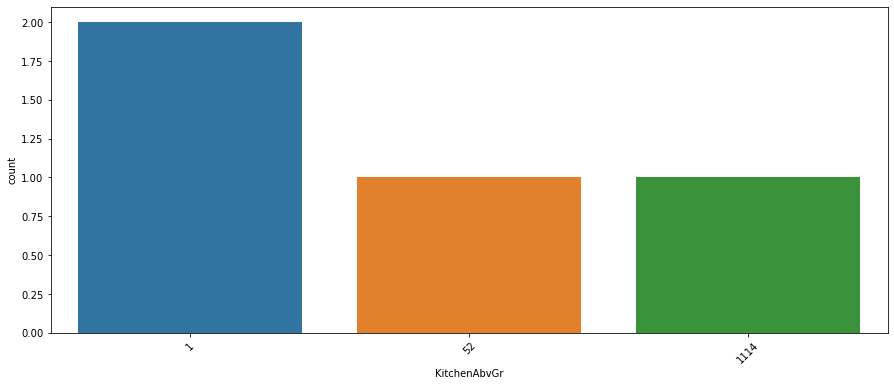

<Figure size 432x288 with 0 Axes>

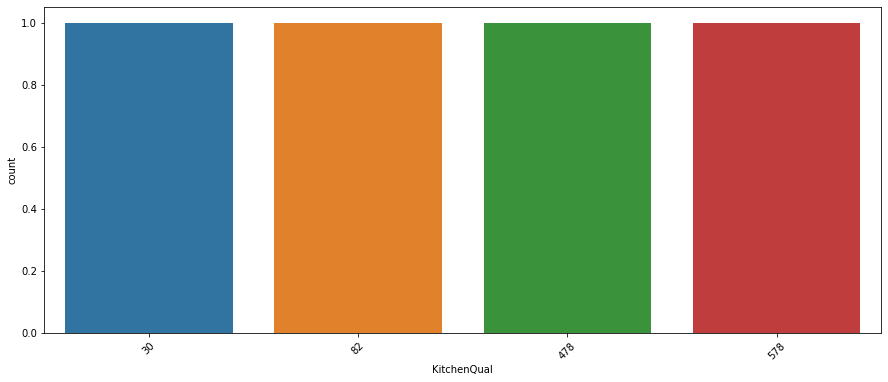

<Figure size 432x288 with 0 Axes>

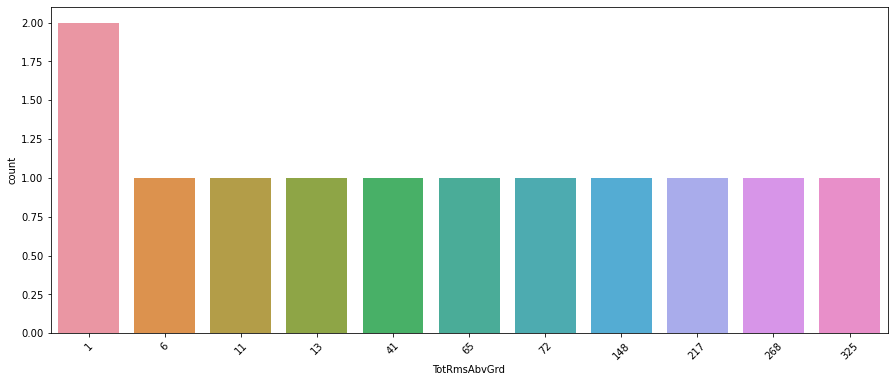

<Figure size 432x288 with 0 Axes>

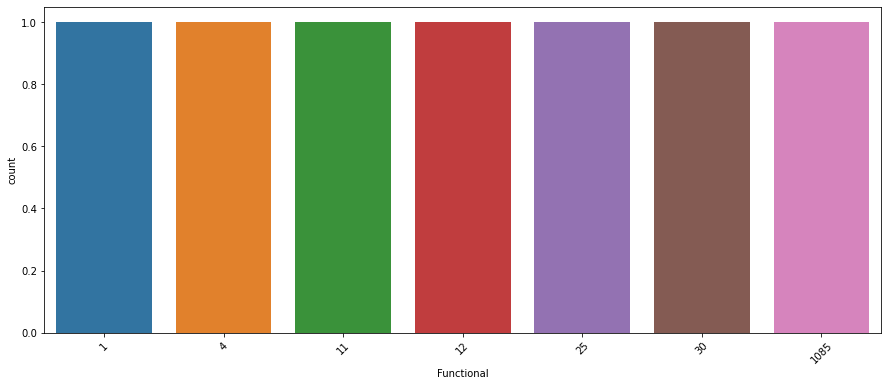

<Figure size 432x288 with 0 Axes>

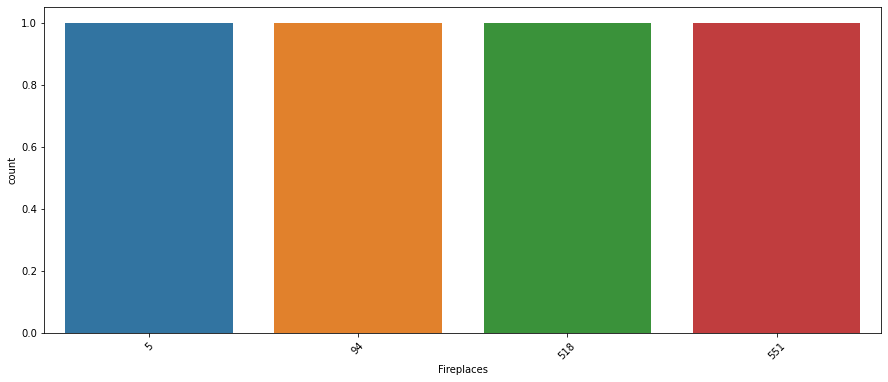

<Figure size 432x288 with 0 Axes>

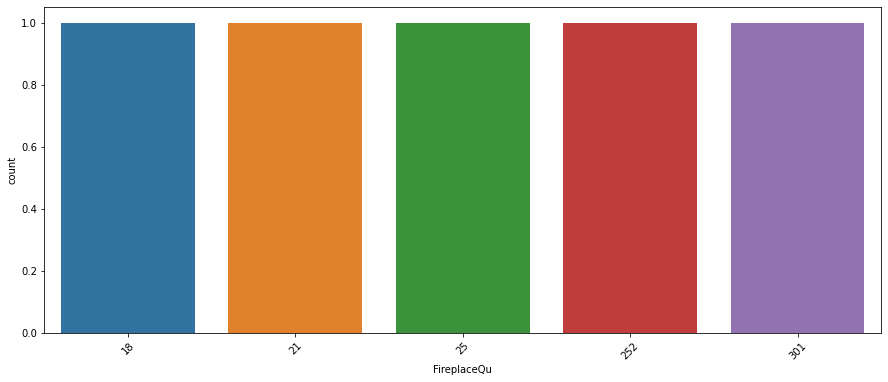

<Figure size 432x288 with 0 Axes>

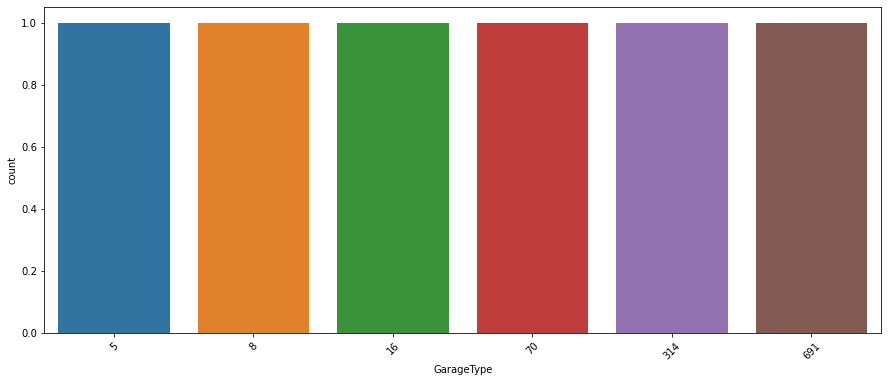

<Figure size 432x288 with 0 Axes>

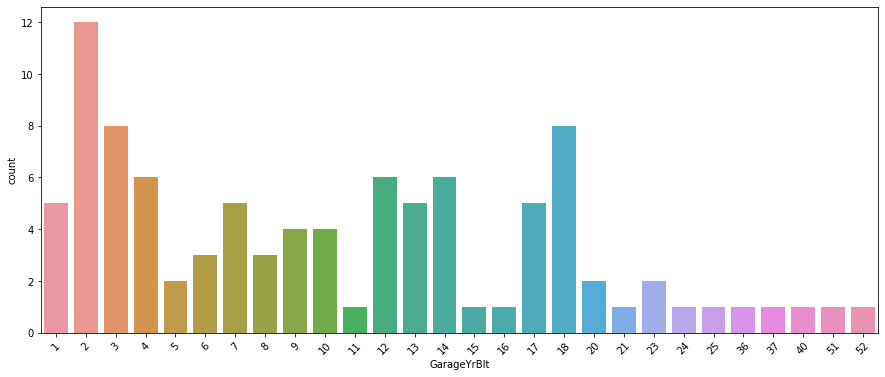

<Figure size 432x288 with 0 Axes>

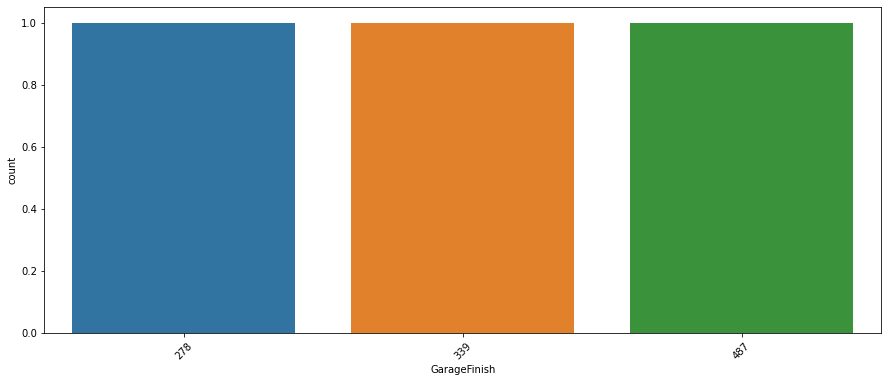

<Figure size 432x288 with 0 Axes>

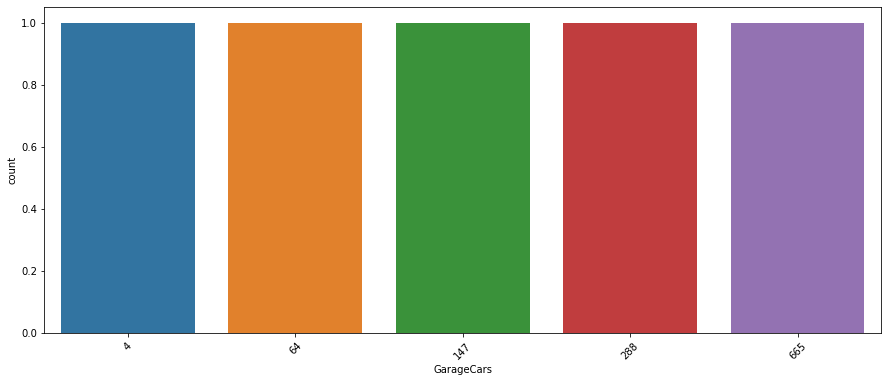

<Figure size 432x288 with 0 Axes>

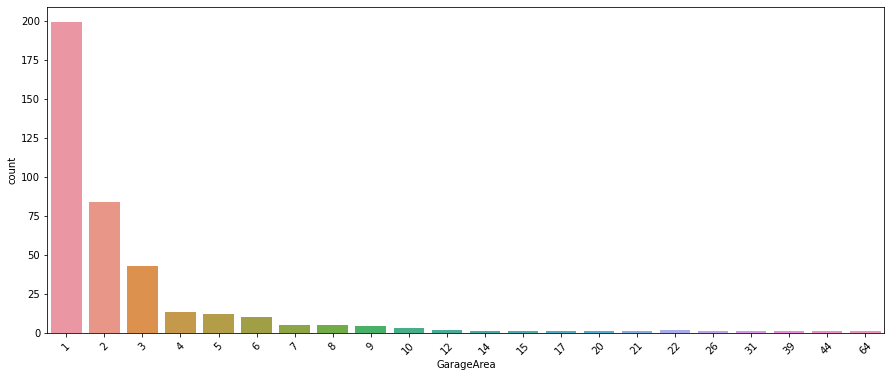

<Figure size 432x288 with 0 Axes>

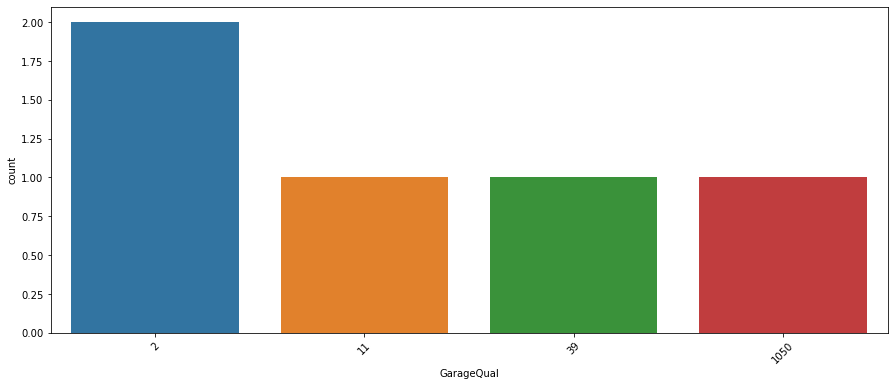

<Figure size 432x288 with 0 Axes>

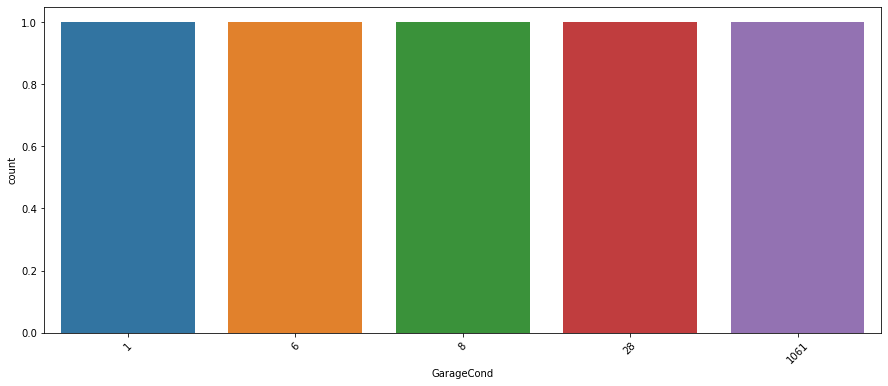

<Figure size 432x288 with 0 Axes>

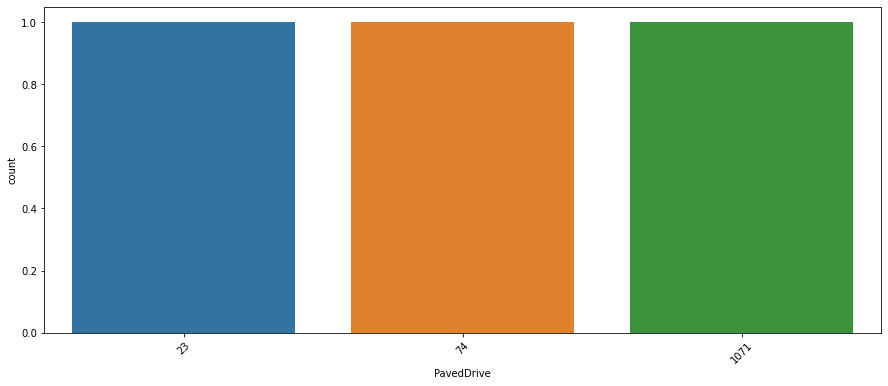

<Figure size 432x288 with 0 Axes>

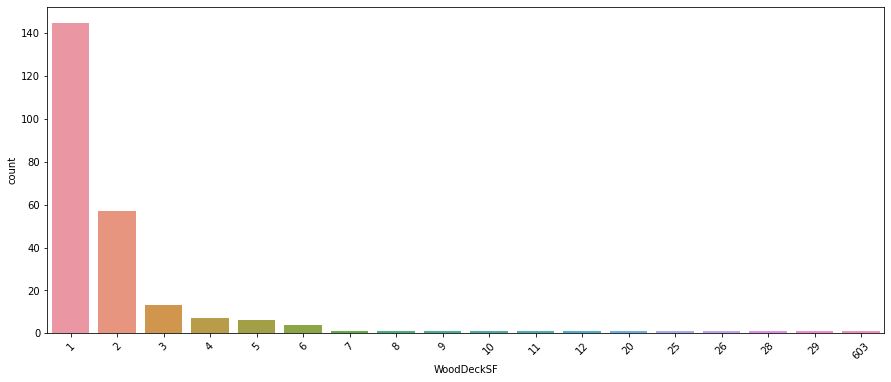

<Figure size 432x288 with 0 Axes>

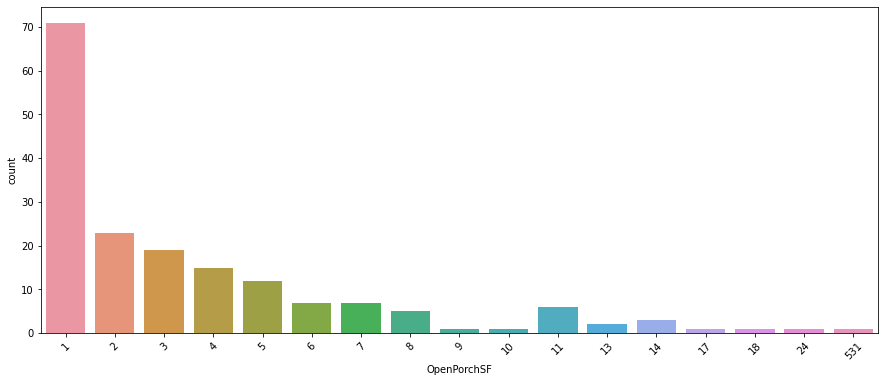

<Figure size 432x288 with 0 Axes>

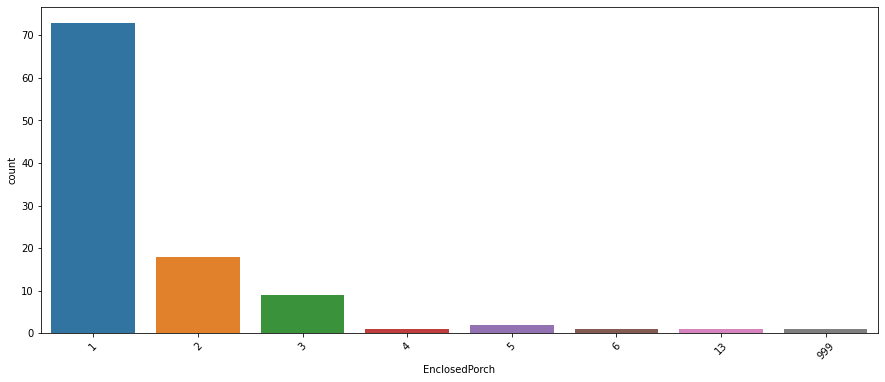

<Figure size 432x288 with 0 Axes>

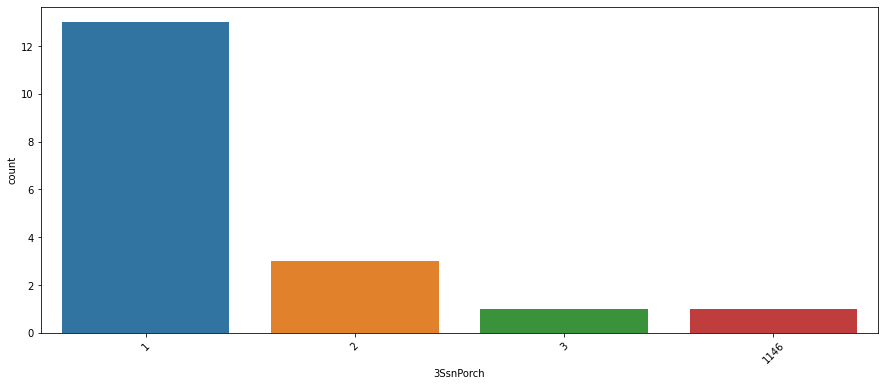

<Figure size 432x288 with 0 Axes>

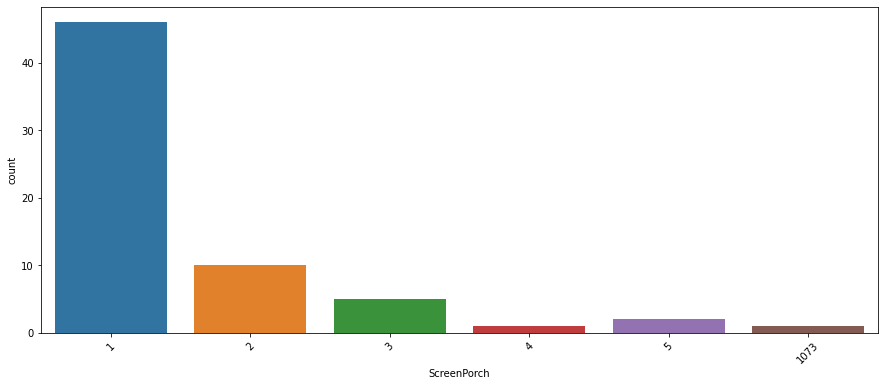

<Figure size 432x288 with 0 Axes>

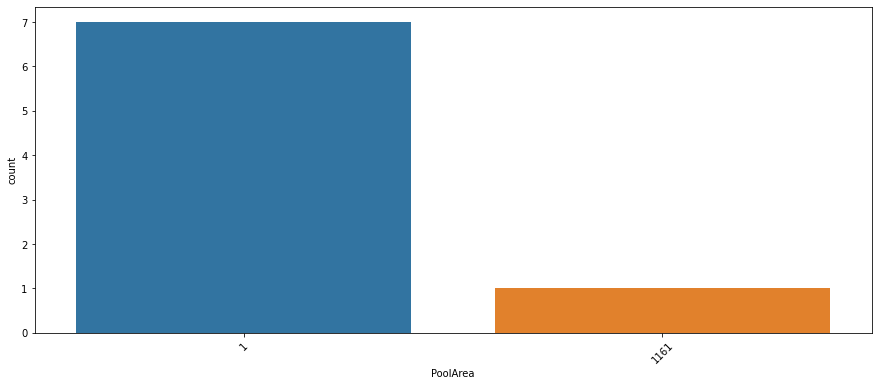

<Figure size 432x288 with 0 Axes>

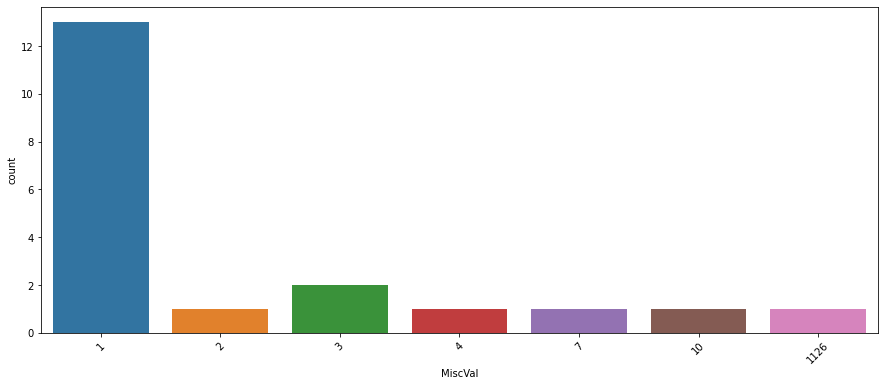

<Figure size 432x288 with 0 Axes>

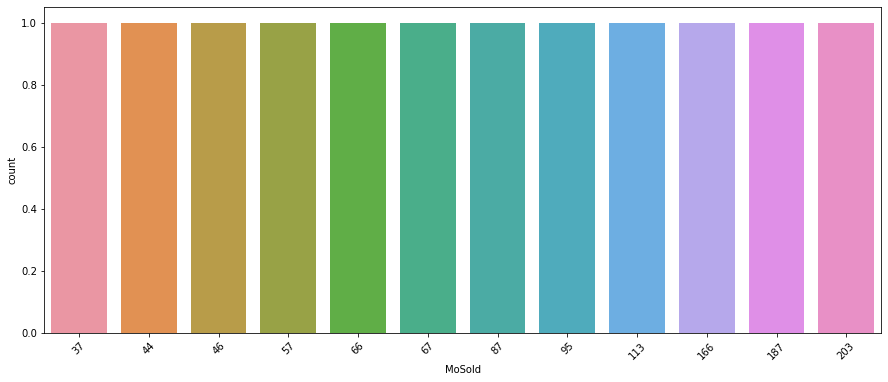

<Figure size 432x288 with 0 Axes>

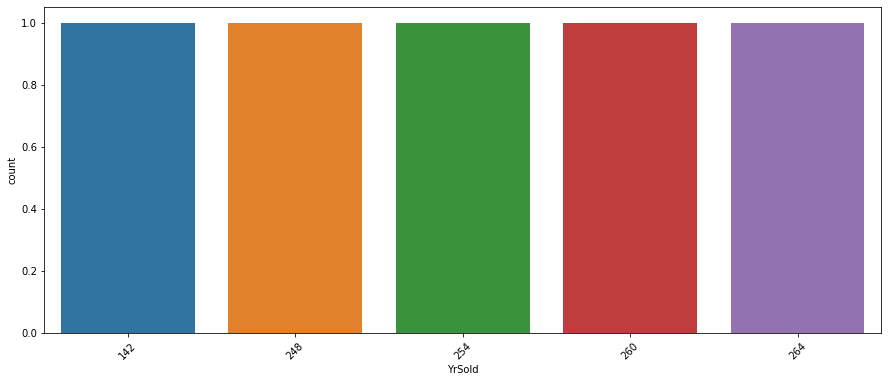

<Figure size 432x288 with 0 Axes>

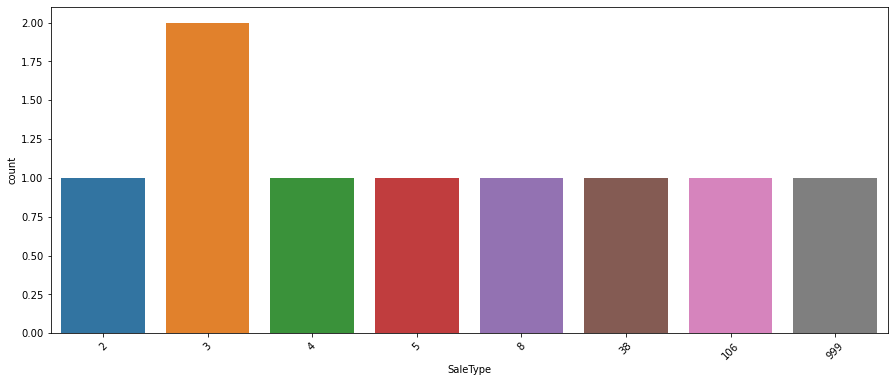

<Figure size 432x288 with 0 Axes>

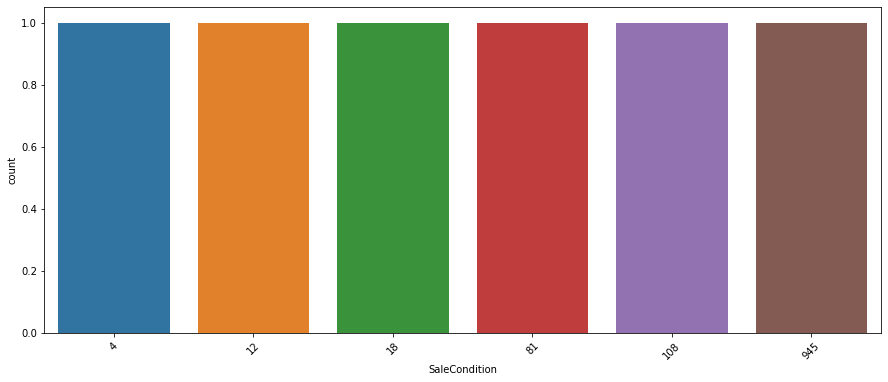

<Figure size 432x288 with 0 Axes>

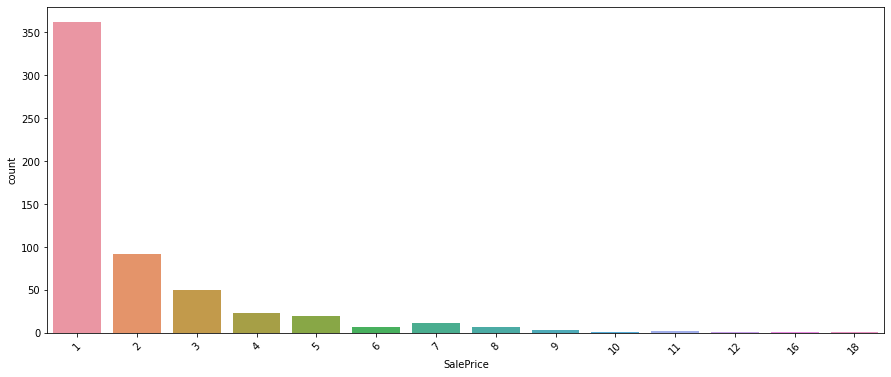

<Figure size 432x288 with 0 Axes>

In [39]:
for i in df.columns:
        plt.figure(figsize=(15,6))
        sns.countplot(df[i].value_counts())
        plt.xticks(rotation=45)
        plt.figure()

I have'nt found any unnecessary or duplicate entries in any column in train dataset.

But I encountered columns with more than 85% zero values in them which are as follows:

1.BsmtFinSF2
2.LowQualFinSF
3.BsmtHalfBath
4.EnclosedPorch
5.3SsnPorch
6.ScreenPorch
7.PoolArea
8.MiscVal

So I have to drop these columns. In some other columns also there are zero values below 60% they are acceptable and also reasonable.

In [40]:
#Dropping unnecessary columns in train dataset
df.drop(columns = ['BsmtFinSF2','LowQualFinSF','BsmtHalfBath','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'],inplace = True)

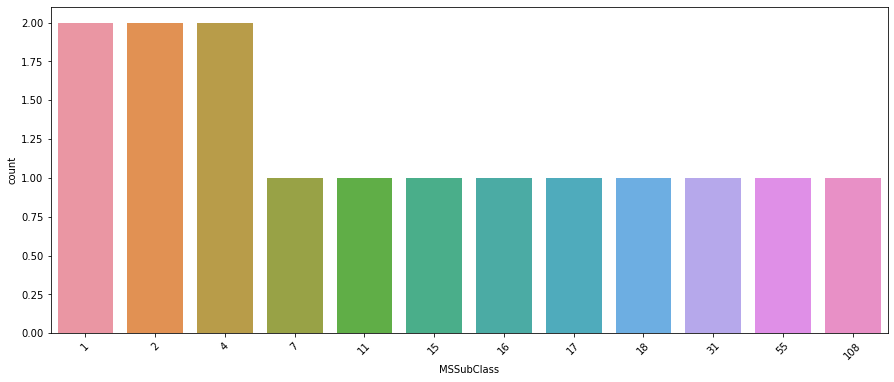

<Figure size 432x288 with 0 Axes>

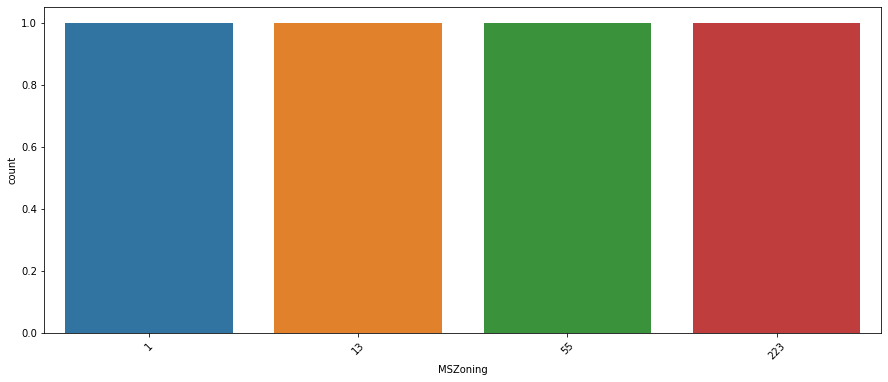

<Figure size 432x288 with 0 Axes>

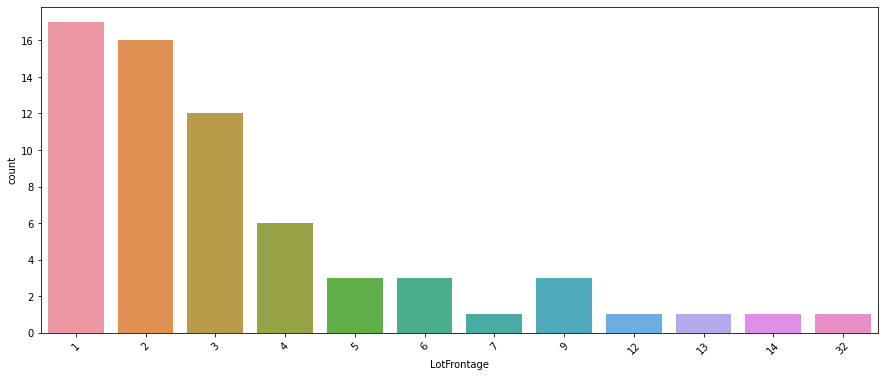

<Figure size 432x288 with 0 Axes>

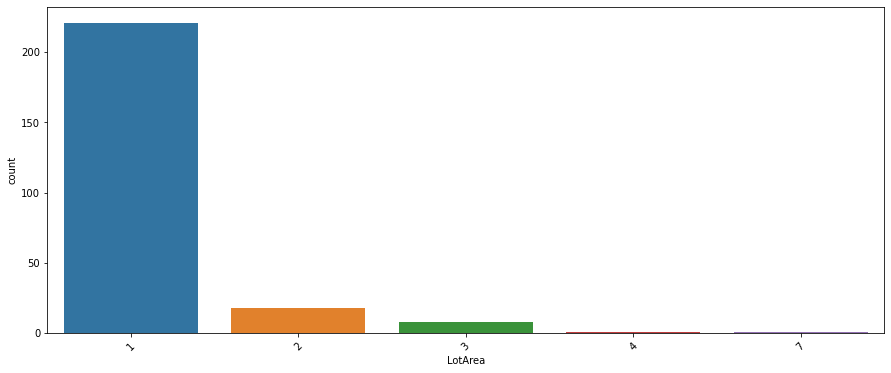

<Figure size 432x288 with 0 Axes>

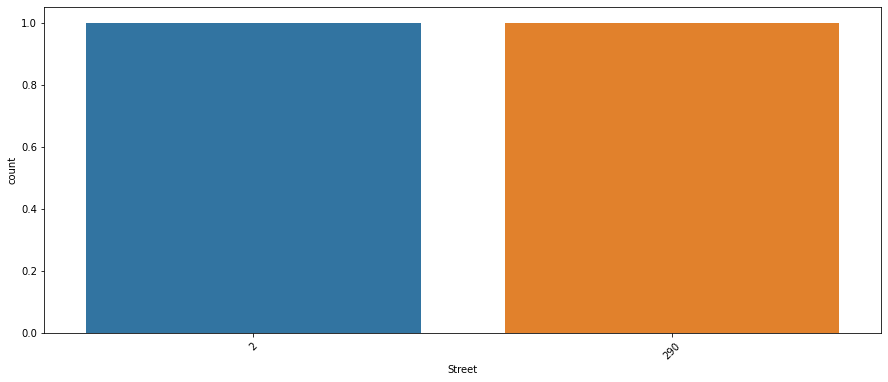

<Figure size 432x288 with 0 Axes>

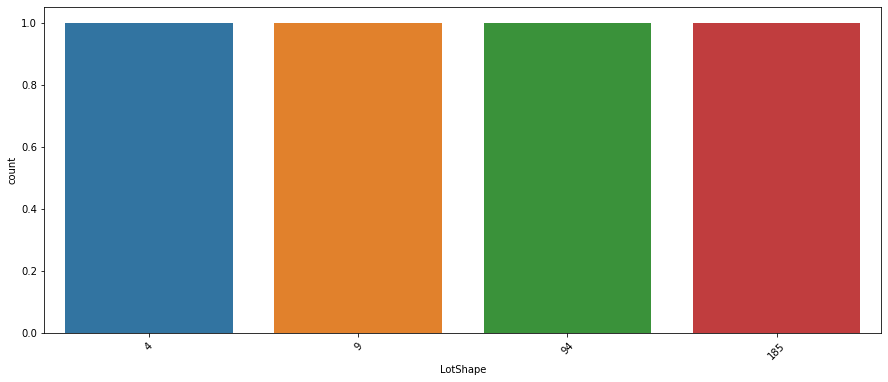

<Figure size 432x288 with 0 Axes>

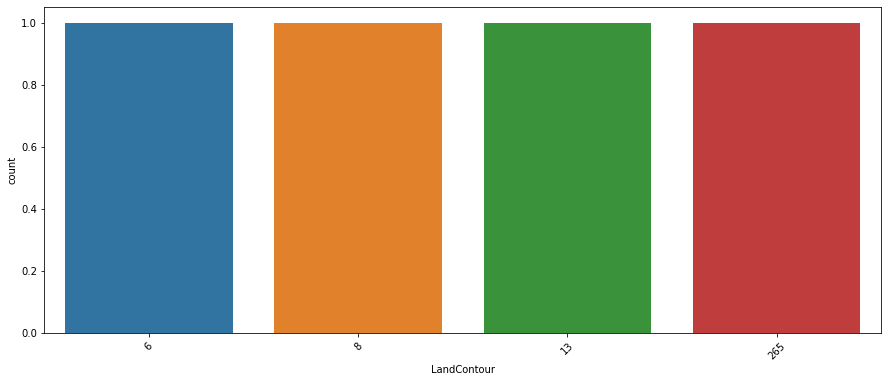

<Figure size 432x288 with 0 Axes>

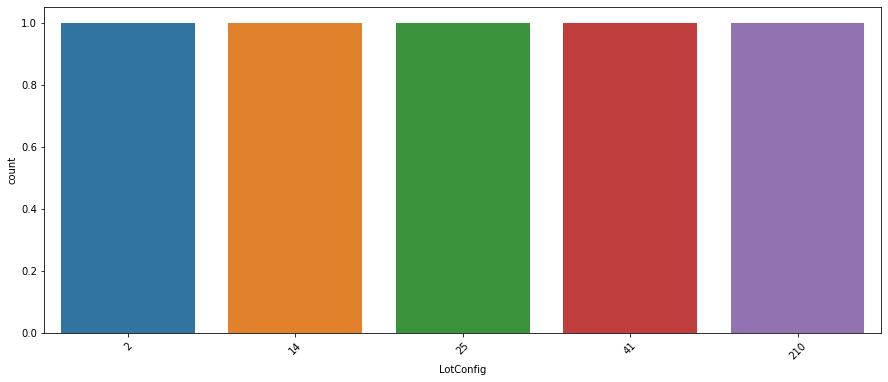

<Figure size 432x288 with 0 Axes>

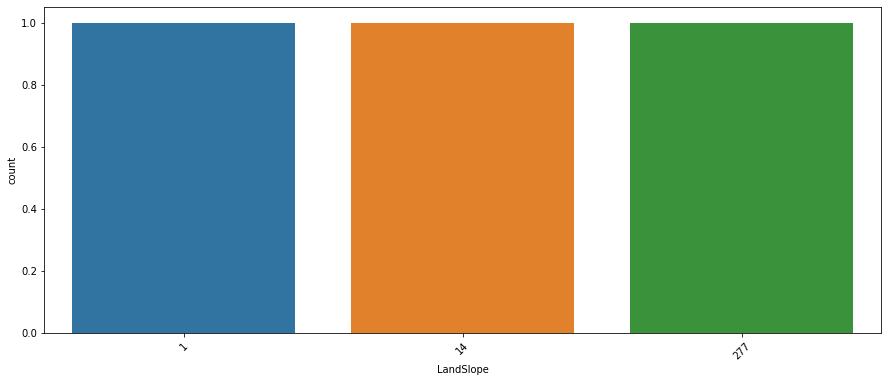

<Figure size 432x288 with 0 Axes>

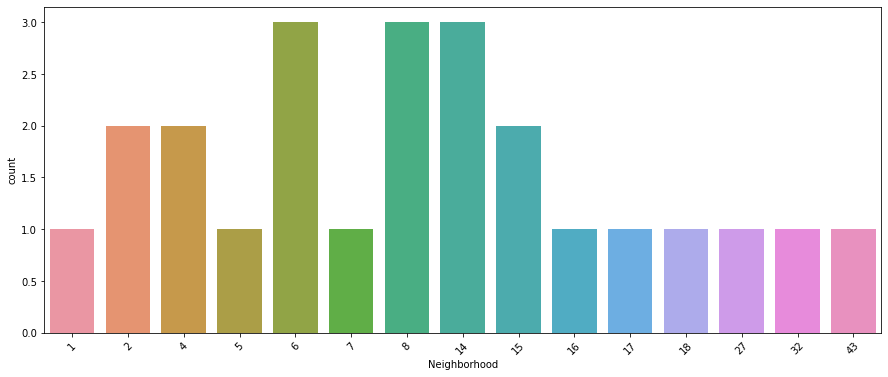

<Figure size 432x288 with 0 Axes>

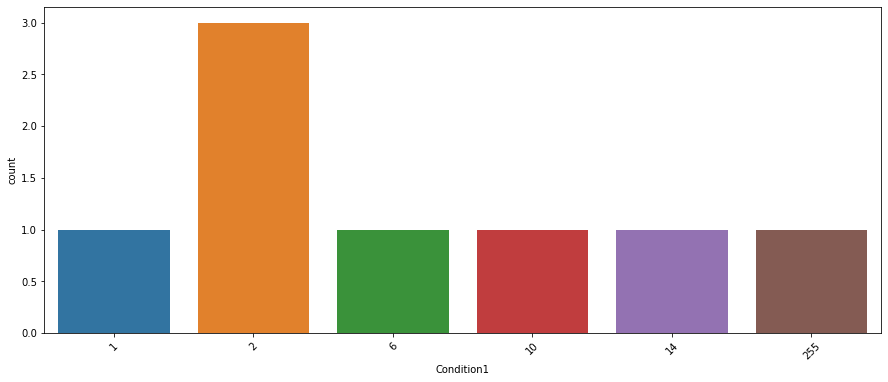

<Figure size 432x288 with 0 Axes>

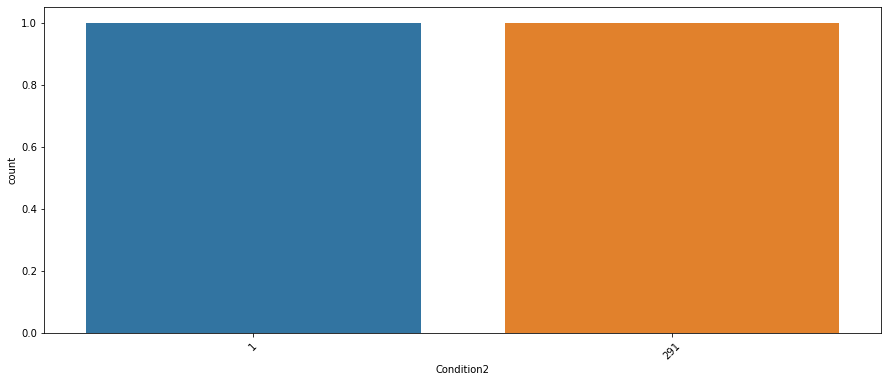

<Figure size 432x288 with 0 Axes>

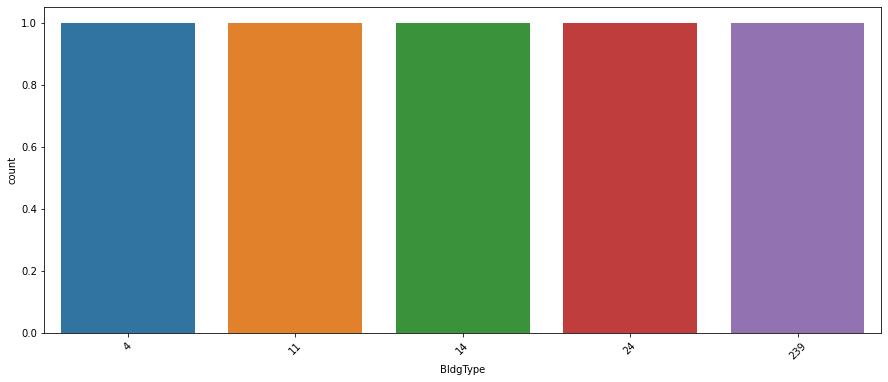

<Figure size 432x288 with 0 Axes>

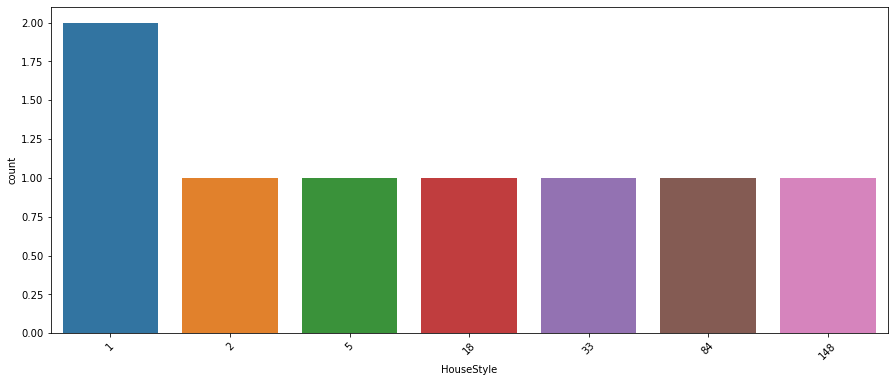

<Figure size 432x288 with 0 Axes>

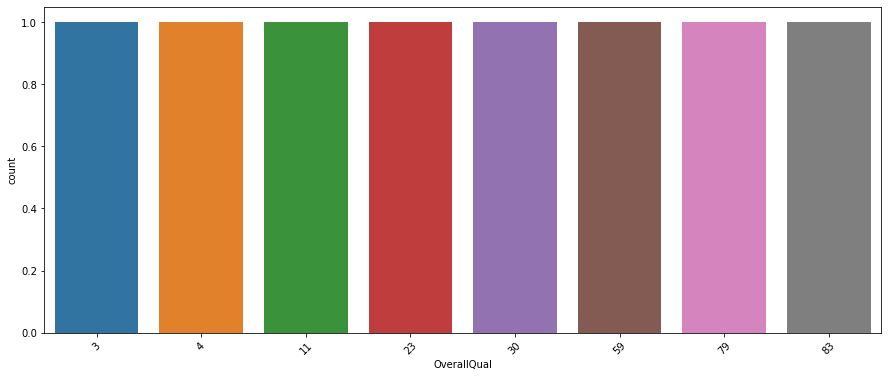

<Figure size 432x288 with 0 Axes>

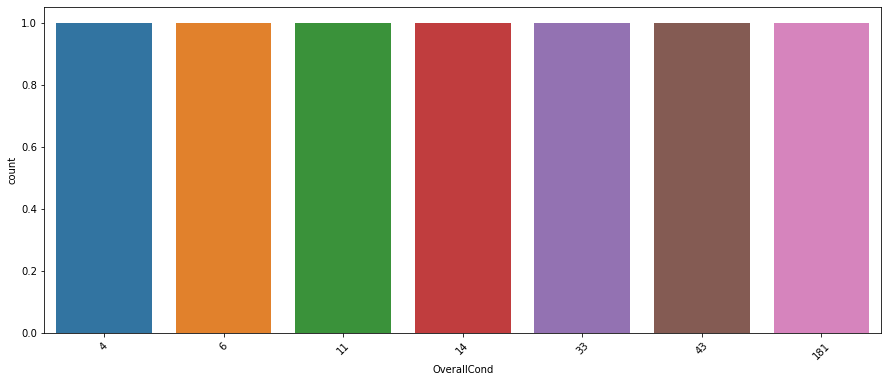

<Figure size 432x288 with 0 Axes>

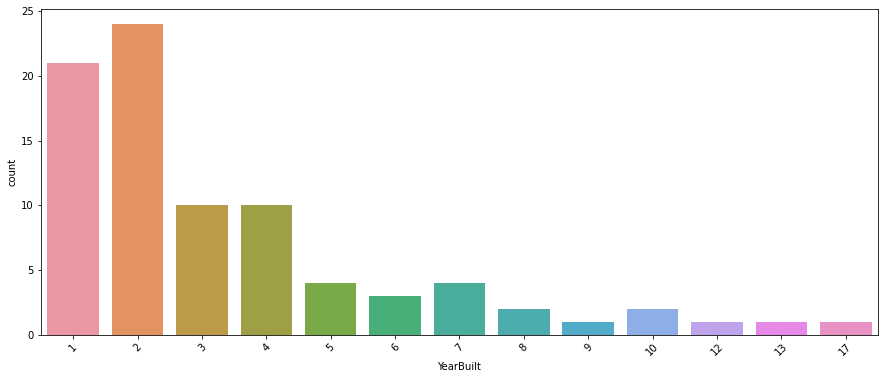

<Figure size 432x288 with 0 Axes>

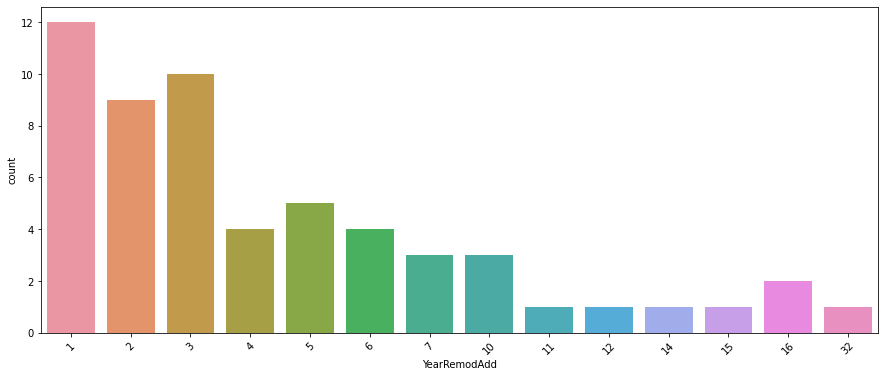

<Figure size 432x288 with 0 Axes>

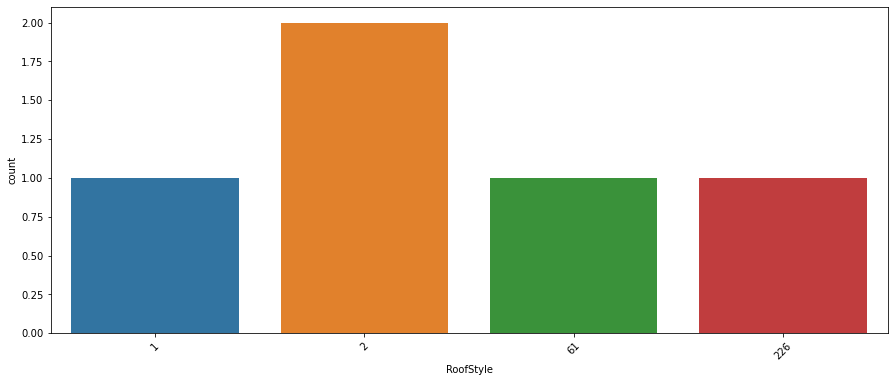

<Figure size 432x288 with 0 Axes>

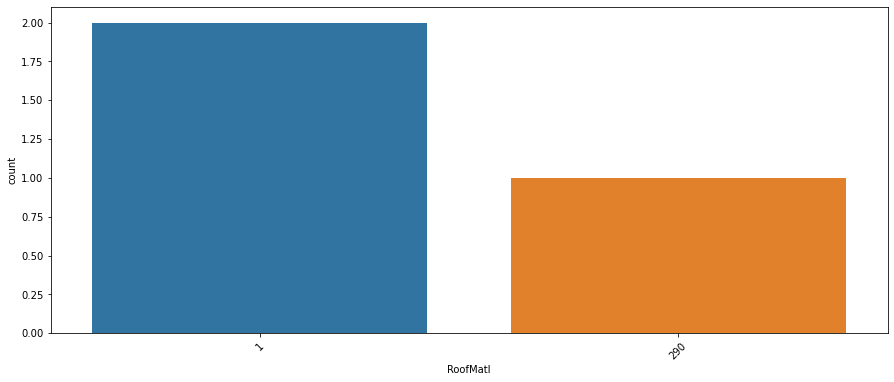

<Figure size 432x288 with 0 Axes>

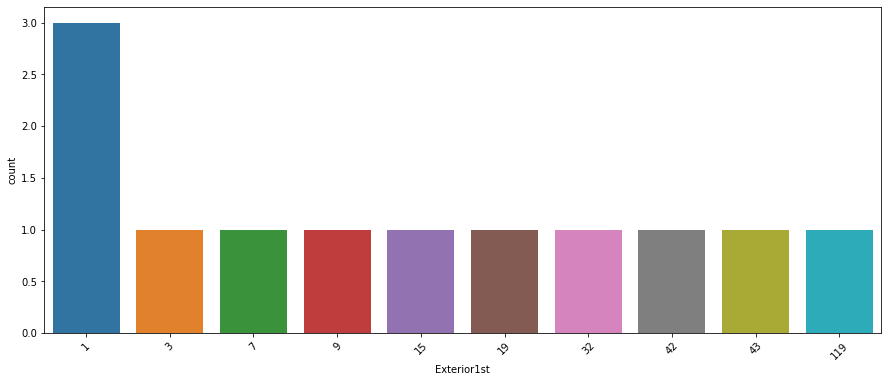

<Figure size 432x288 with 0 Axes>

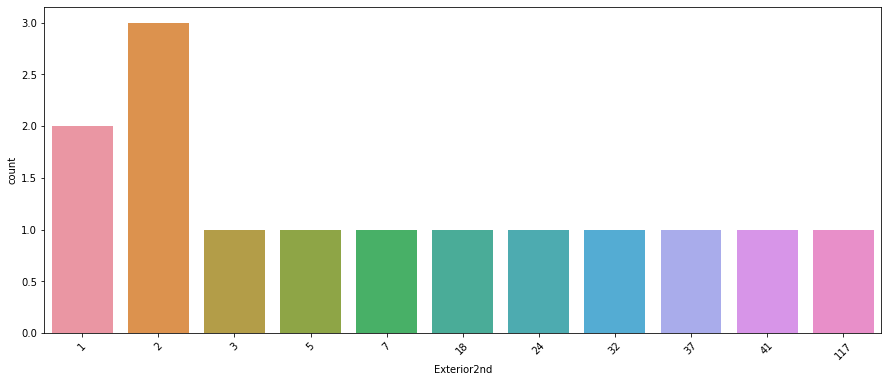

<Figure size 432x288 with 0 Axes>

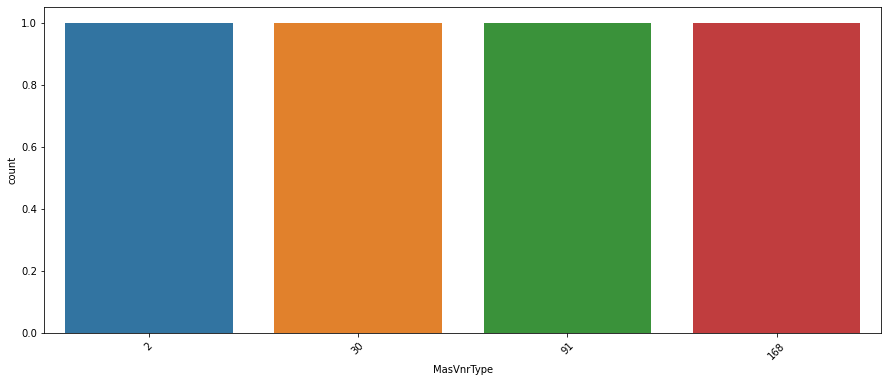

<Figure size 432x288 with 0 Axes>

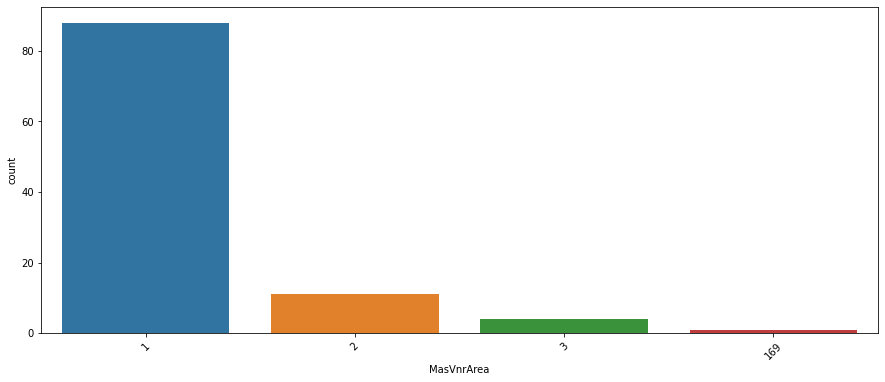

<Figure size 432x288 with 0 Axes>

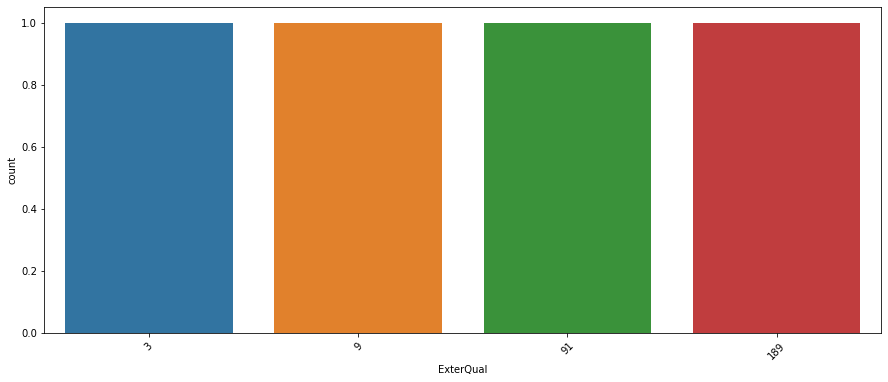

<Figure size 432x288 with 0 Axes>

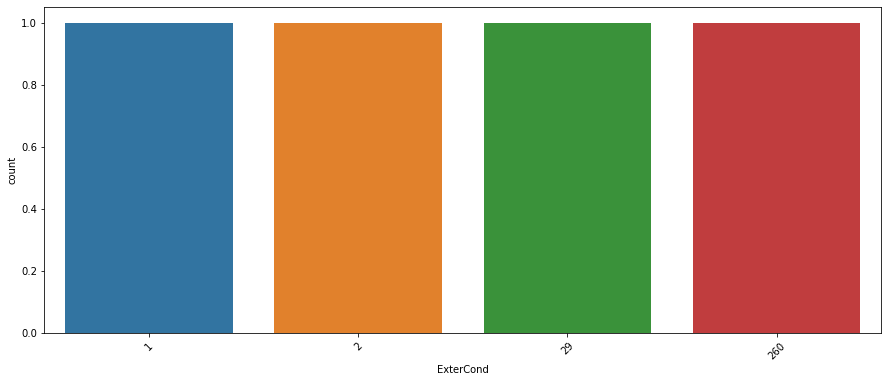

<Figure size 432x288 with 0 Axes>

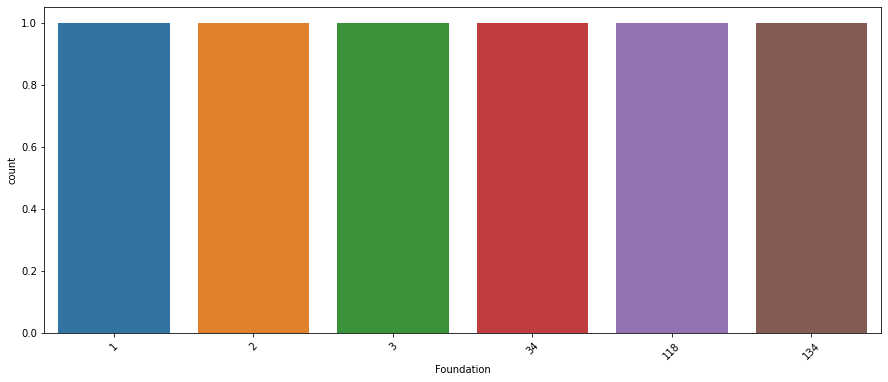

<Figure size 432x288 with 0 Axes>

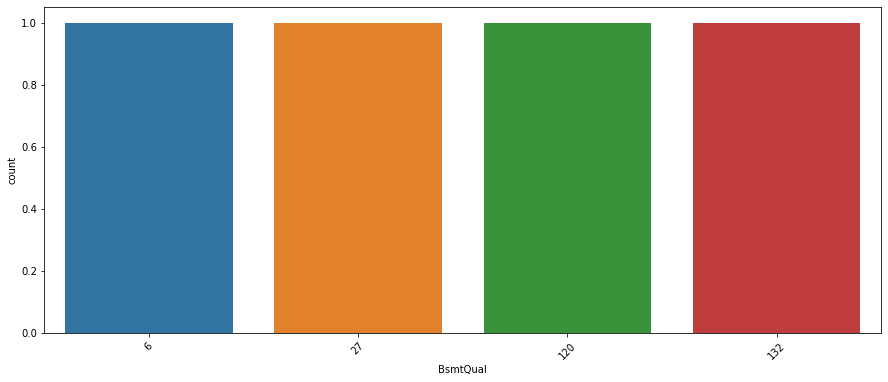

<Figure size 432x288 with 0 Axes>

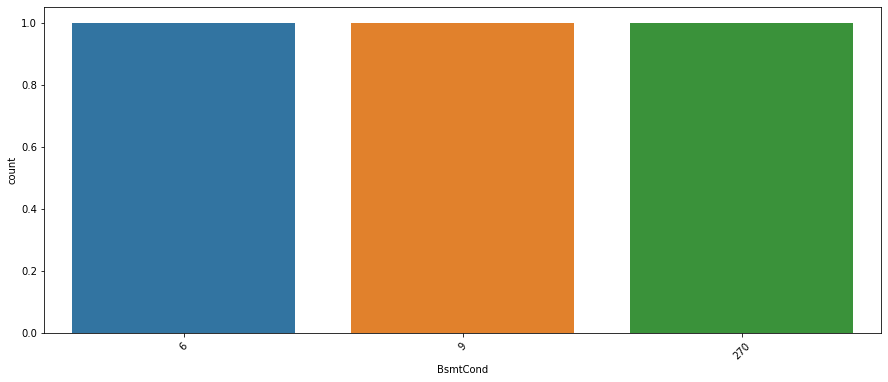

<Figure size 432x288 with 0 Axes>

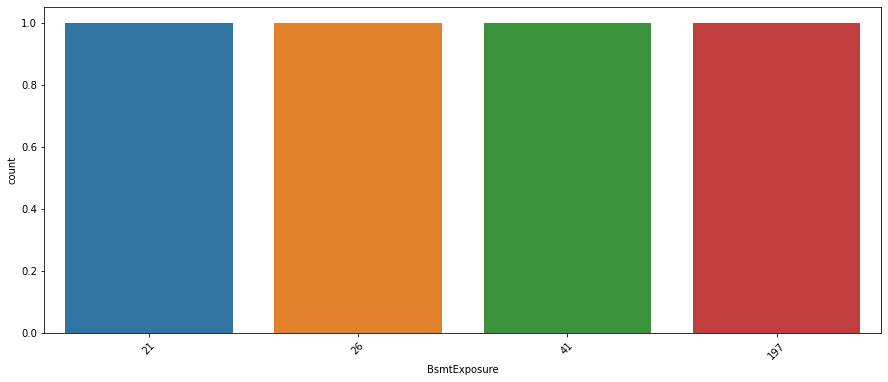

<Figure size 432x288 with 0 Axes>

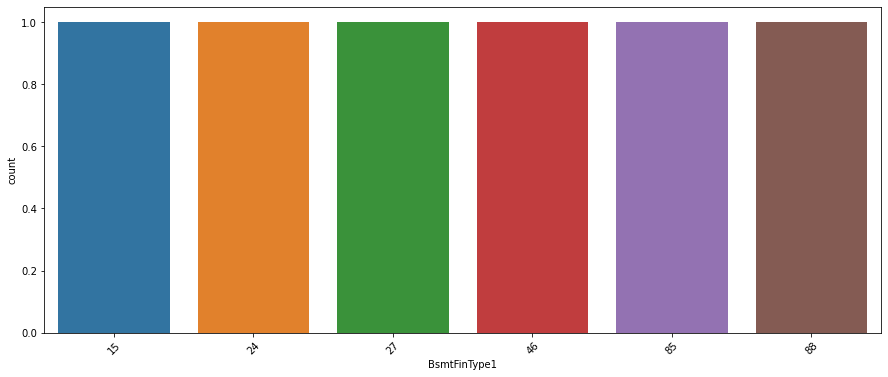

<Figure size 432x288 with 0 Axes>

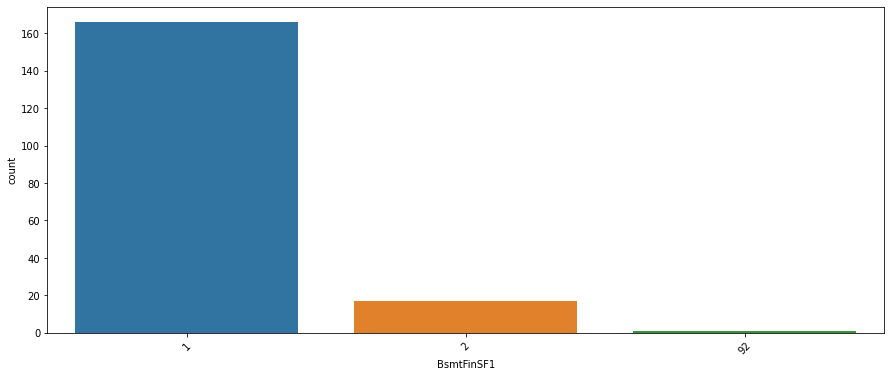

<Figure size 432x288 with 0 Axes>

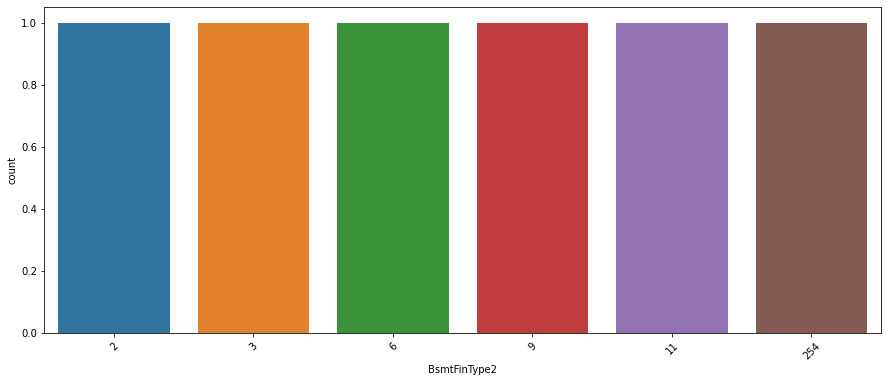

<Figure size 432x288 with 0 Axes>

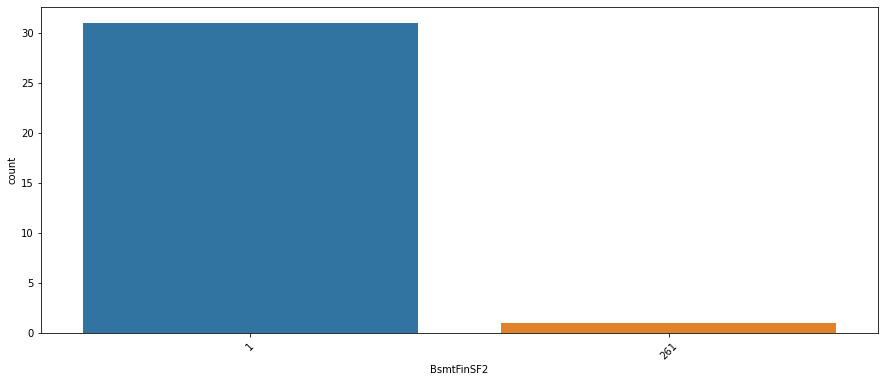

<Figure size 432x288 with 0 Axes>

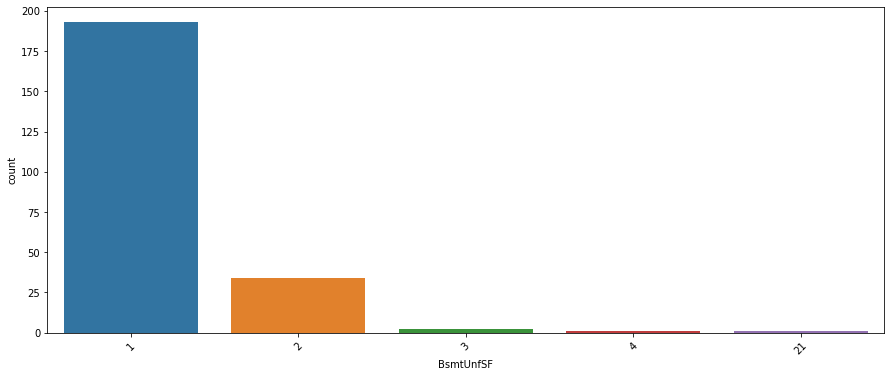

<Figure size 432x288 with 0 Axes>

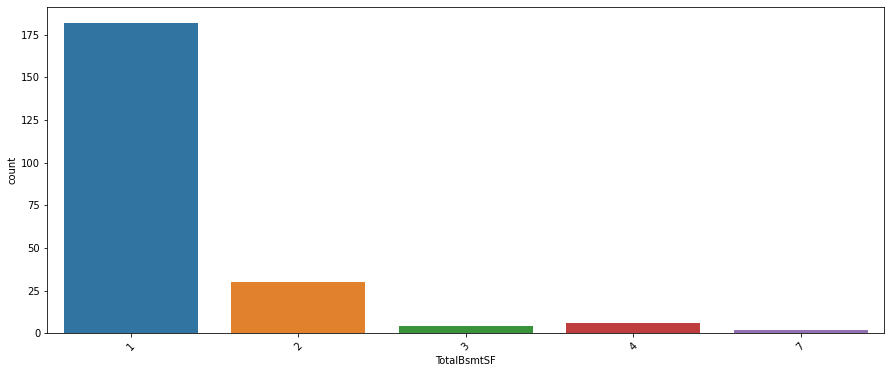

<Figure size 432x288 with 0 Axes>

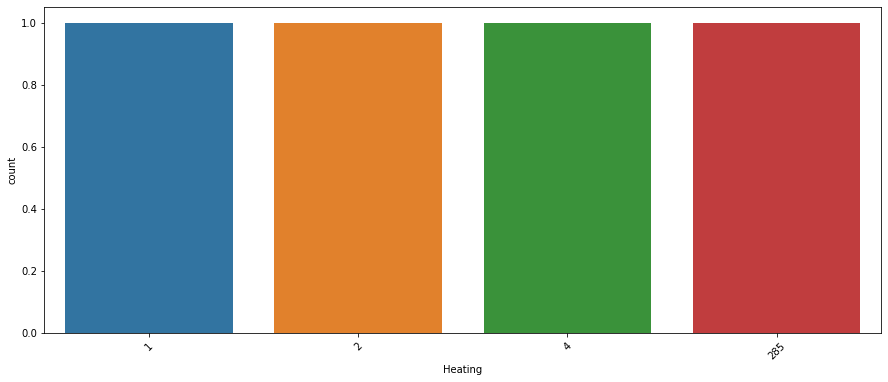

<Figure size 432x288 with 0 Axes>

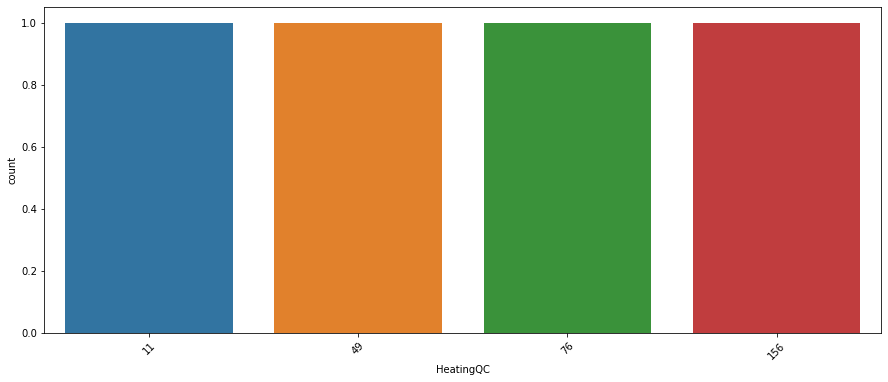

<Figure size 432x288 with 0 Axes>

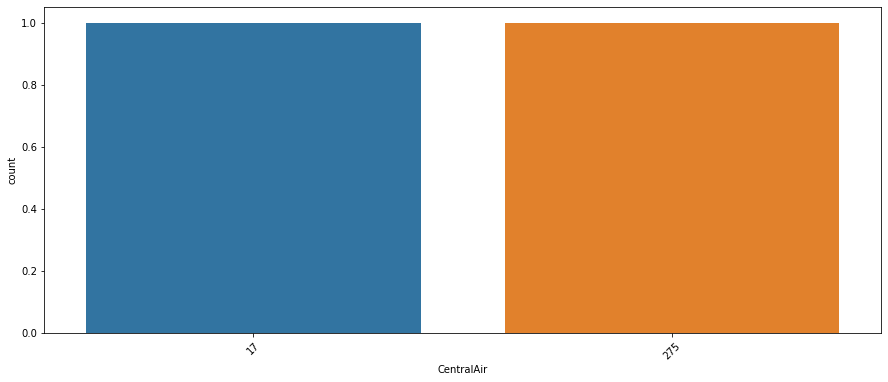

<Figure size 432x288 with 0 Axes>

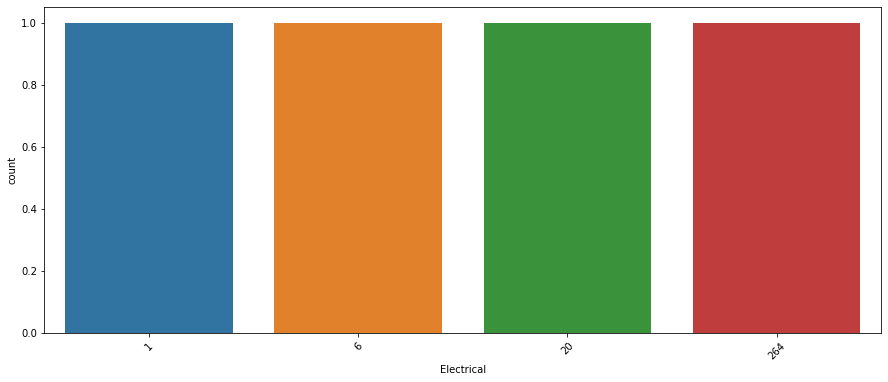

<Figure size 432x288 with 0 Axes>

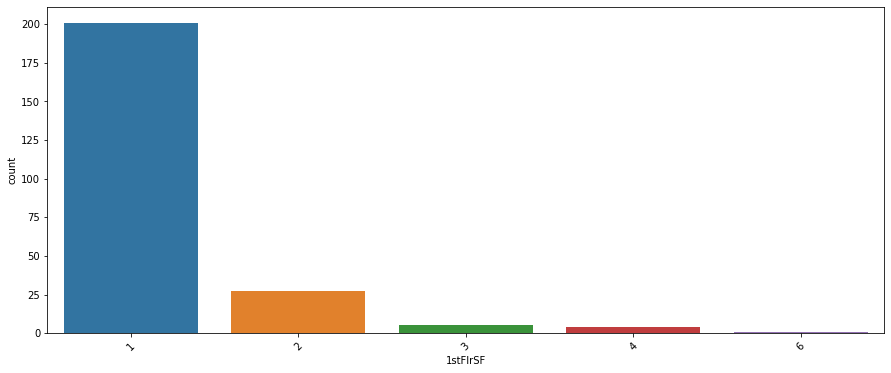

<Figure size 432x288 with 0 Axes>

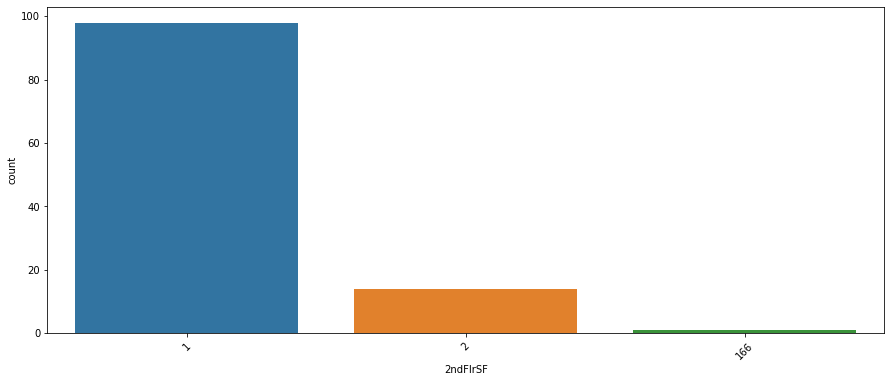

<Figure size 432x288 with 0 Axes>

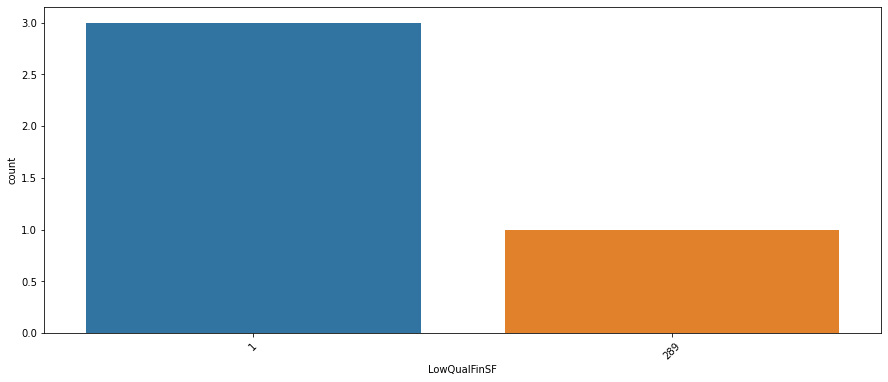

<Figure size 432x288 with 0 Axes>

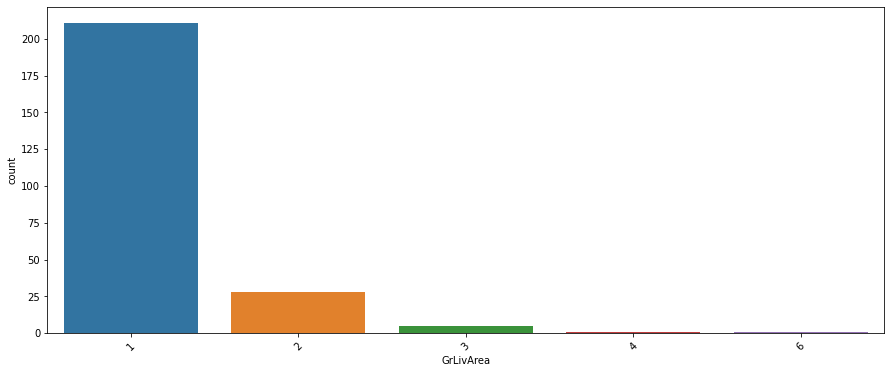

<Figure size 432x288 with 0 Axes>

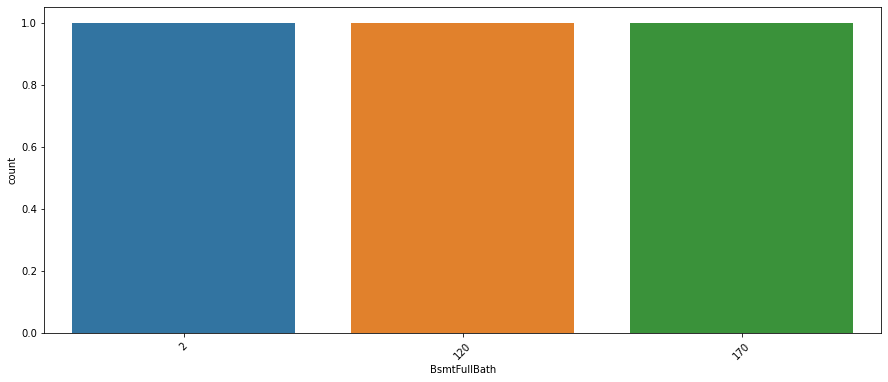

<Figure size 432x288 with 0 Axes>

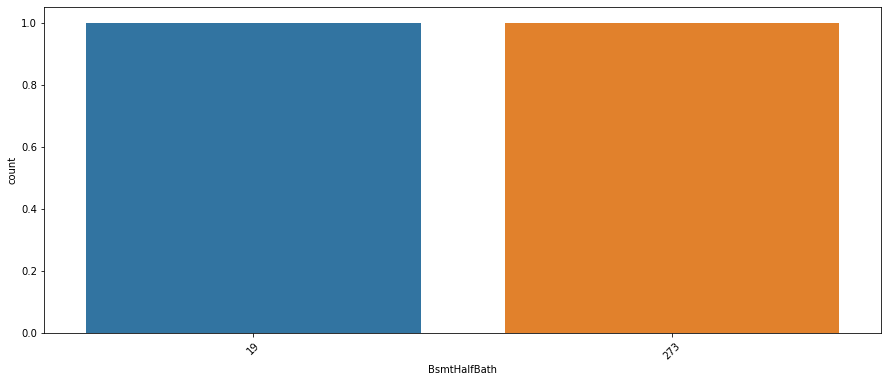

<Figure size 432x288 with 0 Axes>

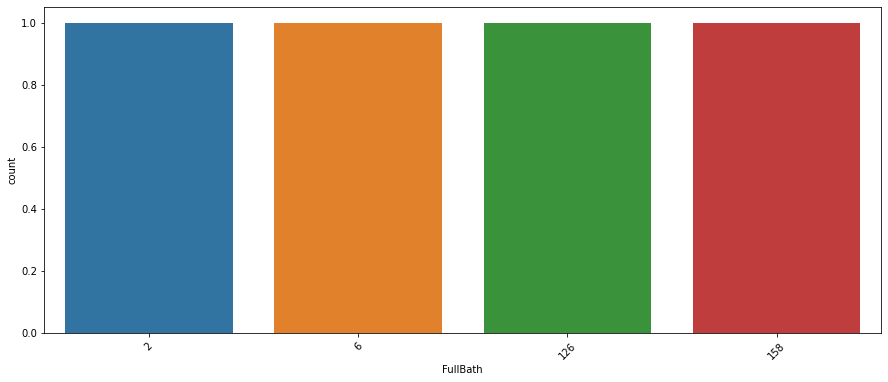

<Figure size 432x288 with 0 Axes>

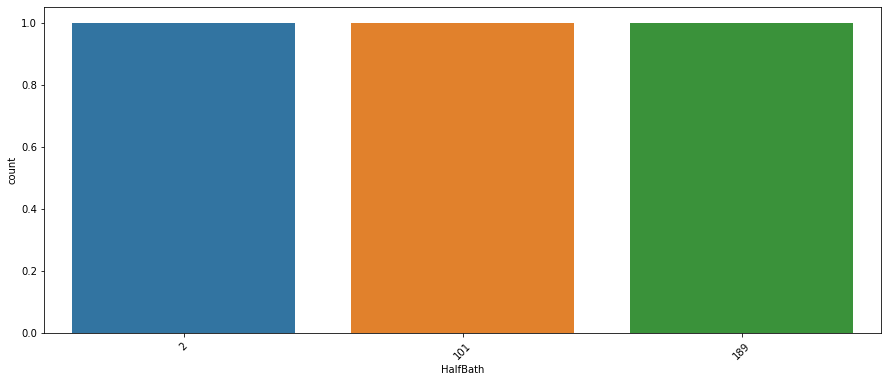

<Figure size 432x288 with 0 Axes>

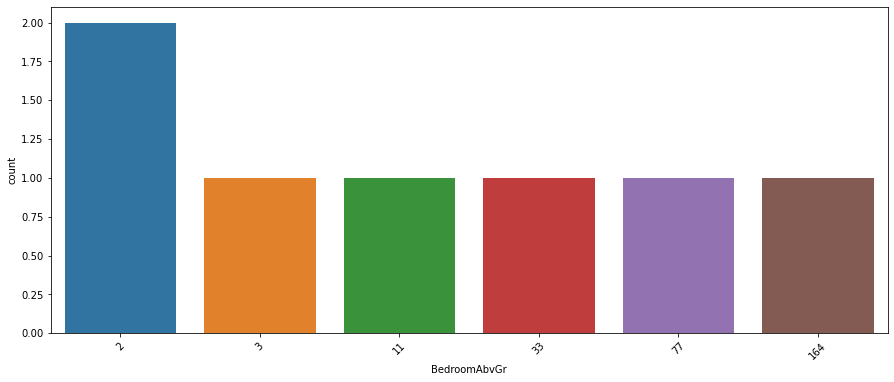

<Figure size 432x288 with 0 Axes>

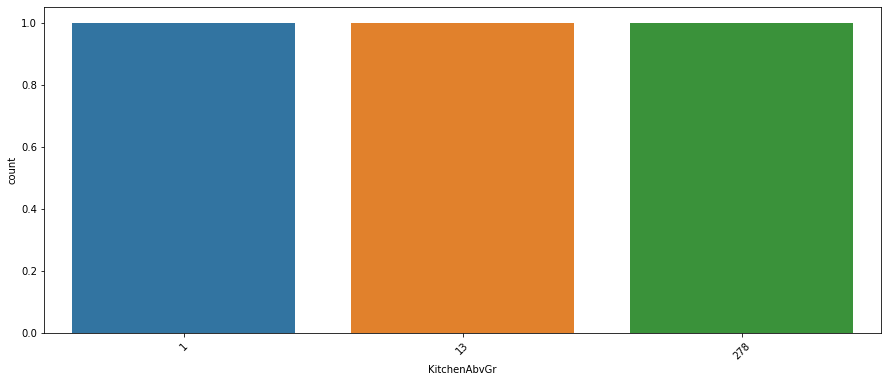

<Figure size 432x288 with 0 Axes>

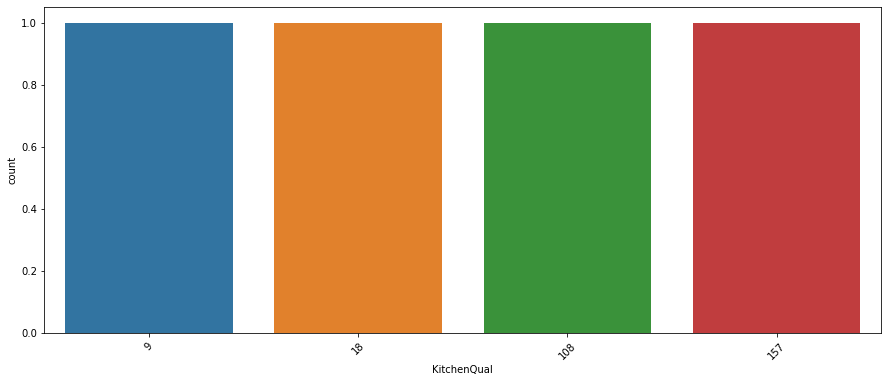

<Figure size 432x288 with 0 Axes>

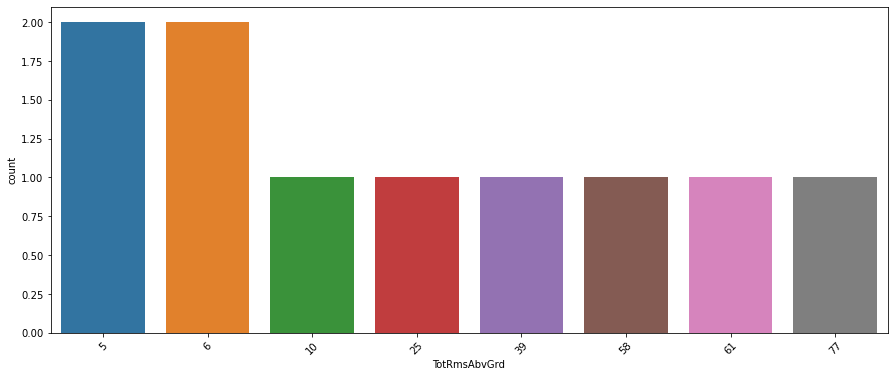

<Figure size 432x288 with 0 Axes>

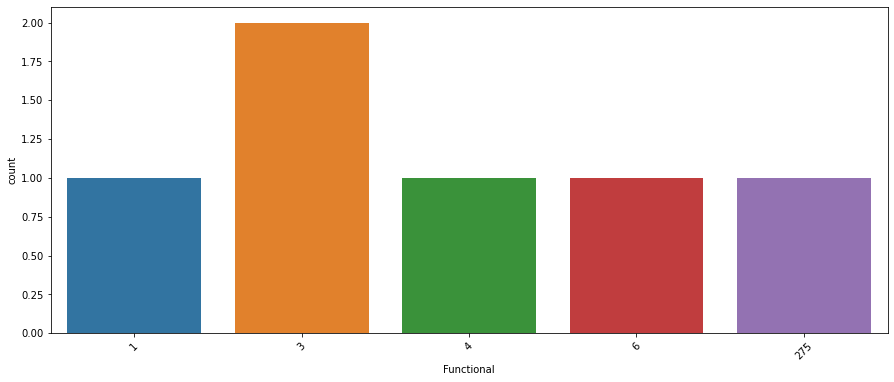

<Figure size 432x288 with 0 Axes>

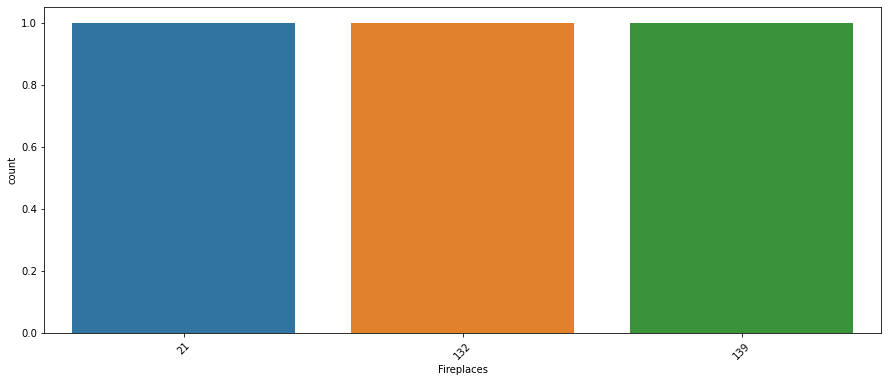

<Figure size 432x288 with 0 Axes>

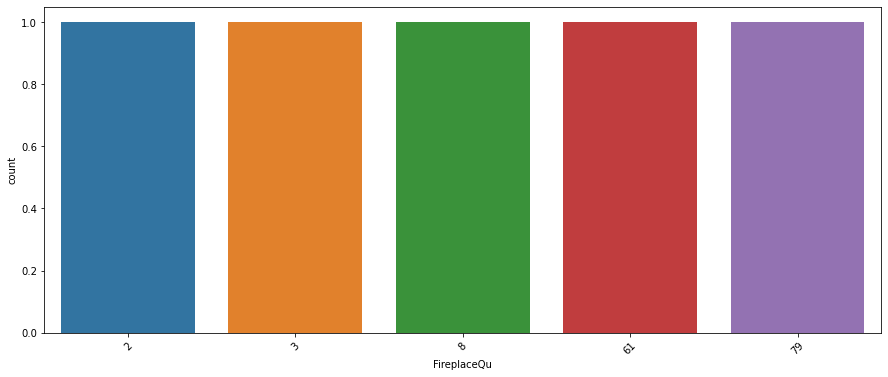

<Figure size 432x288 with 0 Axes>

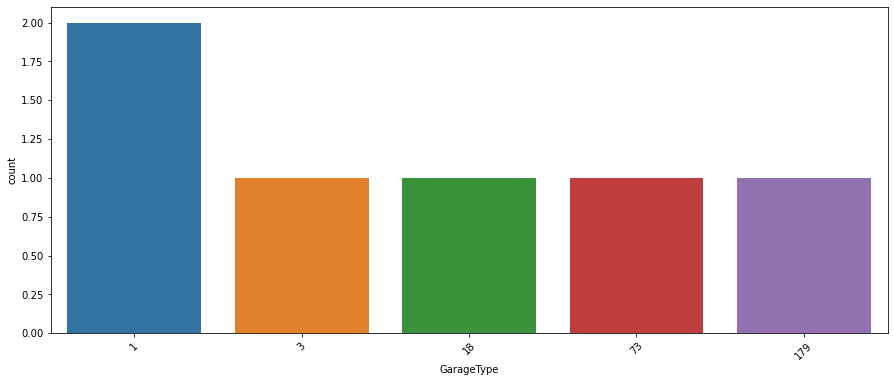

<Figure size 432x288 with 0 Axes>

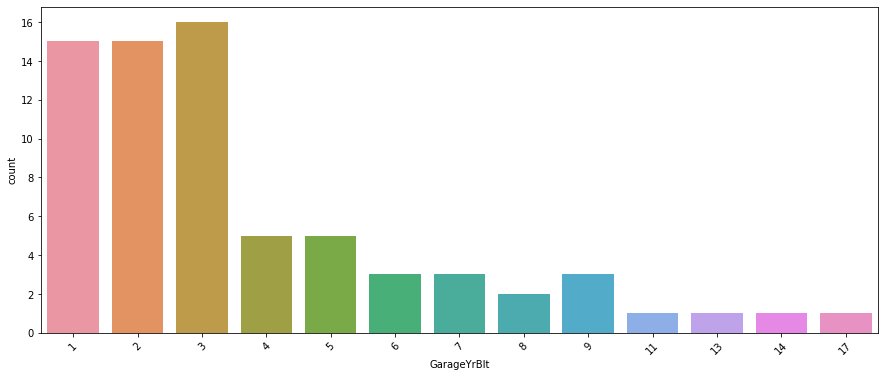

<Figure size 432x288 with 0 Axes>

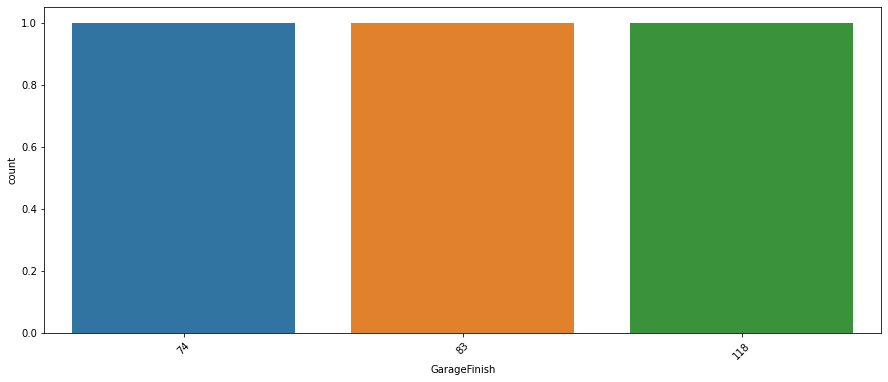

<Figure size 432x288 with 0 Axes>

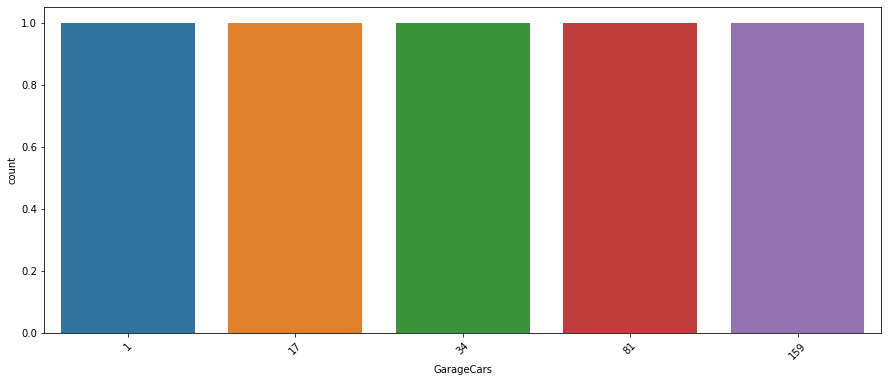

<Figure size 432x288 with 0 Axes>

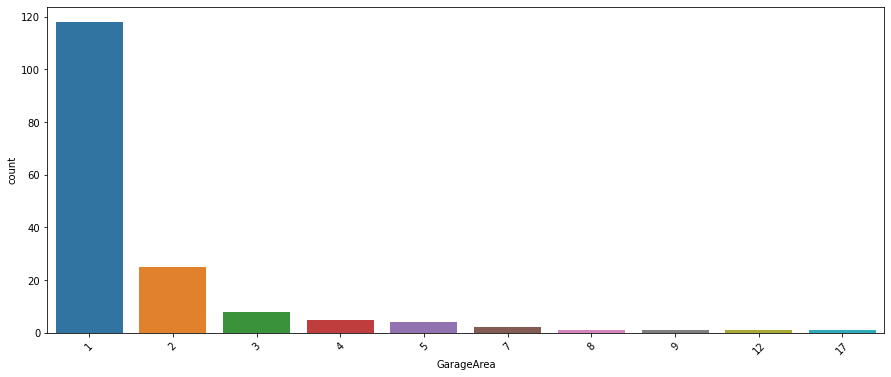

<Figure size 432x288 with 0 Axes>

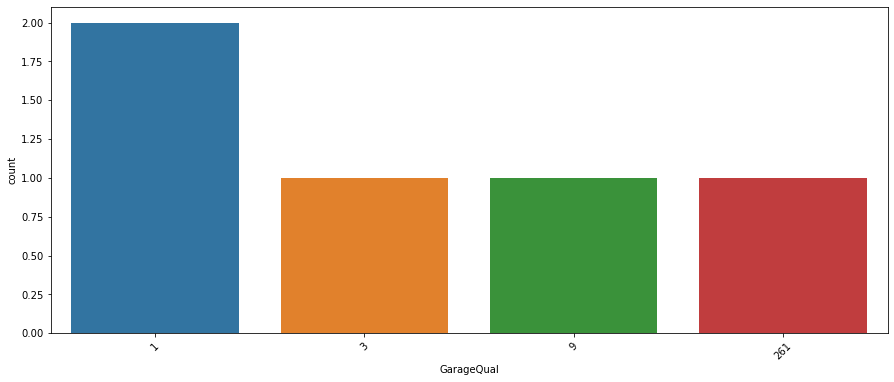

<Figure size 432x288 with 0 Axes>

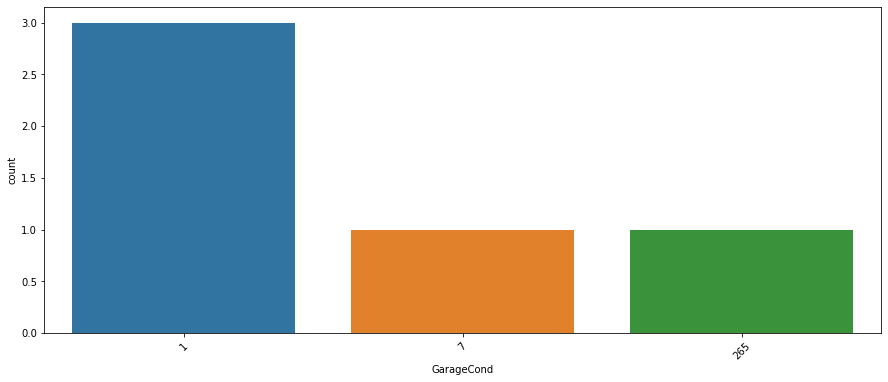

<Figure size 432x288 with 0 Axes>

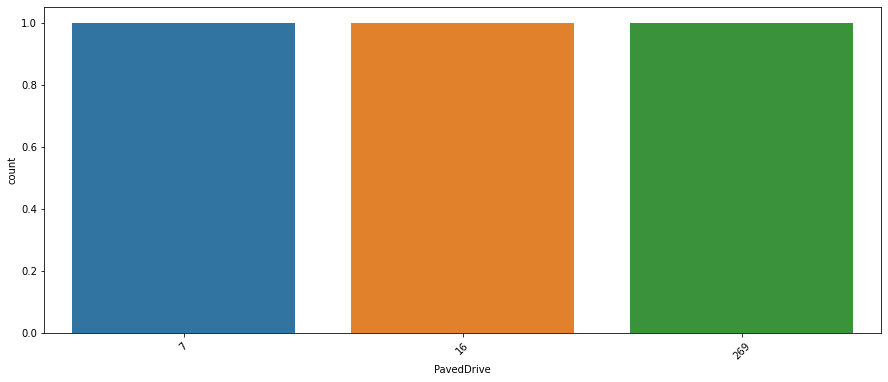

<Figure size 432x288 with 0 Axes>

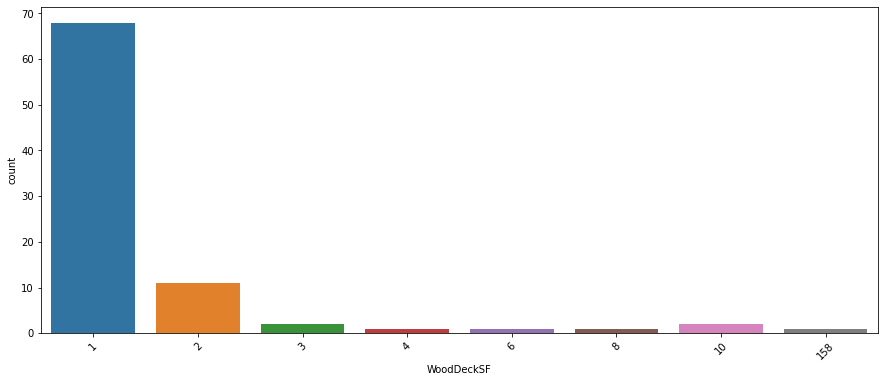

<Figure size 432x288 with 0 Axes>

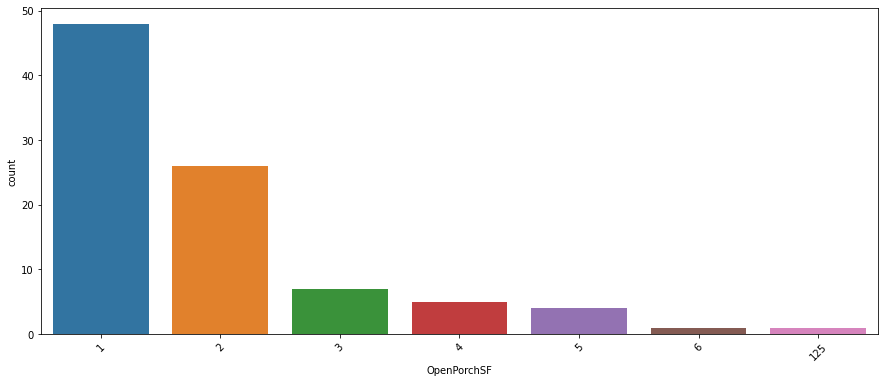

<Figure size 432x288 with 0 Axes>

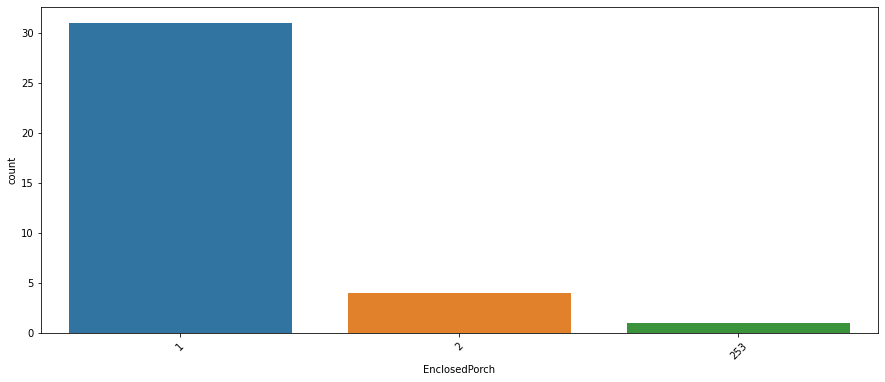

<Figure size 432x288 with 0 Axes>

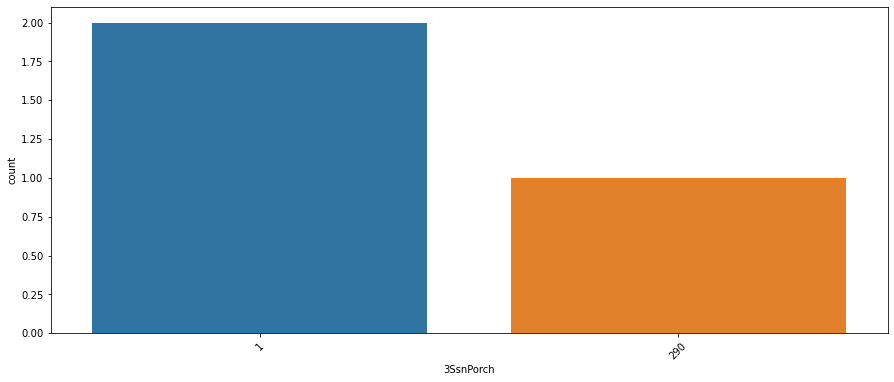

<Figure size 432x288 with 0 Axes>

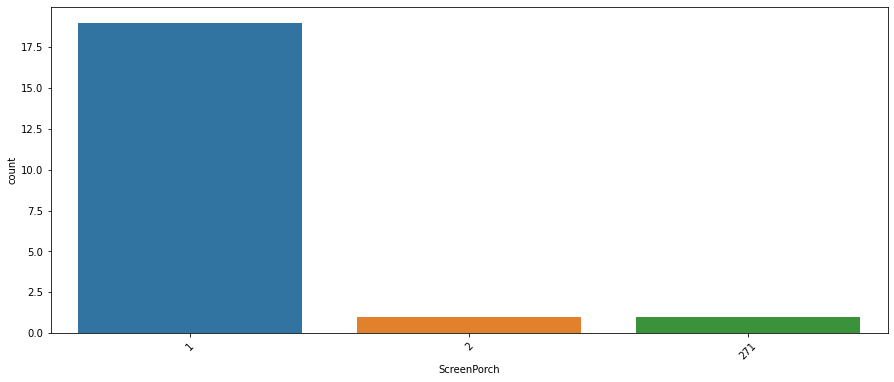

<Figure size 432x288 with 0 Axes>

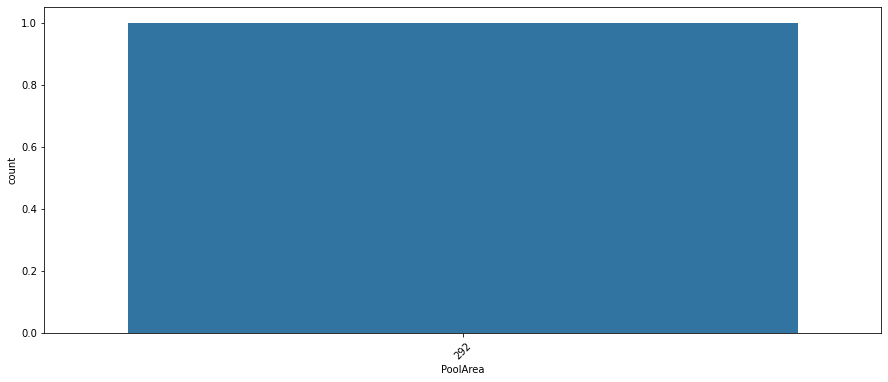

<Figure size 432x288 with 0 Axes>

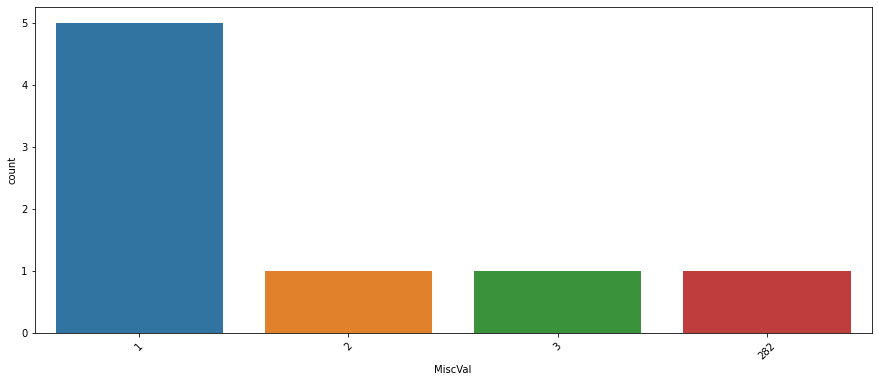

<Figure size 432x288 with 0 Axes>

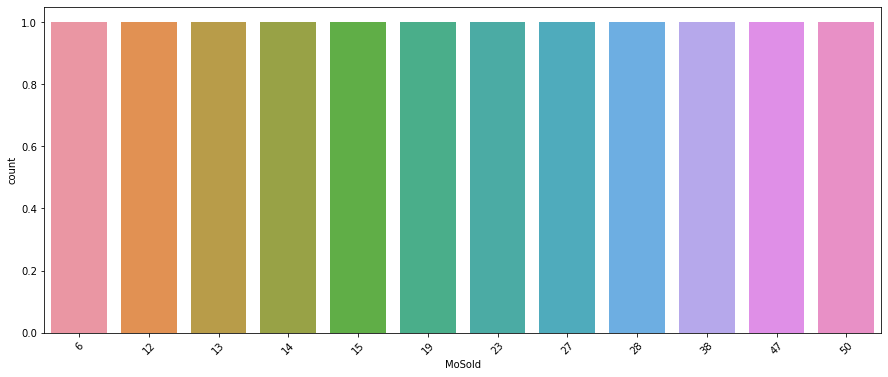

<Figure size 432x288 with 0 Axes>

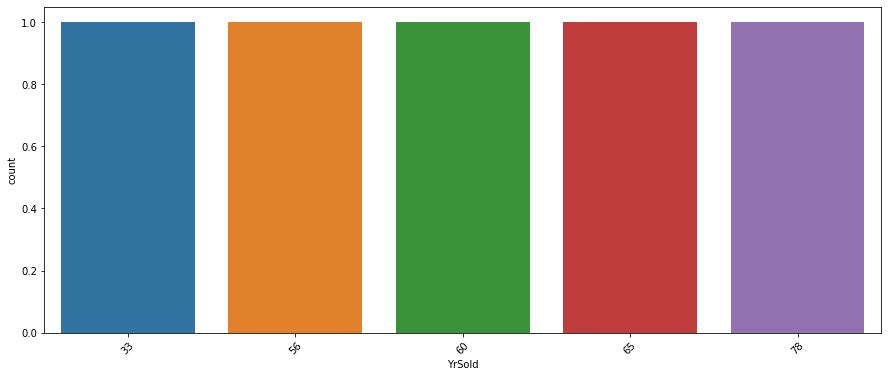

<Figure size 432x288 with 0 Axes>

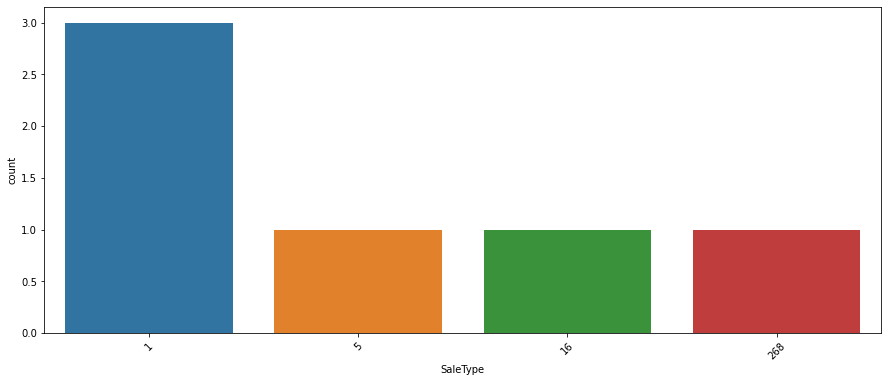

<Figure size 432x288 with 0 Axes>

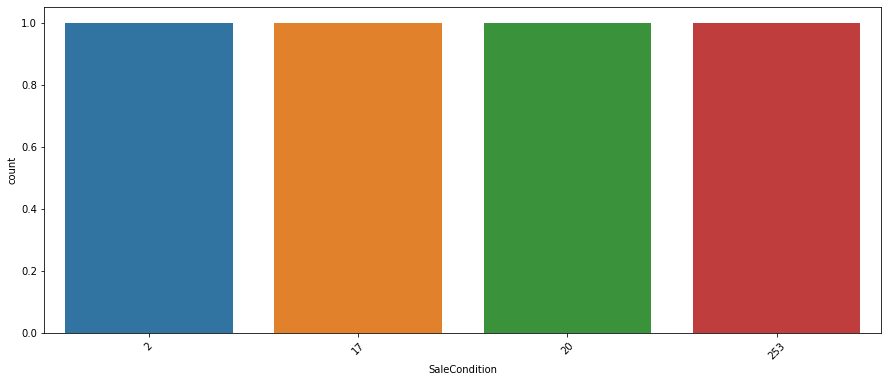

<Figure size 432x288 with 0 Axes>

In [41]:
#Lets check the value count of each column to see if there are any unexpected and unwanted entries present in the column in test dataset.

for i in df1.columns:
        plt.figure(figsize=(15,6))
        sns.countplot(df1[i].value_counts())
        plt.xticks(rotation=45)
        plt.figure()

I have'nt found any unnecessary or duplicate entries in any column in test dataset.

But i've encountered column with more than 85% zero values in them which are as follows:

1.BsmtFinSF2
2.LowQualFinSF
3.BsmtHalfBath
4.EnclosedPorch
5.3SsnPorch
6.ScreenPorch
7.PoolArea
8.MiscVal

So i have to drop these columns. In some other columns also there are zero values below 60% they are acceptable and also reasonable.

In [44]:
#Dropping unnecessary columns in test dataset
df1.drop(columns = ['BsmtFinSF2','LowQualFinSF','BsmtHalfBath','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal'],inplace = True)

I've succesfull dropped all the unnecessary columns, now we should proceed further.


In [45]:
#Again Checking again the null values in the train dataset
df.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      214
LotArea            0
Street             0
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         7
MasVnrArea         7
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          30
BsmtCond          30
BsmtExposure      31
BsmtFinType1      30
BsmtFinSF1         0
BsmtFinType2      31
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         0
1stFlrSF           0
2ndFlrSF           0
GrLivArea          0
BsmtFullBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
KitchenQual  

In [46]:
#Checking again the null values in the test dataset
df1.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage       45
LotArea            0
Street             0
LotShape           0
LandContour        0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         1
MasVnrArea         1
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual           7
BsmtCond           7
BsmtExposure       7
BsmtFinType1       7
BsmtFinSF1         0
BsmtFinType2       7
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
GrLivArea          0
BsmtFullBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
KitchenQual  

There are null values present in BOTH dataset, most of the columns in train dataset i have to treat them using some imputation technique.

## Treating Null Values Using Impution Technique : 

In [47]:
#Creating a list of categorical and numerical datatypes in train dataset
df_categorical=[]
df_numerical=[]
for col in df.columns:
    if (df[col].dtype=='object'):
          df_categorical.append(col)
    else:
        df_numerical.append(col)

In [51]:
#Creating a list of categorical and numerical datatypes in test dataset
df1_categorical=[]
df1_numerical=[]
for col in df1.columns:
    if (df1[col].dtype=='object'):
          df1_categorical.append(col)
    else:
        df1_numerical.append(col)

In [52]:
#Replacing null values of categorical column with mode of that column in train dataset.
catcol=df.columns.values
for i in range(0,len(catcol)):
    if df[catcol[i]].dtype == "object":
        df[catcol[i]].fillna(df[catcol[i]].mode()[0], inplace=True)

In [54]:
#Replacing null values of categorical column with mode of that column in test dataset.
catcol1=df1.columns.values
for i in range(0,len(catcol1)):
    if df1[catcol1[i]].dtype == "object":
        df1[catcol1[i]].fillna(df1[catcol1[i]].mode()[0], inplace=True)

In [55]:
#Replacing null values of numerical column with mean of that column in train dataset.
numcol=df.columns.values
for i in range(0,len(numcol)):
    if df[numcol[i]].dtype != "object":
        df[numcol[i]].fillna(df[numcol[i]].mean(), inplace=True)

In [56]:
#Replacing null values of numerical column with mean of that column in test dataset.
numcol1=df1.columns.values
for i in range(0,len(numcol1)):
    if df1[numcol1[i]].dtype != "object":
        df1[numcol1[i]].fillna(df1[numcol1[i]].mean(), inplace=True)

In [58]:
#Again Checking null values again in train dataset
df.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType  

In [59]:
#Checking null values again in test dataset
df1.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType  

There are no null values in both the dataset, hence all null values has been treated.

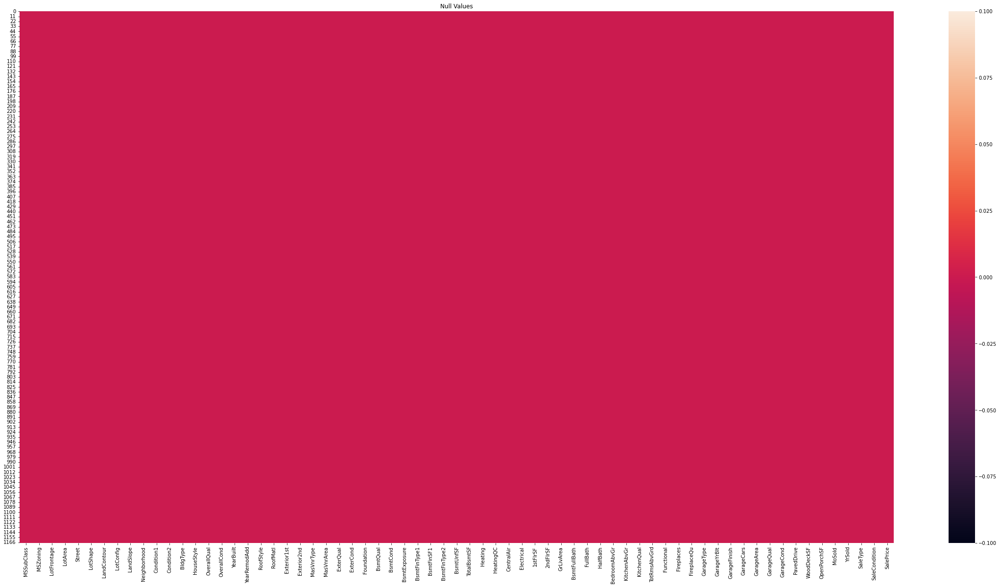

In [60]:
#Visualizeing null values again after imputation in train dataset
plt.figure(figsize=[40,20])
sns.heatmap(df.isnull())
plt.title("Null Values")
plt.show()

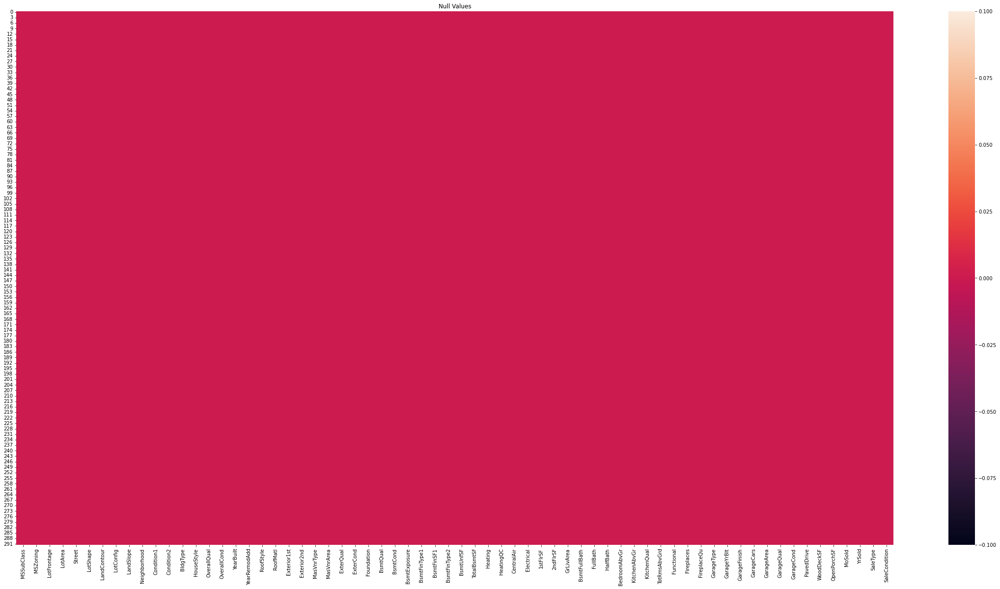

In [61]:
#Visualizeing null values again after imputation in train dataset
plt.figure(figsize=[40,20])
sns.heatmap(df1.isnull())
plt.title("Null Values")
plt.show()

In [62]:
#Checking for empty observations in target column
df.loc[df['SalePrice'] == " "]

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice


Hence there is no empty observations.

# Feature Extraction :

In [63]:
# Converting years column to age column in train dataset
df['Year_SinceBuilt'] = df['YearBuilt'].max() - df['YearBuilt']
df['Year_SinceRemodAdded'] = df['YearRemodAdd'].max() - df['YearRemodAdd']
df['Year_SinceSold'] = df['YrSold'].max() - df['YrSold']
df['GarageAge'] = df['GarageYrBlt'].max() - df['GarageYrBlt']

In [64]:
# Dropping old columns in train dataset
df.drop(['YearBuilt','YearRemodAdd','YrSold','GarageYrBlt'], axis=1, inplace = True)

In [66]:
# Converting years column to age column in test dataset
df1['Year_SinceBuilt'] = df1['YearBuilt'].max() - df1['YearBuilt']
df1['Year_SinceRemodAdded'] = df1['YearRemodAdd'].max() - df1['YearRemodAdd']
df1['Year_SinceSold'] = df1['YrSold'].max() - df1['YrSold']
df1['GarageAge'] = df1['GarageYrBlt'].max() - df1['GarageYrBlt']




In [67]:
# Dropping old columns in test dataset
df1.drop(['YearBuilt','YearRemodAdd','YrSold','GarageYrBlt'], axis=1, inplace = True)

I have converted all the year columns to there respective age, thinking that age will help us more than year in both train and test datasets.

In [69]:
#Checking statistical description of data set in train dataset
df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,70.988470,10484.749144,6.104452,5.595890,102.310078,444.726027,569.721747,1061.095034,1169.860445,348.826199,1525.066781,0.425514,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1.776541,476.860445,96.206336,46.559932,6.344178,181477.005993,39.069349,25.241438,2.195205,31.806159
std,41.940650,22.437056,8957.442311,1.390153,1.124343,182.047152,462.664785,449.375525,442.272249,391.161983,439.696370,528.042957,0.521615,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,0.745554,214.466769,126.158988,66.381023,2.686352,79105.586863,30.145255,20.785185,1.329738,24.198559
min,20.000000,21.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,34900.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,1143.250000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,338.000000,0.000000,0.000000,5.000000,130375.000000,10.000000,6.000000,1.000000,9.000000
50%,50.000000,70.988470,9522.500000,6.000000,5.000000,0.000000,385.500000,474.000000,1005.500000,1096.500000,0.000000,1468.500000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,24.000000,6.000000,163995.000000,38.000000,17.000000,2.000000,31.806159
75%,70.000000,79.250000,11515.500000,7.000000,6.000000,160.000000,714.500000,816.000000,1291.500000,1392.000000,729.000000,1795.000000,1.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,171.000000,70.000000,8.000000,215000.000000,56.000000,44.000000,3.000000,48.000000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,1600.000000,5644.000000,2336.000000,6110.000000,4692.000000,2065.000000,5642.000000,3.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,12.000000,755000.000000,135.000000,60.000000,4.000000,110.000000


In [71]:
#Checking description of data set in test dataset
df1.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
count,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000
mean,57.414384,66.425101,10645.143836,6.078767,5.493151,109.171821,439.294521,557.315068,1042.767123,1133.691781,339.657534,1477.051370,0.424658,1.575342,0.359589,2.794521,1.05137,6.417808,0.595890,1.729452,457.458904,86.397260,47.061644,6.232877,36.383562,24.705479,2.140411,30.240000
std,43.780649,19.975962,13330.669795,1.356147,1.063267,174.729023,429.559675,411.043768,424.561153,366.941919,424.278825,514.199429,0.508831,0.547856,0.494795,0.807336,0.23616,1.728105,0.621259,0.754430,210.785591,121.898836,65.865449,2.774556,30.447016,20.105792,1.322867,23.161183
min,20.000000,21.000000,1526.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,372.000000,0.000000,520.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,20.000000,57.750000,7200.000000,5.000000,5.000000,0.000000,0.000000,255.000000,771.750000,858.000000,0.000000,1061.500000,0.000000,1.000000,0.000000,2.000000,1.00000,5.000000,0.000000,1.000000,300.000000,0.000000,0.000000,4.000000,8.000000,6.750000,1.000000,8.000000
50%,50.000000,66.425101,9200.000000,6.000000,5.000000,0.000000,369.500000,487.000000,971.000000,1047.500000,0.000000,1440.000000,0.000000,2.000000,0.000000,3.000000,1.00000,6.000000,1.000000,2.000000,467.500000,0.000000,28.500000,6.000000,33.000000,16.000000,2.000000,30.240000
75%,70.000000,76.000000,11658.750000,7.000000,6.000000,180.000000,700.500000,780.000000,1322.000000,1370.500000,717.000000,1720.250000,1.000000,2.000000,1.000000,3.000000,1.00000,7.000000,1.000000,2.000000,569.750000,149.250000,66.000000,8.000000,55.000000,42.000000,3.000000,45.000000
max,190.000000,150.000000,215245.000000,10.000000,9.000000,1031.000000,1767.000000,1935.000000,3094.000000,2402.000000,1589.000000,3447.000000,2.000000,3.000000,2.000000,6.000000,3.00000,12.000000,2.000000,4.000000,1052.000000,728.000000,418.000000,12.000000,137.000000,60.000000,4.000000,94.000000


# Data Visualization:

## Univariate Analysis :

In [72]:
# checking for categorical and numeric column columns in train dataset

categorical_columns=[]
numerical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_columns.append(i)
    else:
        numerical_columns.append(i)
        
print(categorical_columns)
print(numerical_columns)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']
['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'SalePrice', 'Year_SinceBuilt', 'Year_SinceRemodAdded', 'Year_SinceSold', 'GarageAge']


In [74]:
# checking for categorical columns in test dataset
categorical_columns1=[]
numerical_columns1=[]
for i in df1.dtypes.index:
    if df1.dtypes[i]=='object':
        categorical_columns1.append(i)
    else:
        numerical_columns1.append(i)
print(categorical_columns1)
print(numerical_columns1)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']
['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'Year_SinceBuilt', 'Year_SinceRemodAdded', 'Year_SinceSold', 'GarageAge']


## Univarient analysis for numerical columns :

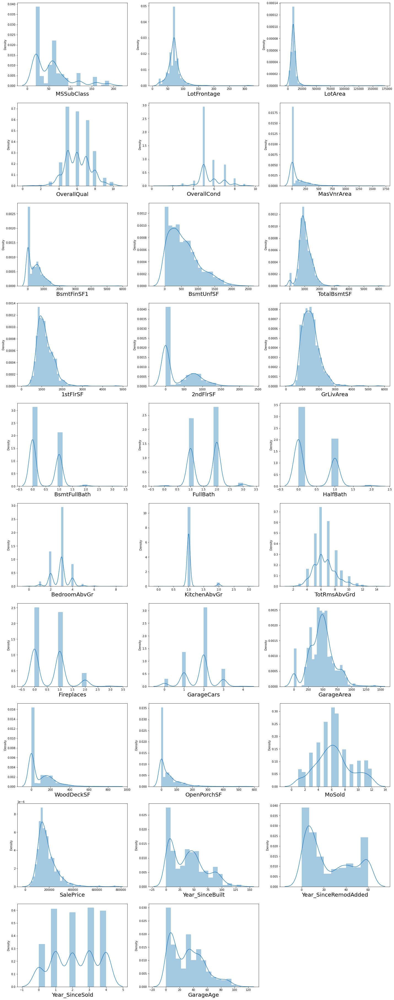

In [80]:
#Distribution plot for all numerical columns

plt.figure(figsize = (20,60))
plotnumber = 1
for column in df[numerical_columns]:
    if plotnumber <=40:
        ax = plt.subplot(12,3,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize = 20)
    plotnumber+=1
plt.tight_layout()

Here we can see that the data in the some of the columns have been left skewed, some columns are right skewed and some columns are normally distributed.

So we need too treat them in the further proceedings.

## Univarient analysis for categorical column : 

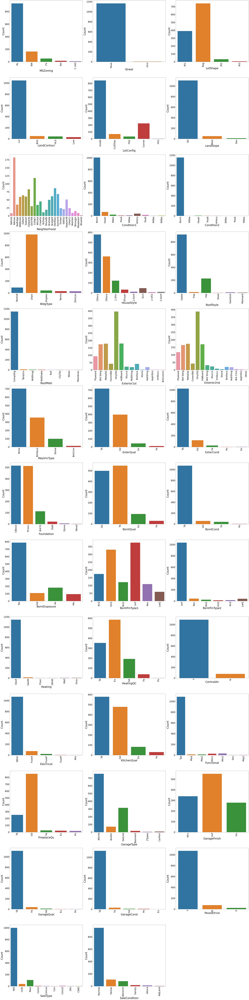

In [81]:
#Bar plot for all categorical columns

plt.figure(figsize = (45,180))
plotnumber = 1
for column in df[categorical_columns]:
    if plotnumber <=40:
        ax = plt.subplot(13,3,plotnumber)
        sns.countplot(df[column])
        plt.xticks(rotation=90,fontsize = 30)
        plt.yticks(rotation=0,fontsize = 30)
        plt.xlabel(column,fontsize = 35)
        plt.ylabel('Count',fontsize = 35)
    plotnumber+=1
plt.tight_layout()

## Observations:


1) It is found that Residential Low Density zoning has maximum count, for the feature general zoning classification of the sale (MSZoning).

2) Most of the properties have Paved road as their access to there property.

3) Most of the properties are regular in shape.

4) Most of the properties have Flat/Level LandContour.

5) Inside lot configured property has maximum count, for the feature Lot configuration(LotConfig).

6) Most of the property are built in Gentle slope land.

7) If the property is located in North Ames then count is good compared to other locations, for the feature Physical locations within Ames city limits(Neighborhood).

8) If the Proximity to various conditions-1 is normal then count is high for the feature Proximity to various conditions(Condition1).

9) If the Proximity to various conditions-2 is normal then count is high for the feature Proximity to various conditions (if more than one is present)(Condition2).

10) Most of the property are built for Single-family.

11) One story dwelling housestyle has maximum count for the feature Style of dwelling(HouseStyle).

12) Most of the properties have Gable roof, means its more preferable than other.

13) For Standard (Composite) Shingle roof material the count is high for the feature Roof material(RoofMatl).

14) For Vinyl Siding exterior-1 covering on house has maximum counts for the feature Exterior covering on house(Exterior1st).

15) For Vinyl Siding exterior-2 covering on house has maximum counts for the feature Exterior covering on house (if more than one material)(Exterior2nd).

16) For Masonry veneer type(MasVnrType) None has maximum count.

17) For Typical/Average(TA) quality of the material on the exterior has maximum count, for the feature Evaluates the quality of the material on the exterior (ExterQual).

18) Most of the properties have Cinder Block and Poured Contrete foundations, as they are most preffered.

19) The height of basement are mostly Gd	Good (90-99 inches) & TA	Typical (80-89 inches) 
    i.e. i range(80-99 inches)

20) For Typical/Average(TA) general condition of the basement the count is high for the feature Evaluates the general condition of the basement(BsmtCond)

21) For No Exposure garden level walls the count is maximum for the feature Refers to walkout or garden level walls(BsmtExposure).

22) For unfinished Rating of basement finished area-1 the count is maximum for the feature Rating of basement finished area(BsmtFinType1).

23) For unfinished Rating of basement finished area-2 the count is maximum for the feature Rating of basement finished area (if multiple types)(BsmtFinType2).

24) For Gas forced warm air furnace type of heating the count is maximum for the feature Type of heating(Heating).

25) For Excellent Heating quality and condition the count is high for the feature Heating quality and condition(HeatingQC).

26) For Central air conditioning-yes has maximum count for the feature Central air conditioning(CentralAir).

27) For Standard Circuit Breakers & Romex Electrical system the count is high for the feature Electrical system(Electrical). 

28) For Typical/Average(TA) and good Kitchen quality the count is maximum for the feature Kitchen quality(KitchenQual).

29) Typical Functionality has highest count for Home functionality (Assume typical unless deductions are warranted)(Functional).

30) For good Fireplace quality the count is high for the feature Fireplace quality(FireplaceQu).

31) If Garage location Attached to home then the count is high, for the feature Garage location(GarageType).

32) For Unfinished Interior of the garage the count is maximum, for the feature Interior finish of the garage(GarageFinish).

33) For Typical/Average(TA) Garage quality the count is high, for the feature Garage quality(GarageQual).

34) For Typical/Average(TA) Garage condition the count is high, for the feature Garage condition(GarageCond).

35) For Paved driveway the count is maximum, for the feature Paved driveway(PavedDrive).

36) For Warranty Deed - Conventional type of sales the count is maximum, for the feature Type of sale(SaleType).

37) For Normal sales condition the count is high, for the feature Condition of sale(SaleCondition).

# Bivarient Analysis :


## Bivarient Analysis For Numerical Column :

In [82]:
col_num =['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea','GarageArea','WoodDeckSF','OpenPorchSF','Year_SinceBuilt','Year_SinceRemodAdded','GarageAge']


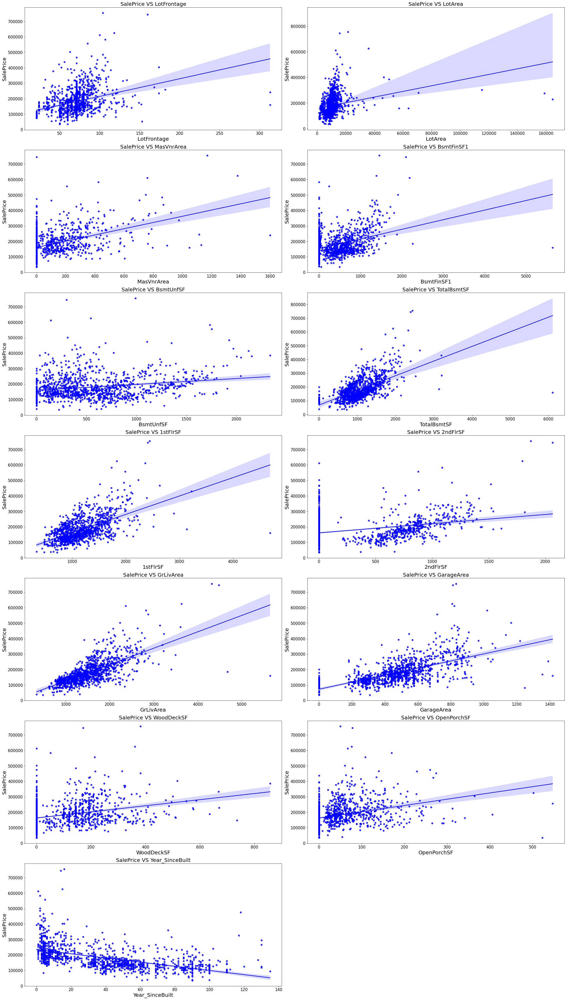

In [97]:
#regplot for numerical columns

plt.figure(figsize=(30,150))
for i in range(len(col)):
    plt.subplot(20,2,i+1)
    sns.regplot(x=df[col_num[i]] , y=df['SalePrice'],color="b")
    plt.title(f"SalePrice VS {col_num[i]}",fontsize=20)
    plt.xticks(fontsize=15)  
    plt.yticks(fontsize=15)
    plt.xlabel(col_num[i],fontsize = 20)
    plt.ylabel('SalePrice',fontsize = 20)
    plt.tight_layout()

## Observations :

1) As Linear feet of street connected to property(LotFrontage) is increseing sales is decreasing and the SalePrice is    rangeing between 0-3 lakhs.

2) As Lot size in square feet(LotArea) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

3) As Masonry veneer area in square feet(MasVnrArea) is increasing sales is decreasing and saleprice is rangeing          between 0-4 lakhs.

4) As Type 1 finished square feet(BsmtFinSF1) is increseing sales is decreasing and the saleprice is in between 0-4      lakhs.

5) As Unfinished square feet of basement area(BsmtUnfSF) is increseing sales is decreasing and the saleprice is in        between 0-4 lakhs. There are some outliers also.

6) As Total square feet of basement area(TotalBsmtSF) is increseing sales is decreasing and the saleprice is in          between 0-4 lakhs.

7) As First Floor square feet(1stFlrSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

8) As Second floor square feet(2ndFlrSF) is increseing sales is increasing in the range 500-1000 and the saleprice is    in between 0-4 lakhs.

9) As Above grade (ground) living area square feet(GrLivArea) is increseing sales is decreasing and the saleprice is      in between 0-4 lakhs.

10) As Size of garage in square feet(GarageArea) is increseing sales is increseing and the saleprice is in between 0-4     lakhs.

11) As Wood deck area in square feet(WoodDeckSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

12) As Open porch area in square feet(OpenPorchSF) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

13) As Year_SinceBuilt is increseing sales is decreasing and the saleprice is high for newly built building and the sales price is in between 0-4 lakhs.

14) As Since Remodel date (same as construction date if no remodeling or additions)(Year_SinceRemodAdded) is increseing sales is decreasing and the saleprice is in between 1-4 lakhs.

15) As Since Year garage was built(GarageAge) is increseing sales is decreasing and the saleprice is in between 0-4 lakhs.

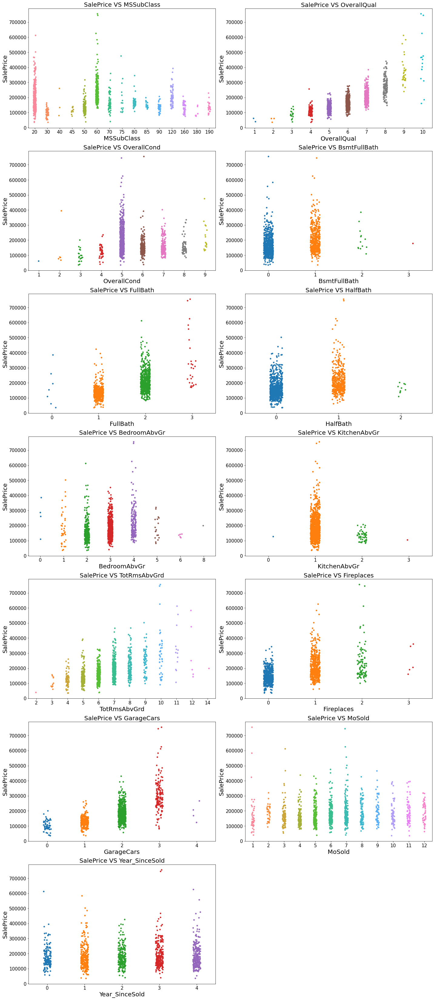

In [96]:
col_num1=['MSSubClass','OverallQual','OverallCond','BsmtFullBath','FullBath','HalfBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','MoSold','Year_SinceSold']

#stripplot for numerical columns

plt.figure(figsize=(20,130))
for i in range(len(col_num1)):
    plt.subplot(20,2,i+1)
    sns.stripplot(x=df[col_num1[i]] , y=df['SalePrice'])
    plt.title(f"SalePrice VS {col_num1[i]}",fontsize=20)
    plt.xticks(fontsize=15)  
    plt.yticks(fontsize=15)
    plt.xlabel(col_num1[i],fontsize = 20)
    plt.ylabel('SalePrice',fontsize = 20)
    plt.tight_layout()

## Observation :
1) For 1-STORY 1946 & NEWER ALL STYLES(20) and 2-STORY 1946 & NEWER(60) types of dwelling(MSSuubClass) the sales is      good and SalePrice is also high.

2) As the overall material quality and finish of the house(OverallQual) is increasing linearly sales is also         increasing And SalePrice is also increasing linearly.

3) For 5(Average) overall condition of the house(OverallCond) the sales is high and SalePrice is also high.

4) For 0 and 1 Basement full bathrooms(BsmtFullBath) the sales as well as SalePrice is high.

5) For 1 and 2 Full bathrooms above grade(FullBath) the sales as well as SalePrice is high.

6) For 0 and 1 Half baths above grade(HalfBath) the sales as well as SalePrice is high.

7) For 2, 3 and 4 Bedrooms above grade (does NOT include basement bedrooms)(BedroomAbvGr) the sales as well as SalePrice is high.

8) For 1 Kitchens above grade(KitchenAbvGr) the sales as well as SalePrice is high.

9) For 4-9 Total rooms above grade (does not include bathrooms)(TotRmsAbvGrd) the sales as well as SalePrice is high.

10) For 0 and 1 Number of fireplaces(Fireplaces) the sales as well as SalePrice is high.

11) For 1 and 2 Size of garage in car capacity(GarageCars) the sales is high and for 3 Size of garage in car 
    capacity(GarageCars) the SalePrice is high.

12) In between april to august for Month Sold(MoSold) the sales is good with SalePrice.

13) For all the Year_SinceSold the salePrice and sales both are same.


# Bivarient Analysis For Categorical Column :

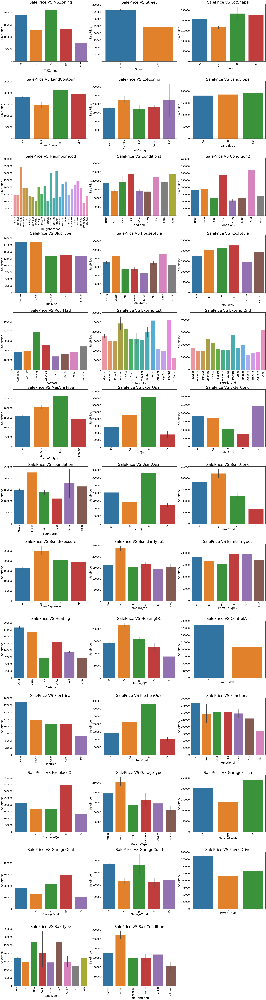

In [98]:
#Bar plot for all categorical columns

plt.figure(figsize=(40,150))
for i in range(len(categorical_columns)):
    plt.subplot(13,3,i+1)
    sns.barplot(y=df['SalePrice'],x=df[categorical_columns[i]])
    plt.title(f"SalePrice VS {categorical_columns[i]}",fontsize=40)
    plt.xticks(rotation=90,fontsize=25)  
    plt.yticks(rotation=0,fontsize=25)
    plt.xlabel(categorical_columns[i],fontsize = 30)
    plt.ylabel('SalePrice',fontsize = 30)
    plt.tight_layout()

## Observations :
    
 1) For Floating Village Residential(FV) and Residential Low Density(RL) zoning classification of the sale(MSZoning) the saleprice is high.
 
2) For paved type of road access to property(Street) the SalePrice is high.

3) For Slightly irregular(IR1), Moderately Irregular(IR2) and Irregular(IR3) shape of property(LotShape) the SalePrice is high.

4) For Hillside - Significant slope from side to side(HLS) in Flatness of the property(LandContour) the SalePrice is High.

5) For Cul-de-sac(CulDSac) Lot configuration(LotConfig) the SalePrice is High.

6) For all types of Slope of property(LandSlope) i.e.,Gentle slope(Gtl), Moderate Slope(Mod) and Severe Slope(Sev) the SalePrice is Equally High.

7) For Northridge(NoRidge) locations within Ames city limits(Neighborhood) the SalePrice is High.

8) For Within 200' of North-South Railroad(RRNn), Adjacent to postive off-site feature(PosA) and Near positive off-site feature--park, greenbelt, etc.(PosN) Proximity to various conditions(Condition1) has the maximum SalePrice.

9) For Adjacent to postive off-site feature(PosA) and Near positive off-site feature--park, greenbelt, etc.(PosN) Proximity to various conditions (if more than one is present)(Condition2) has maximum SalePrice.

10) For Single-family Detached(1Fam) and Townhouse End Unit(TwnhsE) type of dwelling(BldgType) the SalePrice is high.

11) For 2Story and Two and one-half story: 2nd level finished(2.5Fin) Style of dwelling(HouseStyle) the SalePrice is high.

12) For Shed Type of roof(RoofStyle) the SalePrice is high.

13) For Wood Shingles(WdShngl) Roof material(RoofMat1) the SalePrice is high.

14) For Cement Board(CemntBd), Imitation Stucco(ImStucc) and Stone type of Exterior covering on house(Exterior1st) the SalePrice is high.

15) For Cement Board(CemntBd), Imitation Stucco(ImStucc) and other Exterior covering on house (if more than one material)(Exterior2) has maximum SalePrice.

16) For Stone Masonry veneer type(MasvnrType) the SalePrice is high.

17) For Excellent(Ex) quality of the material on the exterior(ExterQual) the SalePrice is high.

18) For Excellent(Ex) present condition of the material on the exterior(ExterCond) the SalePrice is high.

19) For Poured Contrete(PConc) Type of foundation(Foundation) the SalePrice is high.

20) For Excellent(100+ inches)(Ex) height of the basement(BsmtQual) the SalePrice is high.

21) For Good(Gd) general condition of the basement(BsmtCond) the SalePrice is high.

22) For Good Exposure(Gd) of walkout or garden level walls(BsmtExposure) has maximum SalePrice.

23) For Good Living Quarters(GLQ) of basement finished area(BsmtFinType1) has maximum SalePrice.

24) For Good Living Quarters(GLQ) and Average Living Quarters(ALQ) of basement finished area (if multiple types)(BsmtFinType2) has maximum SalePrice.

25) For Gas forced warm air furnace(GasA) and Gas hot water or steam heat(GasW) Type of heating(Heating) has high SalePrice.

26) For Excellent(Ex) Heating quality and condition(HeatingQC) the SalePriceis high.

27) For building having Central air conditioning(CentralAir) the SalePrice is high.

28) For Standard Circuit Breakers & Romex(Sbrkr) of Electrical system(Electrical) the SalePrice is Maximum.

29) For Excellent(Ex) Kitchen quality(KitchenQual) the SalePrice is high.

30) For Typical Functionality(Typ) type of Home functionality (Assume typical unless deductions are warranted)(Functional) the SalePrice is high.

31) For Excellent - Exceptional Masonry Fireplace(Ex) of Fireplace quality(FireplaceQual) has highest SalePrice.

32) For Built-In (Garage part of house - typically has room above garage)(BuiltIn) Garage location(GarageType) the SalePrice is maximum.

33) For Completely finished(Fin) Interior of the garage(GarageFinish) the SalePrice is high.

34) Excellent(Ex) Garage quality(GarageQual) the SalePrice is high.

35) For Typical/Average(TA) and Good(Gd) Garage condition(GarageCond) the SalePrice is high.

36) For having Paved driveway(PavedDrive) the SalePriceis high.

37) For Home just constructed and sold(New) and Contract 15% Down payment regular terms(Con) of type of sale(SaleType) has highest SalePrice.

38) For Home was not completed when last assessed (associated with New Homes)(Partial) Condition of sale(SalesCondition) the SalePrice is maximum.

# Checking For Outliners :

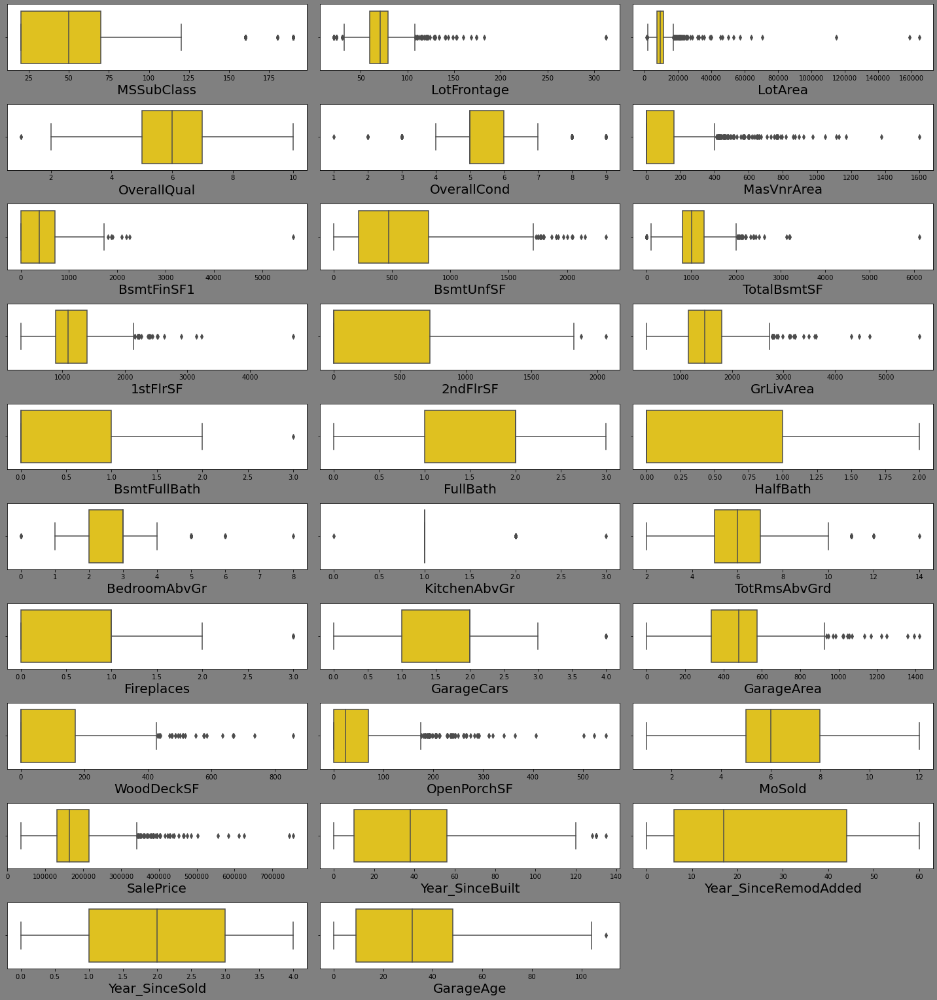

In [106]:
# Identifying the outliers using boxplot in train dataset:

plt.figure(figsize=(20,25),facecolor='gray')
plotnumber=1
for column in numerical_columns:
    if plotnumber<=30:
        ax=plt.subplot(12,3,plotnumber)
        sns.boxplot(df[column],color='gold')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

The columns with outliers in train dataset are:

MSSubClass, LotFrontage,   LotArea, OverallQual, OverallCond, MasVnrArea, BsmtFinSF1, BsmtUnfSF, TotalBsmtSF, 1stFlrSF, 2ndFlrSF, GrLivArea, BsmtFullBath, BedroomAbvGr, KitchenAbvGr, TotRmsAbvGrd, Fireplaces, GarageCars, GarageArea, WoodDeckSF, OpenPorchSF, Year_SinceBuilt, GarageAge


Since SalePrice is my target i should not remove outliers from this column.And MSSubClass, OverallQual and OverallCond are seems to be categorical so let me not remove outliers in this columns.

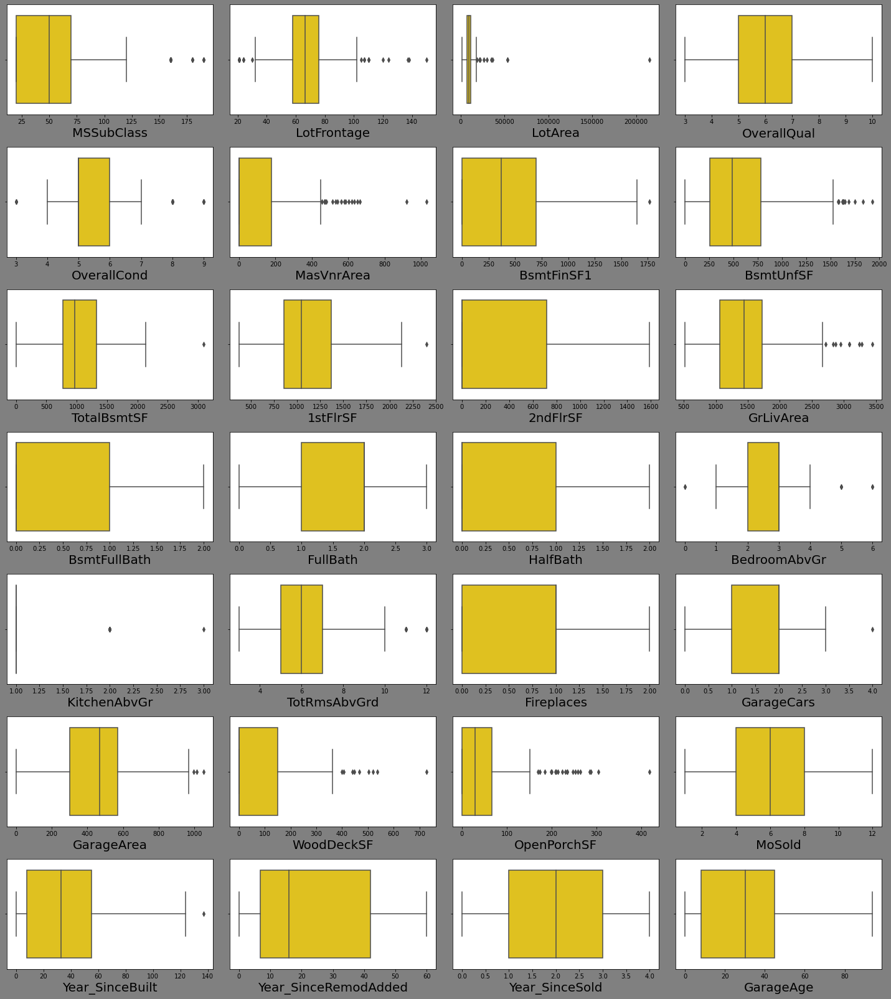

In [105]:
# Identifying the outliers using boxplot in test dataset

plt.figure(figsize=(20,25),facecolor='gray')
plotnumber=1
for column in numerical_columns1:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(df1[column],color='gold')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

The columns with outliers in test dataset are

MSSubClass, LotFrontage, LotArea, OverallCond, MasVnrArea, BsmtFinSF1, BsmtUnfSF, TotalBsmtSF, 1stFlrSF, GrLivArea, BedroomAbvGr, KitchenAbvGr, TotRmsAbvGrd, GarageCars, GarageArea, WoodDeckSF, OpenPorchSF, Year_SinceBuilt


MSSubClass and OverallCond are seems to be categorical so let me not remove outliers in this columns.

## Removing Outliners from Train DataSet :

#### 1) ZSCORE METHOD :

In [107]:
#Features having outliers in train dataset
features=df[['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','2ndFlrSF','GrLivArea','BsmtFullBath','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','Year_SinceBuilt','GarageAge']]

#Above we have created a list of columns with outliers in train dataset.

from scipy.stats import zscore
z=np.abs(zscore(features))
df_new=df[(z<3).all(axis=1)]
df_new.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,958,1078,GasA,TA,Y,SBrkr,958,0,958,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,RFn,2,440,TA,TA,Y,0,205,2,WD,Normal,128000,34,34,3,33.0
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,1043,2217,GasA,Ex,Y,SBrkr,2217,0,2217,1,2,0,4,1,Gd,8,Typ,1,TA,Attchd,Unf,2,621,TA,TA,Y,81,207,10,WD,Normal,268000,40,40,3,40.0
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,255,1117,GasA,Ex,Y,SBrkr,1127,886,2013,1,2,1,3,1,TA,8,Typ,1,TA,Attchd,Unf,2,455,TA,TA,Y,180,130,6,WD,Normal,269790,14,13,3,13.0
3,20,RL,105.00000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,1139,1844,GasA,Ex,Y,SBrkr,1844,0,1844,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,RFn,2,546,TA,TA,Y,0,122,1,COD,Normal,190000,33,33,0,33.0
4,20,RL,70.98847,16635,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,356,1602,GasA,Gd,Y,SBrkr,1602,0,1602,0,2,0,3,1,Gd,8,Typ,1,TA,Attchd,Fin,2,529,TA,TA,Y,240,0,6,WD,Normal,215000,33,10,1,33.0


In [109]:
#Checking shape of new and orignal train dataset

print("New",df_new.shape, "Orignal" ,df.shape)


New (1009, 67) Orignal (1168, 67)


In [110]:
#Checking dataloss in zscore method of train dataset

Dataloss = (((1168-1009)/1168)*100)
Dataloss

13.613013698630136

#### 2) IQR METHOD :

In [111]:
# 1st quantile
Q1=features.quantile(0.25)

# 3rd quantile
Q3=features.quantile(0.75)

# IQR
IQR=Q3 - Q1

df_1=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]


In [112]:
#Checking shape of new and orignal train dataset

print("New",df_1.shape,"Orignal"  ,df.shape)

New (825, 67) Orignal (1168, 67)


In [113]:
#Checking dataloss in IQR method of train dataset

Dataloss = (((1168-825)/1168)*100)
Dataloss

29.36643835616438

Both IQR and ZSCORE METHOD have more than (10-12)% loss, so let me have a look into percentile method to remove outliers.

#### PERCENTILE METHOD : 

In [114]:
#Removing outliers using percentile method in train dataset
for col in features:
    if df[col].dtypes != 'object':
        percentile = df[col].quantile([0.01,0.98]).values
        df[col][df[col]<=percentile[0]]=percentile[0]
        df[col][df[col]>=percentile[1]]=percentile[1]

# Removing Outliners from Test DataSet :

#### 1) ZSCORE METHOD :

In [115]:
#Features having outliers in test dataset
features1=df1[['LotFrontage','LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','TotalBsmtSF','1stFlrSF','GrLivArea','BedroomAbvGr','KitchenAbvGr','TotRmsAbvGrd','GarageCars','GarageArea','WoodDeckSF','OpenPorchSF','Year_SinceBuilt']]

# Above we've created list of columns with outliers in test dataset.

from scipy.stats import zscore
z=np.abs(zscore(features1))
df1_new=df1[(z<3).all(axis=1)]
df1_new.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold,GarageAge
0,20,RL,86.000000,14157,Pave,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,673,1922,GasA,Ex,Y,SBrkr,1922,0,1922,1,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,Fin,3,676,TA,TA,Y,178,51,7,WD,Normal,4,4,3,5.0
1,120,RL,66.425101,5814,Pave,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,184,1220,GasA,Gd,Y,SBrkr,1360,0,1360,1,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,RFn,2,565,TA,TA,Y,63,0,8,COD,Abnorml,25,26,1,26.0
2,20,RL,66.425101,11838,Pave,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,1753,1753,GasA,Ex,Y,SBrkr,1788,0,1788,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,RFn,2,522,TA,TA,Y,202,151,6,WD,Normal,8,9,1,9.0
3,70,RL,75.000000,12000,Pave,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,429,704,GasA,Ex,Y,SBrkr,860,704,1564,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,Unf,1,234,TA,TA,Y,0,0,7,WD,Normal,68,60,1,69.0
4,60,RL,86.000000,14598,Pave,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,894,894,GasA,Ex,Y,SBrkr,894,1039,1933,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,Fin,3,668,TA,TA,Y,100,18,1,WD,Normal,2,3,2,3.0


In [117]:
#Checking shape of new and orignal train dataset

print("New",df1_new.shape  ,"orignal",df1.shape)

New (250, 66) orignal (292, 66)


In [118]:
#Checking dataloss in zscore method of test dataset

Dataloss1 = (((292-250)/292)*100)
Dataloss1

14.383561643835616

#### IQR METHOD :

In [120]:
# 1st quantile
Q1=features1.quantile(0.25)

# 3rd quantile
Q3=features1.quantile(0.75)

# IQR
IQR=Q3 - Q1

df1_1=df1[~((df1 < (Q1 - 1.5 * IQR)) |(df1 > (Q3 + 1.5 * IQR))).any(axis=1)]

In [123]:
#Checking shape of new and orignal train dataset

print("New",df1_1.shape  ,"orignal",df1.shape)

New (196, 66) orignal (292, 66)


In [124]:
#Checking dataloss in Iqr method of test dataset

Dataloss1 = (((292-196)/292)*100)
Dataloss1

32.87671232876712

Here Also Both Iqr and zscore method have more than (10-12)% loss, so let me have a look into percentile method to remove outliers.

#### PERCENTILE METHOD : 

In [125]:
#Removing outliers using percentile method in test dataset
for col1 in features1:
    if df1[col1].dtypes != 'object':
        percentile = df1[col1].quantile([0.01,0.98]).values
        df1[col][df1[col]<=percentile[0]]=percentile[0]
        df1[col][df1[col]>=percentile[1]]=percentile[1]

# Checking For The Skewness :

In [126]:
#Checking for skewness of train dataset

df.skew()

MSSubClass              1.422019
LotFrontage             0.188060
LotArea                 1.191912
OverallQual             0.175082
OverallCond             0.580714
MasVnrArea              1.873138
BsmtFinSF1              0.639523
BsmtUnfSF               0.777624
TotalBsmtSF             0.166773
1stFlrSF                0.645842
2ndFlrSF                0.717390
GrLivArea               0.592755
BsmtFullBath            0.355224
FullBath                0.057809
HalfBath                0.656492
BedroomAbvGr           -0.145762
KitchenAbvGr            4.374289
TotRmsAbvGrd            0.443931
Fireplaces              0.552677
GarageCars             -0.434745
GarageArea             -0.135675
WoodDeckSF              1.053617
OpenPorchSF             1.513678
MoSold                  0.220979
SalePrice               1.953878
Year_SinceBuilt         0.468682
Year_SinceRemodAdded    0.495864
Year_SinceSold         -0.115765
GarageAge               0.608757
dtype: float64

The columns with skewness in train dataset:

MSSubClass, LotArea, OverallCond, MasVnrArea, BsmtFinSF1, BsmtUnfSF, 1stFlrSF, 2ndFlrSF, GrLivArea, HalfBath, KitchenAbvGr, Fireplaces, WoodDeckSF, OpenPorchSF, SalePrice, GarageAge

But as SalePrice is my target i should not remove skewness in this column. And MSSubClass and OverallCond are seems to be categorical so let me not remove outliers in this columns.

In [128]:
#Checking for skewness of test dataset

df1.skew()

MSSubClass               1.358597
LotFrontage              0.466813
LotArea                 12.781805
OverallQual              0.397312
OverallCond              1.209714
MasVnrArea               1.976804
BsmtFinSF1               0.739790
BsmtUnfSF                0.960708
TotalBsmtSF              0.519257
1stFlrSF                 0.692047
2ndFlrSF                 0.765511
GrLivArea                1.010586
BsmtFullBath             0.463685
FullBath                -0.049800
HalfBath                 0.758892
BedroomAbvGr             0.075315
KitchenAbvGr             4.849432
TotRmsAbvGrd             0.805535
Fireplaces               0.540164
GarageCars              -0.280324
GarageArea               0.133547
WoodDeckSF               1.708221
OpenPorchSF              2.185030
MoSold                   0.186504
Year_SinceBuilt          0.755233
Year_SinceRemodAdded     0.535600
Year_SinceSold          -0.018412
GarageAge                0.000000
dtype: float64

The columns with skewness in test dataset:

MSSubClass, LotArea, OverallCond, MasVnrArea, BsmtFinSF1, BsmtUnfSF, 1stFlrSF, 2ndFlrSF, GrLivArea, HalfBath, KitchenAbvGr, TotRmsAbvGrd, Fireplaces, WoodDeckSF, OpenPorchSF, Year_SinceBuilt, Year_SinceRemodAdded
MSSubClass and OverallCond are seems to be categorical so let me not remove outliers in this columns.

In GarageAge skewness is zero which means all the entries in this column are same so let me drop it in test dataset. Since i'm dropping in test i should drop in train also.

In [129]:
#Dropping unnecessary column in train dataset

df = df.drop(["GarageAge"],axis=1)

#Dropping unnecessary column in test dataset

df1 = df1.drop(["GarageAge"],axis=1)

### Removing skewness using yeo-johnson method for train dataset:

In [131]:
#Creating a list of skewed features in train dataset

fea=['LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','1stFlrSF','2ndFlrSF','GrLivArea','HalfBath','KitchenAbvGr','Fireplaces','WoodDeckSF','OpenPorchSF']

#Taking a list as fea with all the columns with skewness in train dataset.

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [132]:
df[fea] = scaler.fit_transform(df[fea].values)

In [133]:
#Checking skewness again in train dataset

df[fea].skew() 

LotArea         0.077861
MasVnrArea      0.415092
BsmtFinSF1     -0.418554
BsmtUnfSF      -0.304290
1stFlrSF       -0.000731
2ndFlrSF        0.279883
GrLivArea      -0.005974
HalfBath        0.498003
KitchenAbvGr    0.000000
Fireplaces      0.076595
WoodDeckSF      0.110387
OpenPorchSF    -0.010092
dtype: float64

As we can see all the skewness has been removed successfully

After removing skewness I'm getting skewness of KitchenAbvGr as 00000 which means this column has a unique single entry. So this column will create problem for us let me drop this column.

### Removing skewness using yeo-johnson method for test dataset :

In [134]:
#Creating a list of skewed features in test dataset

fea1=['LotArea','MasVnrArea','BsmtFinSF1','BsmtUnfSF','1stFlrSF','2ndFlrSF','GrLivArea','HalfBath','KitchenAbvGr','TotRmsAbvGrd','Fireplaces','WoodDeckSF','OpenPorchSF','Year_SinceBuilt','Year_SinceRemodAdded']

#Taking a list as fea with all the columns with skewness in test dataset.

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

In [138]:
df1[fea1] = scaler.fit_transform(df1[fea1].values)


#Checking skewness again in test dataset
df1[fea1].skew()


LotArea                 0.003111
MasVnrArea              0.363253
BsmtFinSF1             -0.441605
BsmtUnfSF              -0.232099
1stFlrSF               -0.000548
2ndFlrSF                0.284246
GrLivArea              -0.000307
HalfBath                0.621093
KitchenAbvGr            0.000000
TotRmsAbvGrd           -0.000469
Fireplaces              0.076669
WoodDeckSF              0.210102
OpenPorchSF            -0.058951
Year_SinceBuilt        -0.147007
Year_SinceRemodAdded   -0.081089
dtype: float64

After removing skewness I'm getting skewness of KitchenAbvGr as 4.2536. Since i have removed this column in train dataset to get same allingment let me drop in test also.



In [140]:
#Dropping unnecessary column
df1 = df1.drop(["KitchenAbvGr"],axis=1)

# Encoding :

In [141]:
#Replacing ratings with suitable numbers in required columns in train dataset

column = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in column:
    df[i] = df[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

#Replacing ratings with suitable numbers in required columns in test dataset

column = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in column:
    df1[i] = df1[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [143]:
#Ordinal encoding for train dataset

from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=OE.fit_transform(df[i].values.reshape(-1,1))

        #Ordinal encoding for test dataset

from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in df1.columns:
    if df1[i].dtypes=='object':
        df1[i]=OE.fit_transform(df1[i].values.reshape(-1,1))

I have encoded all my categorical columns in train and test datasets using Ordinal encoder.

### Correlation : 

In [144]:
#Correlation of train dataset

cor = df.corr()
cor

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,SalePrice,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold
MSSubClass,1.000000,0.007478,-0.391424,-0.400825,-0.035981,0.104485,-0.021387,0.076880,-0.014930,0.013918,-0.042474,-0.044319,0.731815,0.381585,0.070462,-0.056978,-0.100641,-0.032214,-0.090178,-0.120022,-0.013252,0.022091,0.032564,-0.051385,0.053951,0.070818,-0.009496,-0.068192,0.017515,-0.041361,0.040573,-0.133695,-0.229300,0.047734,0.005480,-0.113883,0.045533,-0.264403,0.355020,0.096452,-0.011290,0.140807,0.165938,-0.037908,0.295971,0.019462,0.049001,0.022913,-0.032338,0.013901,0.077469,-0.000067,-0.031897,-0.097615,0.013774,-0.039232,-0.068702,0.016371,0.025996,-0.016015,0.035050,-0.028981,-0.060775,-0.031787,-0.056618,0.038595
MSZoning,0.007478,1.000000,-0.084834,-0.058912,0.140215,0.053655,0.001175,-0.027246,-0.023952,-0.251833,-0.025651,0.031959,-0.024776,-0.110991,-0.134037,0.189553,0.000913,0.009719,-0.012037,0.005548,-0.033521,-0.037361,-0.160447,0.097907,-0.244844,-0.206193,-0.041842,0.037414,0.021518,-0.036041,-0.031322,-0.032954,-0.065060,0.051188,-0.149446,-0.015887,-0.079205,-0.037611,-0.016193,-0.086858,-0.009900,-0.188837,-0.125164,-0.000610,0.021281,-0.133170,-0.024508,-0.091684,0.009349,-0.011942,0.125155,0.162566,-0.130963,-0.163414,-0.095053,-0.073200,-0.077280,0.006946,-0.182359,-0.051646,0.079854,0.004501,-0.133221,0.296752,0.174586,0.004964
LotFrontage,-0.391424,-0.084834,1.000000,0.596143,-0.044573,-0.157341,-0.016620,-0.201691,0.023253,0.091671,-0.022579,0.011970,-0.467073,0.057902,0.230687,-0.051887,0.168101,0.063294,0.079942,0.108934,-0.066054,0.166180,0.158712,-0.001004,0.090652,0.163680,0.047333,-0.121117,-0.028977,0.087060,-0.015941,0.130111,0.318263,-0.036713,0.084699,0.087970,0.073880,0.394878,-0.036998,0.318133,0.070859,0.180823,0.049731,0.278173,-0.006952,0.158665,0.323070,0.037977,0.227523,-0.059379,-0.243693,-0.202471,0.297190,0.334422,0.053380,0.039626,0.106891,0.065003,0.168784,0.027718,-0.040647,0.076587,0.358470,-0.130022,-0.080871,0.005074
LotArea,-0.400825,-0.058912,0.596143,1.000000,-0.072669,-0.287003,-0.074834,-0.198998,0.176280,0.075420,0.069366,0.056741,-0.524128,0.005503,0.190547,0.010314,0.119446,0.220463,0.079181,0.095689,-0.019842,0.076589,0.097839,0.070513,0.009319,0.116129,0.047736,-0.144857,-0.043423,0.119301,-0.073788,0.052521,0.332367,-0.021160,0.047385,0.073866,0.053827,0.452791,0.009290,0.397820,0.108691,0.187219,0.061575,0.297515,0.003492,0.127004,0.369388,-0.025038,0.328380,-0.096589,-0.201895,-0.155464,0.272560,0.319552,0.060260,0.030388,0.041033,0.125098,0.146222,0.021311,-0.022130,0.046115,0.394343,-0.028547,-0.028632,0.039843
Street,-0.035981,0.140215,-0.044573,-0.072669,1.000000,-0.012941,0.105226,0.000153,-0.141572,0.001420,0.002189,0.001406,-0.013606,0.016793,0.057140,0.031082,-0.006875,0.007889,0.012482,0.014618,0.000822,0.020075,0.091807,-0.028096,0.032701,0.027107,0.002199,0.065253,-0.006420,0.008924,0.045208,0.030988,0.016841,0.006981,0.038560,0.043024,0.038720,0.009913,0.026241,0.052837,-0.010398,0.033208,0.045883,0.028722,0.012781,0.068306,0.039782,-0.015309,0.021069,-0.027427,-0.000824,-0.001178,0.001838,-0.002976,-0.005942,-0.006471,0.041318,0.022918,0.017900,-0.008860,0.025920,0.014176,0.044753,-0.021386,-0.057866,0.019635
LotShape,0.104485,0.053655,-0.157341,-0.287003,-0.012941,1.000000,0.081803,0.211395,-0.101187,-0.031852,-0.136885

In [145]:
#Correlation of test dataset
cor = df1.corr()
cor

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold
MSSubClass,1.000000,0.266517,-0.454786,-0.559657,0.004588,0.176681,0.068736,0.071784,-0.073979,-0.081962,0.042599,-0.036770,0.798007,0.455233,-0.116077,-0.068113,-0.183492,-0.019367,-0.103303,-0.202425,-0.092343,0.041990,-0.047717,-0.120495,0.072808,0.099330,0.016528,-0.049358,0.003453,-0.080689,0.043449,-0.196697,-0.336822,0.049709,-0.116916,-0.053192,0.075568,-0.390978,0.400684,0.030653,-0.000676,0.095903,0.210890,-0.061750,-0.134592,-0.031809,-0.075457,-0.074559,-0.083281,0.143455,0.059519,-0.086798,-0.122536,0.061413,0.025030,-0.024900,0.040682,-0.104641,-0.004079,-0.105307,-0.010155,-0.024612,0.060546,-0.044441
MSZoning,0.266517,1.000000,-0.335754,-0.335805,-0.063162,0.167716,-0.099137,0.055261,-0.035312,-0.204984,-0.059909,0.105995,0.230251,-0.068366,-0.276394,0.191126,-0.031210,-0.022604,-0.028611,-0.028994,0.010358,-0.125356,-0.327079,0.065494,-0.195382,-0.219848,-0.139784,0.050552,0.038716,-0.140046,-0.015825,-0.140089,-0.270929,0.094397,-0.225763,-0.235065,-0.035888,-0.227152,0.017233,-0.211886,-0.084559,-0.236326,-0.181873,-0.104881,-0.266916,-0.153357,-0.131738,-0.169600,0.050584,0.142661,0.233188,-0.306561,-0.304614,-0.087401,-0.067022,-0.236680,-0.100888,-0.185326,0.074308,0.123993,0.005290,0.365869,0.188508,0.072716
LotFrontage,-0.454786,-0.335754,1.000000,0.623700,-0.056531,-0.147720,-0.086163,-0.124470,0.176406,0.184817,0.064350,-0.018887,-0.436593,-0.080950,0.254760,-0.096571,0.199222,0.077308,0.018168,0.035881,0.055159,0.108944,0.185375,-0.072894,0.130965,0.162885,0.043670,-0.114149,-0.007482,0.097369,-0.115149,0.157696,0.398795,0.011852,0.098609,0.031703,0.020348,0.458767,-0.080395,0.348015,0.085464,0.227718,0.031989,0.227534,0.181377,0.330815,-0.002318,0.256905,0.000598,-0.239243,-0.303757,0.306181,0.317132,0.058944,0.033971,0.076602,0.020964,0.054913,-0.045333,0.034876,0.037168,-0.152912,-0.085350,-0.059745
LotArea,-0.559657,-0.335805,0.623700,1.000000,-0.099348,-0.294907,-0.139905,-0.150922,0.429145,0.184733,0.059812,-0.034579,-0.588876,-0.082811,0.217092,-0.099886,0.234422,0.035262,0.070080,0.090332,0.002839,0.057879,0.165959,-0.025418,0.073686,0.113234,0.048353,-0.171785,0.003165,0.136856,-0.008923,0.113707,0.408620,0.059190,0.068964,0.060219,-0.001966,0.495823,-0.052562,0.397836,0.148346,0.210105,0.066096,0.307383,0.137635,0.399155,0.047121,0.293361,0.023628,-0.205593,-0.245896,0.335243,0.350725,0.026787,-0.036731,-0.017594,0.098388,0.134890,-0.045307,0.076505,0.058346,-0.079597,-0.059335,-0.017708
Street,0.004588,-0.063162,-0.056531,-0.099348,1.000000,-0.002444,0.153613,0.058229,-0.324146,-0.045972,-0.246714,0.004868,-0.028820,0.043073,0.066173,0.077702,-0.054925,0.006540,-0.021532,-0.019729,0.036783,-0.015019,0.128016,0.024868,0.043091,0.009123,0.003768,0.099047,-0.037657,-0.038548,0.110019,0.095286,-0.029632,0.011782,0.060962,0.156680,-0.025961,-0.012989,0.072274,0.050722,-0.094062,0.087362,-0.025380,0.030347,0.058313,0.067617,-0.018670,-0.027697,0.033426,0.006743,-0.029487,-0.084965,-0.117624,-0.006540,-0.007318,-0.023367,-0.002395,-0.019373,0.036965,-0.019125,-0.012345,-0.046874,-0.090380,0.040272
LotShape,0.176681,0.167716,-0.147720,-0.294907,-0.002444,1.000000,0.100105,0.262901,-0.094606,-0.067832,-0.022692,-0.082226,0.178101,-0.056015,-0.193911,-0.041775,0.064795,0.058711,0.038251,0.013260,0.063936

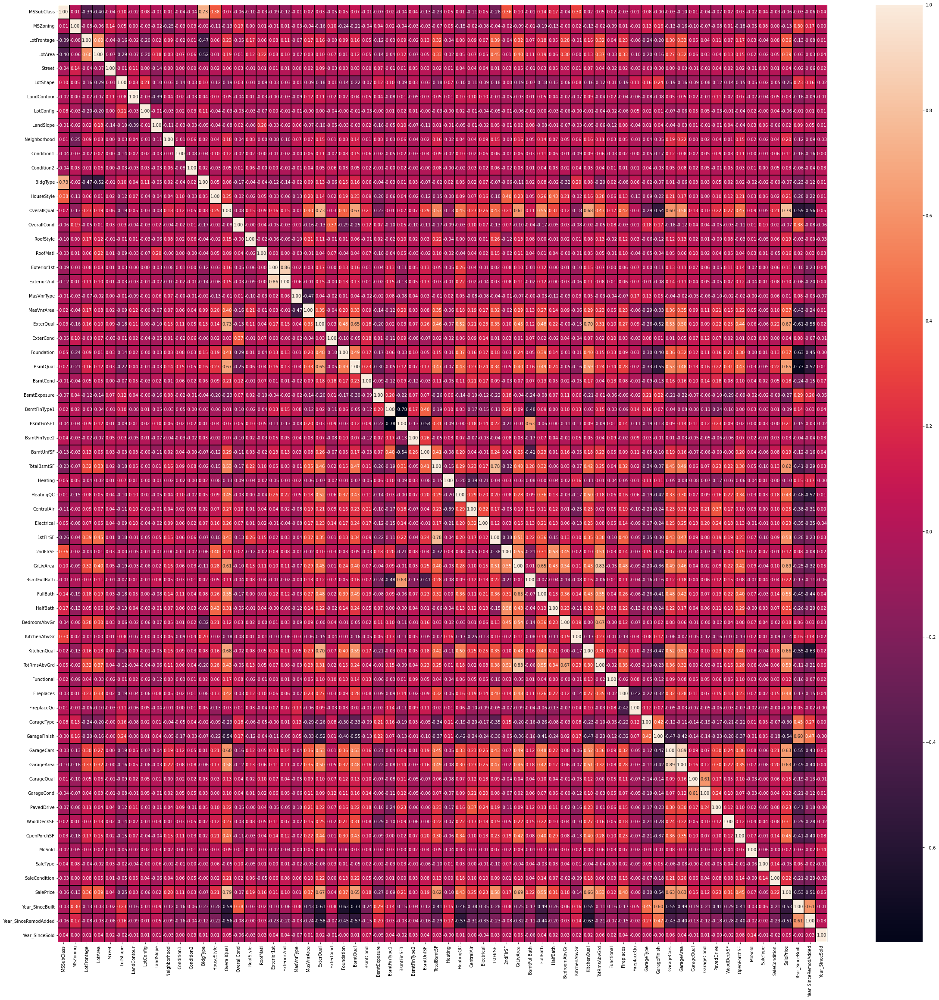

In [148]:
# Visualizing the correlation matrix by plotting heat map for train dataset.

plt.figure(figsize=(40,40))
sns.heatmap(df.corr(), annot=True, linewidths=0.1, linecolor='black', fmt='0.2f')
plt.yticks(rotation=0);

I can clearly observe a multicolinearity issue in some of the features of train dataset so I have to check VIF and Let me plot a bar graph to get better insight on targets correlation with other features.

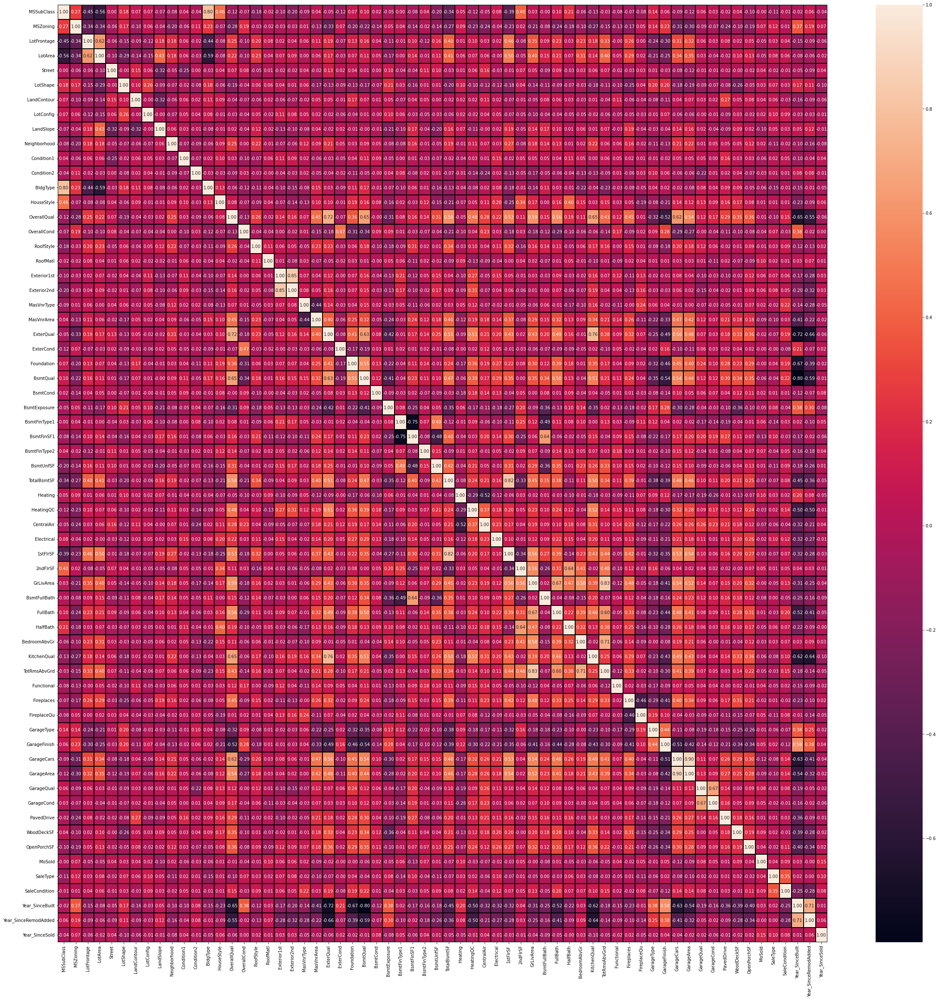

In [149]:
# Visualizing the correlation matrix by plotting heat map for test dataset.

plt.figure(figsize=(40,40))
sns.heatmap(df1.corr(), annot=True, linewidths=0.1, linecolor='black', fmt='0.2f')
plt.yticks(rotation=0);

I can clearly observe a multicolinearity issue in some of the features of test dataset so i have to check VIF and Let me plot a bar graph to get better insight on targets correlation with other features.

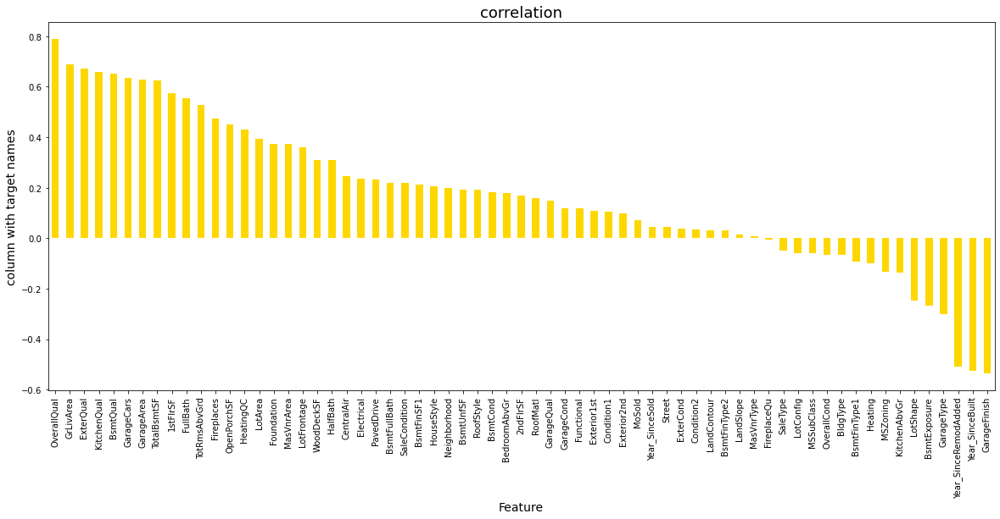

In [153]:
plt.figure(figsize=(20,8))
df.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='gold')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

Here Clearly I can see that MasVnrType and ForeplaceQu are least correlated with target but let me keep those columns as it is and continue.

### Seperating Labels And Features In Train DataSet :

In [151]:
x = df.drop("SalePrice",axis=1)
y = df["SalePrice"]

In [154]:
#Scaling the train data using standard scaler:

from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

In [155]:
X.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold
0,1.508301,-0.021646,0.039092,-1.306083,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.142224,-0.037339,-0.023979,2.985495,-0.549930,-0.075169,-0.530217,-0.483544,-0.134573,-0.212927,-0.104890,0.395209,-0.822896,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-1.523529,-0.117054,0.310141,0.916764,0.067300,-0.11909,-1.178317,0.267506,0.299036,-0.481887,-0.871789,-1.281768,-0.838227,0.793082,-0.782707,-1.144966,-0.218022,-0.788838,-1.009429,0.261146,0.779453,-1.163409,-0.693653,-0.288773,0.307737,-0.163806,0.101364,0.110393,0.291828,-0.960144,1.423871,-1.617822,0.330033,0.207932,-0.162248,0.421565,0.605487
1,-0.877042,-0.021646,1.321126,1.356458,0.058621,-1.373107,0.318473,0.606420,3.295414,-0.024227,-0.037339,-0.023979,-0.403288,-0.549930,1.364138,0.359572,-1.685203,6.090408,1.079014,1.050880,0.395209,-0.822896,1.032209,2.589114,0.852451,-0.832343,3.332324,-1.113129,-1.523529,0.395541,-0.771186,1.042594,2.453434,-0.11909,0.903792,0.267506,0.299036,2.082190,-0.871789,1.377184,1.192995,0.793082,-0.782707,1.475072,-0.218022,0.716657,0.975397,0.261146,0.779453,-1.163409,-0.693653,0.946709,0.307737,0.717359,0.101364,0.110393,0.291828,0.783831,1.428474,1.361470,0.330033,0.207932,0.041777,0.710356,0.605487
2,0.077095,-0.021646,1.160948,0.113089,0.058621,-1.373107,0.318473,-1.220661,-0.226126,0.475125,-0.037339,-0.023979,-0.403288,1.030838,0.644484,-0.530217,-0.483544,-0.134573,-0.535912,-0.682775,0.395209,-0.822896,1.032209,-0.223988,0.852451,0.647378,-0.037507,-1.987463,-0.434828,0.934402,0.310141,-0.510359,0.165553,-0.11909,0.903792,0.267506,0.299036,0.048689,1.177246,1.060650,1.192995,0.793082,1.268421,0.165053,-0.218022,-0.788838,0.975397,0.261146,0.779453,-1.163409,-0.693653,0.946709,0.307737,-0.090782,0.101364,0.110393,0.291828,1.047285,1.208580,-0.128176,0.330033,0.207932,-0.842331,-0.589202,0.605487
3,-0.877042,-0.021646,1.855050,0.530989,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,0.359572,1.919773,-0.134573,-0.212927,-0.104890,-1.241686,1.385487,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-0.979178,0.803940,0.310141,1.178365,1.997087,-0.11909,0.903792,0.267506,0.299036,1.665038,-0.871789,0.775546,-0.838227,0.793082,-0.782707,0.165053,-0.218022,-0.788838,0.313788,0.261146,0.779453,-1.163409,-0.693653,-0.288773,0.307737,0.352235,0.101364,0.110393,0.291828,-0.960144,1.178672,-1.990233,-4.612004,0.207932,-0.196252,0.373434,-1.651563
4,-0.877042,-0.021646,0.039092,1.497522,0.058621,-1.373107,0.318473,-0.611634,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,1.249361,-0.483544,-0.134573,-1.504868,-1.549602,2.032104,1.140684,1.032209,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-1.523529,1.189724,0.310141,-0.230032,1.387415,-0.11909,-0.137262,0.267506,0.299036,1.201931,-0.871789,0.322952,-0.838227,0.793082,-0.782707,0.165053,-0.218022,0.716657,0.975397,0.261146,0.779453,-1.163409,-0.693653,-1.524255,0.307737,0.269474,0.101364,0.110393,0.291828,1.139237,-1.062308,-0.128176,0.330033,0.207932,-0.196252,-0.733598,-0.899213


In [156]:
X.shape

(1168, 65)

In [158]:
#Scaling the test data using standard scaler:

from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_1 = pd.DataFrame(scaler.fit_transform(df1), columns=df1.columns)

In [159]:
X_1.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,SaleType,SaleCondition,Year_SinceBuilt,Year_SinceRemodAdded,Year_SinceSold
0,-0.856054,-0.287006,0.981605,0.842656,0.083045,-1.402669,-2.566101,-2.001106,-0.226274,1.554460,-0.028763,-0.058621,-0.444642,-0.518671,2.157766,-0.464603,1.846195,-0.078757,0.694397,0.733065,1.952161,1.182923,1.137790,-0.299447,0.776109,2.077301,-0.045376,-1.192678,-0.377559,1.205140,0.296045,0.455087,2.074477,-0.141879,0.842032,0.248633,0.312609,1.814725,-0.870294,0.943726,1.132656,0.776457,-0.738058,0.254952,0.816613,0.961793,0.22482,0.808861,0.487877,-0.659455,-1.474589,1.687009,1.038573,0.078757,0.088121,0.281378,1.119038,0.718308,0.276960,0.23029,0.148654,-1.301385,-1.245981,0.650908
1,1.431981,-0.287006,0.000000,-0.739104,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.554460,-0.028763,-0.058621,2.722077,-0.518671,1.419117,-0.464603,-0.523427,-0.078757,-1.046066,-1.248926,0.355435,-0.846534,1.137790,-0.299447,-0.518884,0.619196,-0.045376,-2.090260,-0.377559,1.064798,0.296045,-0.841820,0.418166,-0.141879,-0.208709,0.248633,0.312609,0.726749,-0.870294,-0.077517,1.132656,-1.051974,-0.738058,-2.226584,0.816613,-1.618327,0.22482,0.808861,2.268630,-0.659455,-0.254816,0.359228,0.511068,0.078757,0.088121,0.281378,0.813787,-1.111540,0.637997,-6.49418,-3.323909,-0.063464,0.394767,-0.863555
2,-0.856054,-0.287006,0.000000,0.524304,0.083045,0.745474,0.299297,0.598774,-0.226274,-1.281387,-0.028763,-0.058621,-0.444642,-0.518671,1.419117,-0.464603,1.846195,-0.078757,0.694397,0.733065,0.355435,-0.846534,1.137790,-0.299447,0.776109,0.619196,-0.045376,-2.090260,1.284459,-1.375716,0.296045,2.127575,1.675735,-0.141879,0.842032,0.248633,0.312609,1.586900,-0.870294,0.729670,-0.836008,0.776457,-0.738058,0.254952,2.335408,0.447622,0.22482,0.808861,-1.292875,-0.659455,-0.254816,0.359228,0.306719,0.078757,0.088121,0.281378,1.153748,1.278346,-0.084077,0.23029,0.148654,-0.932033,-0.635445,-0.863555
3,0.287963,-0.287006,0.429998,0.548484,0.083045,0.745474,-3.998799,0.598774,-0.226274,-1.114572,-0.028763,-0.058621,-0.444642,1.011146,0.680468,1.419621,-0.523427,-0.078757,-0.610950,-0.588262,0.355435,-0.846534,-0.648418,-0.299447,-0.518884,-0.838910,-0.045376,0.602487,0.730453,0.235689,0.296045,-0.093395,-0.799293,-0.141879,0.842032,0.248633,0.312609,-0.705442,1.137231,0.334155,-0.836008,-1.051974,1.349285,0.254952,-2.220978,0.447622,0.22482,0.808861,0.487877,-0.659455,0.964957,-0.968552,-1.061944,0.078757,0.088121,0.281378,-0.913570,-1.111540,0.276960,0.23029,0.148654,1.039378,1.400712,-0.863555
4,0.059160,-0.287006,0.981605,0.897263,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.387645,-1.228602,-0.058621,-0.444642,1.011146,-0.058181,-0.464603,-0.523427,-0.078757,0.694397,0.733065,1.952161,0.952580,1.137790,-0.299447,0.776109,0.619196,-0.045376,-0.295096,1.284459,-1.375716,0.296045,0.870427,-0.351004,-0.141879,0.842032,0.248633,0.312609,-0.584696,1.211129,0.960645,-0.836008,0.776457,1.349285,1.495721,0.816613,1.420534,0.22482,0.808861,0.487877,0.497067,-1.474589,1.687009,1.000555,0.078757,0.088121,0.281378,0.954066,0.218396,-1.889261,0.23029,0.148654,-1.570975,-1.425784,-0.106324


In [160]:
#Checking for multicolinearity issue in train dataset using VIF:

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif


,vif_Features,Features
0,5.374932,MSSubClass
1,1.351779,MSZoning
2,2.038894,LotFrontage
3,2.638211,LotArea
4,1.111483,Street
5,1.288309,LotShape
6,1.335599,LandContour
7,1.143230,LotConfig
8,1.454972,LandSlope
9,1.253110,Neighborhood


In [161]:
#Droping high VIF columns
X = X.drop(["GrLivArea"],axis=1)

In [163]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,5.365395,MSSubClass
1,1.350910,MSZoning
2,2.034634,LotFrontage
3,2.636610,LotArea
4,1.105751,Street
5,1.286694,LotShape
6,1.335116,LandContour
7,1.143052,LotConfig
8,1.450003,LandSlope
9,1.250046,Neighborhood


Now the multicolinearity issue has been solved in train dataset.

In [164]:
#Checking for multicolinearity issue in test dataset using VIF:

vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,14.028947,MSSubClass
1,1.884106,MSZoning
2,2.277552,LotFrontage
3,4.338910,LotArea
4,1.514923,Street
5,1.671691,LotShape
6,1.549898,LandContour
7,1.349402,LotConfig
8,2.194967,LandSlope
9,1.527290,Neighborhood


In [165]:
#Droping high VIF columns

X_1 = X_1.drop(["GrLivArea"],axis=1)

In [166]:
#Checking for multicolinearity issue in test dataset using VIF:

vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X_1.values, i) for i in range(X_1.shape[1])]
vif["Features"]=X_1.columns
vif

,vif_Features,Features
0,13.979743,MSSubClass
1,1.884100,MSZoning
2,2.249266,LotFrontage
3,4.338735,LotArea
4,1.510356,Street
5,1.670192,LotShape
6,1.549892,LandContour
7,1.345025,LotConfig
8,2.194601,LandSlope
9,1.527290,Neighborhood


Now multicolinearity issue is almost solved.

## MODEL BUILDING USING TRAIN DATASET :

In [168]:
#importing necessary libraries

from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

maxAccu=0
maxRS=0
for i in range(1,200):
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.30, random_state =i)
    mod = RandomForestRegressor()
    mod.fit(X_train, y_train)
    pred = mod.predict(X_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8998039169585856  on Random_state  50


In [169]:
 X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=maxRS)

## Importing Regressive Algorithem :

In [170]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import SGDRegressor
from xgboost import XGBRegressor
from sklearn.metrics import classification_report
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingRegressor
from sklearn import metrics

## 1) RandomForestRegressor :

In [171]:
RFR=RandomForestRegressor()
RFR.fit(X_train,y_train)
pred=RFR.predict(X_test)
R2_score = r2_score(y_test,pred)*100
print('R2_score:',R2_score)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

#cross validation score
scores = cross_val_score(RFR, X, y, cv = 5).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = R2_score - scores
print("\nR2_Score - Cross Validation Score :", diff)

R2_score: 90.32583221726799
mean_squared_error: 582292594.7573317
mean_absolute_error: 16531.84735042735
root_mean_squared_error: 24130.739623089295

Cross validation score : 83.41653825107949

R2_Score - Cross Validation Score : 6.9092939661885


## 2) XGBRegressor :

In [172]:
XGB=XGBRegressor()
XGB.fit(X_train,y_train)
pred=XGB.predict(X_test)
R2_score = r2_score(y_test,pred)*100
print('R2_score:',R2_score)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

#cross validation score
scores = cross_val_score(XGB, X, y, cv = 5).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = R2_score - scores
print("\nR2_Score - Cross Validation Score :", diff)

R2_score: 87.45624031388263
mean_squared_error: 755014647.221571
mean_absolute_error: 18498.67612624644
root_mean_squared_error: 27477.529860261657

Cross validation score : 83.7399614253858

R2_Score - Cross Validation Score : 3.7162788884968307


## 3) ExtraTreeRegressor : 

In [173]:
ETR=ExtraTreesRegressor()
ETR.fit(X_train,y_train)
pred=ETR.predict(X_test)
R2_score = r2_score(y_test,pred)*100
print('R2_score:',R2_score)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

#cross validation score
scores = cross_val_score(ETR, X, y, cv = 5).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = R2_score - scores
print("\nR2_Score - Cross Validation Score :", diff)

R2_score: 88.38121034338118
mean_squared_error: 699340277.0177733
mean_absolute_error: 17378.189002849
root_mean_squared_error: 26445.04257923918

Cross validation score : 83.60528681917934

R2_Score - Cross Validation Score : 4.775923524201843


## 4) GradientBoostingRegressor :

In [174]:
GBR=GradientBoostingRegressor()
GBR.fit(X_train,y_train)
pred=GBR.predict(X_test)
R2_score = r2_score(y_test,pred)*100
print('R2_score:',R2_score)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

#cross validation score
scores = cross_val_score(GBR, X, y, cv = 5).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = R2_score - scores
print("\nR2_Score - Cross Validation Score :", diff)

R2_score: 90.96273573775039
mean_squared_error: 543957079.8189039
mean_absolute_error: 15707.479286560227
root_mean_squared_error: 23322.88746744073

Cross validation score : 82.73750772325684

R2_Score - Cross Validation Score : 8.225228014493553


## 5) DecisionTreeRegressor :

In [175]:
DTR=DecisionTreeRegressor()
DTR.fit(X_train,y_train)
pred=DTR.predict(X_test)
R2_score = r2_score(y_test,pred)*100
print('R2_score:',R2_score)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print('root_mean_squared_error:',np.sqrt(metrics.mean_squared_error(y_test,pred)))

#cross validation score
scores = cross_val_score(DTR, X, y, cv = 5).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = R2_score - scores
print("\nR2_Score - Cross Validation Score :", diff)

R2_score: 76.93882717996058
mean_squared_error: 1388062566.3219373
mean_absolute_error: 26027.99715099715
root_mean_squared_error: 37256.71169496763

Cross validation score : 66.21604205852161

R2_Score - Cross Validation Score : 10.722785121438974


After seeing the difference of model accuracy and cross validation score,and the R_2 score I found ExtraTreesClassifier as the best model.

# Hyper Parameter Tunning For Best Model :

In [176]:
#importing necessary libraries
from sklearn.model_selection import GridSearchCV
parameter = {'n_estimators':[10,100],
             'criterion':['squared_error','mae'],
             'min_samples_split': [2,4],
             'max_features':['auto','sqrt'],
             'n_jobs':[-2,2]}

In [177]:
# Giving estimator as ExtraTreesRegressor

GCV=GridSearchCV(ExtraTreesRegressor(),parameter,cv=5)

In [178]:
GCV.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'mae'],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_split': [2, 4], 'n_estimators': [10, 100],
                         'n_jobs': [-2, 2]})

In [179]:
GCV.best_params_

{'criterion': 'squared_error',
 'max_features': 'sqrt',
 'min_samples_split': 2,
 'n_estimators': 100,
 'n_jobs': 2}

In [180]:
Best_mod=ExtraTreesRegressor(criterion='mae',max_features='sqrt',min_samples_split=2,n_estimators=100,n_jobs=-2)
Best_mod.fit(X_train,y_train)
pred=Best_mod.predict(X_test)
print('R2_Score:',r2_score(y_test,pred)*100)
print('mean_squared_error:',metrics.mean_squared_error(y_test,pred))
print('mean_absolute_error:',metrics.mean_absolute_error(y_test,pred))
print("RMSE value:",np.sqrt(metrics.mean_squared_error(y_test, pred)))



R2_Score: 88.63803456961863
mean_squared_error: 683881909.0784365
mean_absolute_error: 17062.027521367523
RMSE value: 26151.135904171286


### With the help of hyper parameter tuning i've increased the accuracy(r2_score) from 88.38 to 88.63

# Model Saving :

In [181]:
# Saving the model using .pkl

import joblib
joblib.dump(Best_mod,"House_Price.pkl")

['House_Price.pkl']

I have saved my model as House_Price.Using .pkl


## Predicting House Price for test dataset using Saved model of train dataset:

In [182]:
# Loading the saved model
model=joblib.load("House_Price.pkl")

#Prediction
prediction = model.predict(X_test)
prediction

array([134325.96, 179163.12, 118808.71, 227383.37, 135987.21,  92434.97,
        94910.34, 365235.8 , 280014.15, 217998.34, 269747.59, 141034.47,
       201886.08, 208215.78, 163457.5 , 203750.89, 163807.48, 219086.42,
       157687.57, 161776.81, 170060.46, 331341.48, 196560.49, 224760.61,
       120372.37, 134258.5 , 159158.  , 231779.33, 124242.31, 144161.79,
       343498.82, 184824.37, 128804.76, 203508.08,  94180.66, 194836.93,
       161575.84,  89922.5 , 157082.37, 210896.12, 225908.2 , 220166.4 ,
       148800.6 , 183344.  , 191013.57, 194273.72, 261891.43, 200370.  ,
       172146.41, 174979.34, 170087.74,  73718.65, 176584.02, 118938.96,
       122072.88, 267052.31, 303482.89, 149993.93,  97854.  , 217232.  ,
        98834.68,  93667.28, 177290.81, 367502.9 , 152933.53, 205908.33,
       316979.38,  83859.79, 154447.87, 166754.43, 200215.09, 208656.01,
        95719.9 , 216558.28, 168613.04, 241652.5 , 134469.44, 198041.24,
       248865.24, 139529.79, 470769.71, 121582.91, 

In [183]:
pd.DataFrame([model.predict(X_test)[:],y_test[:]],index=["Predicted","Actual"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350
Predicted,134325.96,179163.12,118808.71,227383.37,135987.21,92434.97,94910.34,365235.8,280014.15,217998.34,269747.59,141034.47,201886.08,208215.78,163457.5,203750.89,163807.48,219086.42,157687.57,161776.81,170060.46,331341.48,196560.49,224760.61,120372.37,134258.5,159158.0,231779.33,124242.31,144161.79,343498.82,184824.37,128804.76,203508.08,94180.66,194836.93,161575.84,89922.5,157082.37,210896.12,225908.2,220166.4,148800.6,183344.0,191013.57,194273.72,261891.43,200370.0,172146.41,174979.34,170087.74,73718.65,176584.02,118938.96,122072.88,267052.31,303482.89,149993.93,97854.0,217232.0,98834.68,93667.28,177290.81,367502.9,152933.53,205908.33,316979.38,83859.79,154447.87,166754.43,200215.09,208656.01,95719.9,216558.28,168613.04,241652.5,134469.44,198041.24,248865.24,139529.79,470769.71,121582.91,205188.84,200137.91,188408.0,224564.57,197000.15,307355.88,161796.3,105519.07,119290.15,180525.79,182077.18,134090.36,139474.5,110048.5,126057.72,139489.19,239644.86,131395.88,147960.59,291670.61,229258.8,189865.86,296221.92,266585.34,193810.42,203819.82,120747.32,114304.96,145351.0,205400.67,196287.06,201302.37,191514.5,148256.29,138959.07,260390.41,212344.82,210679.43,146643.25,141563.54,209785.05,139155.8,197386.05,247477.41,215808.6,163367.1,147347.0,324633.48,185143.97,366137.04,238553.07,329500.27,82038.36,208598.06,207001.78,183196.37,180898.0,130531.13,173354.97,377858.76,220011.43,160100.01,206611.5,97574.13,117676.91,248099.65,107750.88,182260.31,157457.71,142728.15,126274.11,224726.54,133239.65,130377.07,146042.4,281272.33,157469.3,141441.0,204230.7,228221.35,108763.83,298302.87,118044.81,190812.47,95557.0,124322.37,318860.85,171551.85,131622.87,145880.56,127380.75,131958.0,230011.98,129414.81,172617.37,214060.77,142257.25,253265.4,130667.34,119438.87,101429.94,145926.02,133539.22,202180.52,166285.9,135499.87,122726.5,126752.71,200302.39,121737.28,120856.68,192086.19,234929.91,130859.25,117001.75,122092.46,120468.38,396252.68,261576.07,161689.61,136501.06,108430.07,154348.5,187917.0,172845.32,144842.83,125508.37,198666.32,111719.16,184084.87,125424.0,118378.03,262262.84,130382.87,147288.45,122948.43,143578.22,144492.54,145417.32,209765.33,252976.9,128697.5,212095.37,279213.84,201563.09,297818.94,152833.8,153619.62,146650.15,411574.06,188728.0,130879.09,118302.16,145777.63,277496.06,236440.15,349181.88,185498.29,192465.31,195609.55,121818.18,186920.61,148057.64,200724.21,118044.37,145634.36,170562.24,160130.34,169001.97,124289.5,162615.72,118837.0,173736.0,329210.35,163304.0,154880.0,136652.91,198381.25,128191.2,123917.51,275111.2,199305.0,131633.66,188159.62,119634.0,237828.58,188778.05,121167.0,172411.26,117688.05,157365.5,148157.05,383728.97,214284.74,163

Above are the predicted values and the actual values. They are almost similar.

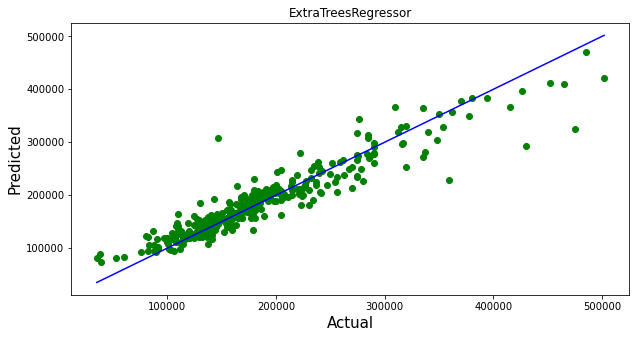

In [187]:
plt.figure(figsize=(10,5))
plt.scatter(y_test, prediction, c='g')
p1 = max(max(prediction), max(y_test))
p2 = min(min(prediction), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual', fontsize=15)
plt.ylabel('Predicted', fontsize=15)
plt.title("ExtraTreesRegressor")
plt.show()

Plotting Actual vs Predicted, To get better insight.Bule line is the actual line and green dots are the predicted values.

# Conclusion :


1) I hope this model will help companies to  predict the actual value of the prospective properties and decide whether    to invest in them or not.

2) There were large no. of feature present in our datasset, i anlyse the data and droped all the unneccessary feature.

3) From overall analysis and visualization i come into conclusion that , the feature that most effect the sales price    of a property are:


   [  OverallQual,
    GrLiveArea,
    ExterQual,
    KitchenQual,
    BsmtQual,
    GarageCars,
    GarageArea,
    TotalBsmtSF,
    1stFirSF,
    FullBath,
    KitchenAbvGr,
    GarageFinish,
    Year_SinceBuilt  ]
    
    
4) I've increased the accuray of best fit model  (ExtraTree Regressor) using Hyper Parameter Tuning from 88.23 to 88.63, a Model With 88.63 % accuray is quite a good model , and will be a great help in predicting nearly correct prices.


   
    
